In [219]:
import pandas as pd
import numpy as np
import talib as ta
import matplotlib.pyplot as plt
plt.style.use('bmh')

In [220]:
df = pd.read_csv('.\data\gbpusd_6m_may9th.csv')

In [221]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33953 entries, 0 to 33952
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DateTime  33953 non-null  object 
 1   Open      33953 non-null  float64
 2   High      33953 non-null  float64
 3   Low       33953 non-null  float64
 4   Close     33953 non-null  float64
 5   Volume    33953 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.6+ MB


In [222]:
df.head()

,DateTime,Open,High,Low,Close,Volume
0,2020-11-09 00:00:00,1.31797,1.31798,1.31731,1.31752,1005884032
1,2020-11-09 00:05:00,1.31751,1.31760,1.31702,1.31716,899025024
2,2020-11-09 00:10:00,1.31711,1.31727,1.31676,1.31720,772915968
3,2020-11-09 00:15:00,1.31720,1.31752,1.31704,1.31749,647590016
4,2020-11-09 00:20:00,1.31748,1.31786,1.31739,1.31758,955811008


In [223]:
df['DateTime'] = pd.to_datetime(df['DateTime'])

In [224]:
df.head()

,DateTime,Open,High,Low,Close,Volume
0,2020-11-09 00:00:00,1.31797,1.31798,1.31731,1.31752,1005884032
1,2020-11-09 00:05:00,1.31751,1.31760,1.31702,1.31716,899025024
2,2020-11-09 00:10:00,1.31711,1.31727,1.31676,1.31720,772915968
3,2020-11-09 00:15:00,1.31720,1.31752,1.31704,1.31749,647590016
4,2020-11-09 00:20:00,1.31748,1.31786,1.31739,1.31758,955811008


In [225]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33953 entries, 0 to 33952
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   DateTime  33953 non-null  datetime64[ns]
 1   Open      33953 non-null  float64       
 2   High      33953 non-null  float64       
 3   Low       33953 non-null  float64       
 4   Close     33953 non-null  float64       
 5   Volume    33953 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 1.6 MB


In [226]:
df = df.set_index('DateTime')

In [227]:
df['target3'] = df['Close'].shift(-3)


In [228]:
df['ema8'] = ta.EMA(df['Close'], timeperiod = 8)
df['ema21'] = ta.EMA(df['Close'], timeperiod = 21)
df['ema50'] = ta.EMA(df['Close'], timeperiod = 50)
df['ema200'] = ta.EMA(df['Close'], timeperiod = 200)

In [229]:
df['slowk'], df['slowd'] = ta.STOCH(df.High, df.Low, df.Close,
                                   fastk_period=14, slowk_period=1, slowd_period=5)

In [230]:
df = df.dropna()

In [231]:
import mplfinance as mpf

In [232]:
df.head()

,Open,High,Low,Close,Volume,target3,ema8,ema21,ema50,ema200,slowk,slowd
DateTime,,,,,,,,,,,,
2020-11-09 16:35:00,1.31403,1.31449,1.31366,1.31401,2147483647,1.31318,1.313857,1.314705,1.315726,1.316918,45.945946,37.985294
2020-11-09 16:40:00,1.31401,1.31415,1.31291,1.31306,1737888000,1.31349,1.313680,1.314556,1.315622,1.316880,35.097493,38.956555
2020-11-09 16:45:00,1.31307,1.31315,1.31208,1.31255,2147483647,1.31340,1.313429,1.314373,1.315501,1.316837,20.891365,36.084735
2020-11-09 16:50:00,1.31254,1.31318,1.31235,1.31318,2147483647,1.31393,1.313373,1.314265,1.315410,1.316800,38.440111,36.500030
2020-11-09 16:55:00,1.31318,1.31395,1.31301,1.31349,1887876992,1.31395,1.313399,1.314194,1.315335,1.316767,47.075209,37.490025


In [217]:
len(df)

33552

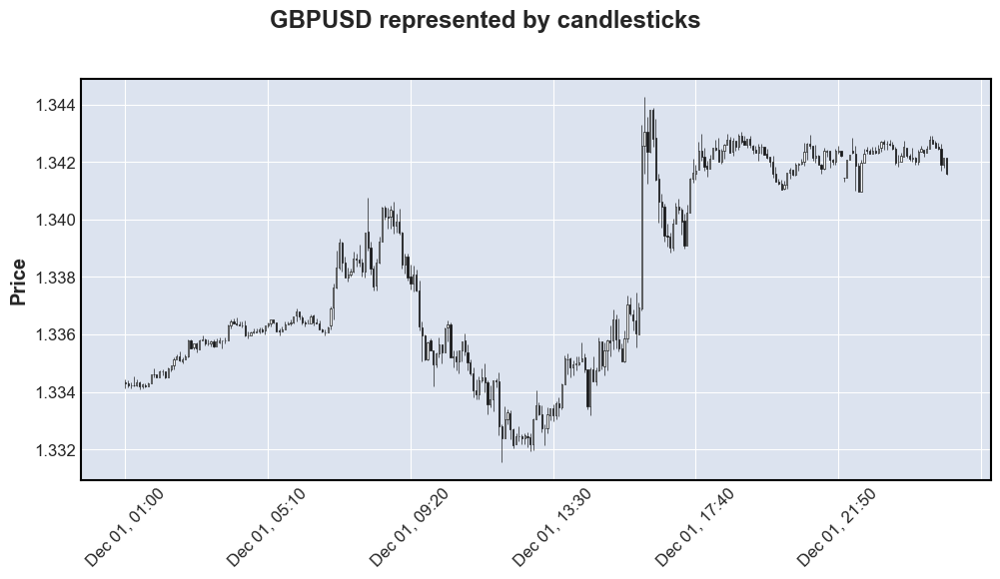

C:\Users\Neel\Anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:2062: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
C:\Users\Neel\Anaconda3\lib\site-packages\matplotlib\axes\_base.py:250: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]


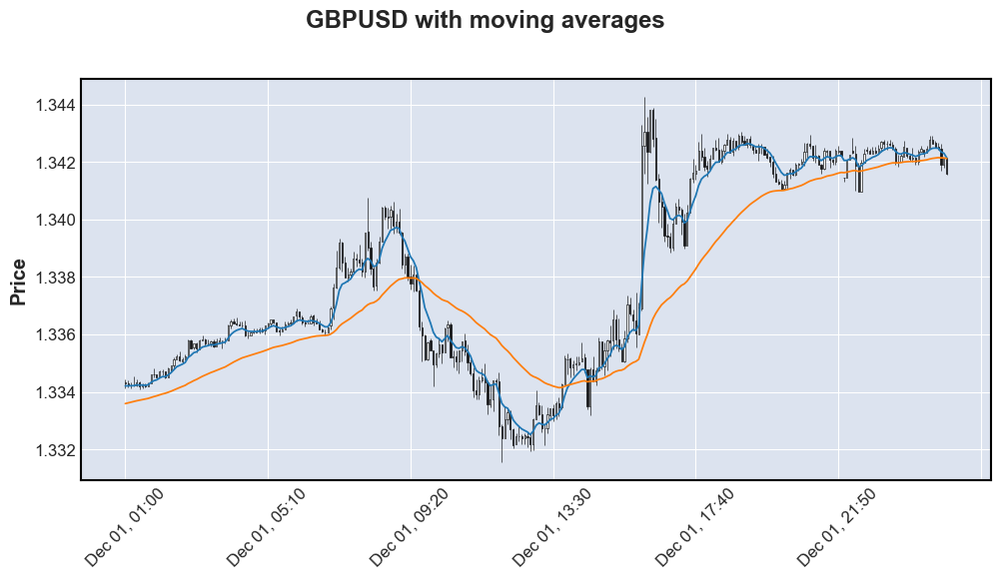

In [233]:
tcdf = df['2020-12-01 01:00:00':'2020-12-02 01:00:00'][['ema8','ema50']]  # DataFrame with two columns
apd  = mpf.make_addplot(tcdf)
mpf.plot(df['2020-12-01 01:00:00':'2020-12-02 01:00:00'], type='candle', title='GBPUSD represented by candlesticks', figratio=(22,10))
mpf.plot(df['2020-12-01 01:00:00':'2020-12-02 01:00:00'], type='candle', title='GBPUSD with moving averages', figratio=(22,10), addplot=apd)

# mpf.plot(stored_df['09-25-2020':'10-01-2020'],type='candle',volume=False,
#          show_nontrading=False, figratio=(16,10), style='charles', addplot=apd)

In [234]:
from sklearn.preprocessing import MinMaxScaler
from numpy import hstack
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error

In [235]:
def visualize_training_results(results):
    history = results.history
    plt.figure()
    plt.plot(history['val_loss'])
    plt.plot(history['loss'])
    plt.legend(['val_loss', 'loss'])
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()
    
    plt.figure()
    plt.plot(history['val_mse'])
    plt.plot(history['mse'])
    plt.legend(['val_mse', 'mse'])
    plt.title('Acc')
    plt.xlabel('Epochs')
    plt.ylabel('MSE')
    plt.show()

In [236]:
combined_df = df.copy()

In [237]:
# split into train / test - 2/3 for train, 1/3 for test
ema_50_train = combined_df['ema50'].iloc[:22300]
ema_50_test = combined_df['ema50'].iloc[22301:]
ema_200_train = combined_df['ema200'].iloc[:22300]
ema_200_test = combined_df['ema200'].iloc[22301:]
close_train = combined_df['Close'].iloc[:22300]
close_test = combined_df['Close'].iloc[22301:]
target3_train = combined_df['target3'].iloc[:22300]
target3_test = combined_df['target3'].iloc[22301:]

# #adding additional train / test splits for the rest of the models
ema_8_train = combined_df['ema8'].iloc[:22300]
ema_8_test = combined_df['ema8'].iloc[22301:]
ema_21_train = combined_df['ema21'].iloc[:22300]
ema_21_test = combined_df['ema21'].iloc[22301:]
# b_upper_train = combined_df['upperband'].iloc[:22300]
# b_upper_test = combined_df['upperband'].iloc[22301:]
# b_lower_train = combined_df['lowerband'].iloc[:22300]
# b_lower_test = combined_df['lowerband'].iloc[22301:]
# b_mid_train = combined_df['middleband'].iloc[:22300]
# b_mid_test = combined_df['middleband'].iloc[22301:]
# stoch_train = combined_df['stochastic'].iloc[:22300]
# stoch_test = combined_df['stochastic'].iloc[22301:]

open_train = combined_df['Open'].iloc[:22300]
open_test = combined_df['Open'].iloc[22301:]
high_train = combined_df['High'].iloc[:22300]
high_test = combined_df['High'].iloc[22301:]
low_train = combined_df['Low'].iloc[:22300]
low_test = combined_df['Low'].iloc[22301:]

In [238]:
# Reshape training data
ema_50_array = np.array(ema_50_train).reshape((len(ema_50_train), 1))
ema_200_array = np.array(ema_200_train).reshape((len(ema_200_train), 1))
close_array = np.array(close_train).reshape((len(close_train), 1))
target3_array = np.array(target3_train).reshape((len(target3_train), 1))

#reshaping additional features for the rest of the models
ema_8_array = np.array(ema_8_train).reshape((len(ema_8_train), 1))
ema_21_array = np.array(ema_21_train).reshape((len(ema_21_train), 1))

# b_upper_array = np.array(b_upper_train).reshape((len(b_upper_train), 1))
# b_lower_array = np.array(b_lower_train).reshape((len(b_lower_train), 1))
# b_mid_array = np.array(b_mid_train).reshape((len(b_mid_train), 1))
# stoch_array = np.array(stoch_train).reshape((len(stoch_train), 1))

open_array = np.array(open_train).reshape((len(open_train), 1))
high_array = np.array(high_train).reshape((len(high_train), 1))
low_array = np.array(low_train).reshape((len(low_train), 1))

In [239]:
t_ema_50_array = np.array(ema_50_test).reshape((len(ema_50_test), 1))
t_ema_200_array = np.array(ema_200_test).reshape((len(ema_200_test), 1))
t_close_array = np.array(close_test).reshape((len(close_test), 1))
t_target3_array = np.array(target3_test).reshape((len(target3_test), 1))


t_ema_8_array = np.array(ema_8_test).reshape((len(ema_8_test), 1))
t_ema_21_array = np.array(ema_21_test).reshape((len(ema_21_test), 1))

# t_b_upper_array = np.array(b_upper_test).reshape((len(b_upper_test), 1))
# t_b_lower_array = np.array(b_lower_test).reshape((len(b_lower_test), 1))
# t_b_mid_array = np.array(b_mid_test).reshape((len(b_mid_test), 1))
# t_stoch_array = np.array(stoch_test).reshape((len(stoch_test), 1))

t_open_array = np.array(open_test).reshape((len(open_test), 1))
t_high_array = np.array(high_test).reshape((len(high_test), 1))
t_low_array = np.array(low_test).reshape((len(low_test), 1))

In [240]:
# Scale data onto [0,1]
scaler = MinMaxScaler(feature_range = (0,1))

# Transform data
ema_50_training_scaled = scaler.fit_transform(ema_50_array)
ema_200_training_scaled = scaler.fit_transform(ema_200_array)
close_training_scaled = scaler.fit_transform(close_array)
target3_training_scaled = scaler.fit_transform(target3_array)


ema_8_training_scaled = scaler.fit_transform(ema_8_array)
ema_21_training_scaled = scaler.fit_transform(ema_21_array)

# b_upper_training_scaled = scaler.fit_transform(b_upper_array)
# b_lower_training_scaled = scaler.fit_transform(b_lower_array)
# b_mid_training_scaled = scaler.fit_transform(b_mid_array)
# stoch_training_scaled = scaler.fit_transform(stoch_array)

open_training_scaled = scaler.fit_transform(open_array)
high_training_scaled = scaler.fit_transform(high_array)
low_training_scaled = scaler.fit_transform(low_array)

In [241]:
ema_50_test_scaled = scaler.fit_transform(t_ema_50_array)
ema_200_test_scaled = scaler.fit_transform(t_ema_200_array)
close_test_scaled = scaler.fit_transform(t_close_array)
target3_test_scaled = scaler.fit_transform(t_target3_array)

ema_8_test_scaled = scaler.fit_transform(t_ema_8_array)
ema_21_test_scaled = scaler.fit_transform(t_ema_21_array)

# b_upper_test_scaled = scaler.fit_transform(t_b_upper_array)
# b_lower_test_scaled = scaler.fit_transform(t_b_lower_array)
# b_mid_test_scaled = scaler.fit_transform(t_b_mid_array)
# stoch_test_scaled = scaler.fit_transform(t_stoch_array)

open_test_scaled = scaler.fit_transform(t_open_array)
high_test_scaled = scaler.fit_transform(t_high_array)
low_test_scaled = scaler.fit_transform(t_low_array)

In [242]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = list(), list()
    for i in range(len(sequences)):
        # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the dataset
        if end_ix > len(sequences):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [243]:
# define input sequence
in_seq1 = ema_50_training_scaled
in_seq2 = ema_200_training_scaled

in_seq3 = ema_8_training_scaled
in_seq4 = ema_21_training_scaled

# in_seq5 = b_upper_training_scaled
# in_seq6 = b_lower_training_scaled
# in_seq7 = b_mid_training_scaled
# in_seq8 = stoch_training_scaled

in_seq9 = open_training_scaled
in_seq10 = high_training_scaled
in_seq11 = low_training_scaled
in_seq12 = close_training_scaled

out_seq = target3_training_scaled
# convert to [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
in_seq3 = in_seq3.reshape((len(in_seq3), 1))
in_seq4 = in_seq4.reshape((len(in_seq4), 1))
# in_seq5 = in_seq5.reshape((len(in_seq5), 1))
# in_seq6 = in_seq6.reshape((len(in_seq6), 1))
# in_seq7 = in_seq7.reshape((len(in_seq7), 1))
# in_seq8 = in_seq8.reshape((len(in_seq8), 1))
in_seq9 = in_seq9.reshape((len(in_seq9), 1))
in_seq10 = in_seq10.reshape((len(in_seq10), 1))
in_seq11 = in_seq11.reshape((len(in_seq11), 1))
in_seq12 = in_seq12.reshape((len(in_seq11), 1))
out_seq = out_seq.reshape((len(out_seq), 1))

In [244]:
# define test input sequence
t_in_seq1 = ema_50_test_scaled
t_in_seq2 = ema_200_test_scaled

t_in_seq3 = ema_8_test_scaled
t_in_seq4 = ema_21_test_scaled

# t_in_seq5 = b_upper_test_scaled
# t_in_seq6 = b_lower_test_scaled
# t_in_seq7 = b_mid_test_scaled
# t_in_seq8 = stoch_test_scaled

t_in_seq9 = open_test_scaled
t_in_seq10 = high_test_scaled
t_in_seq11 = low_test_scaled
t_in_seq12 = close_test_scaled
t_out_seq = target3_test_scaled



# convert to [rows, columns] structure
t_in_seq1 = t_in_seq1.reshape((len(t_in_seq1), 1))
t_in_seq2 = t_in_seq2.reshape((len(t_in_seq2), 1))

t_in_seq3 = t_in_seq3.reshape((len(t_in_seq3), 1))
t_in_seq4 = t_in_seq4.reshape((len(t_in_seq4), 1))
# t_in_seq5 = t_in_seq5.reshape((len(t_in_seq5), 1))
# t_in_seq6 = t_in_seq6.reshape((len(t_in_seq6), 1))
# t_in_seq7 = t_in_seq7.reshape((len(t_in_seq7), 1))
# t_in_seq8 = t_in_seq8.reshape((len(t_in_seq8), 1))
t_in_seq9 = t_in_seq9.reshape((len(t_in_seq9), 1))
t_in_seq10 = t_in_seq10.reshape((len(t_in_seq10), 1))
t_in_seq11 = t_in_seq11.reshape((len(t_in_seq11), 1))

t_out_seq = t_out_seq.reshape((len(t_out_seq), 1))

In [245]:
n_features3 = 6

In [246]:
dataset3 = hstack((in_seq1, in_seq2, in_seq9, in_seq10, in_seq11, in_seq11, out_seq))
# choose a number of time steps
n_steps = 6
# convert into input/output
X, y = split_sequences(dataset3, n_steps)

In [247]:
print(X.shape, y.shape)
# summarize the data
for i in range(len(X)):
    print(X[i], y[i])

(22295, 6, 6) (22295,)
[[0.03877839 0.03793419 0.02943052 0.02965127 0.02779056 0.02779056]
 [0.03779006 0.03755698 0.02924829 0.02664188 0.02088893 0.02088893]
 [0.03665144 0.03713366 0.02068337 0.01779076 0.01325113 0.01325113]
 [0.035791   0.03677614 0.01585421 0.01805629 0.01573571 0.01573571]
 [0.03507922 0.03645249 0.02168565 0.02487166 0.02180915 0.02180915]
 [0.03436199 0.03612327 0.02460137 0.02805806 0.02291341 0.02291341]] 0.03262553540508506
[[0.03779006 0.03755698 0.02924829 0.02664188 0.02088893 0.02088893]
 [0.03665144 0.03713366 0.02068337 0.01779076 0.01325113 0.01325113]
 [0.035791   0.03677614 0.01585421 0.01805629 0.01573571 0.01573571]
 [0.03507922 0.03645249 0.02168565 0.02487166 0.02180915 0.02180915]
 [0.03436199 0.03612327 0.02460137 0.02805806 0.02291341 0.02291341]
 [0.03386935 0.03584914 0.02359909 0.02796955 0.02466182 0.02466182]] 0.03326346486831255
[[0.03665144 0.03713366 0.02068337 0.01779076 0.01325113 0.01325113]
 [0.035791   0.03677614 0.01585421 0.0

 [0.05809217 0.03624676 0.07052392 0.06602939 0.07030459 0.07030459]] 0.06998997539414908
[[0.05684479 0.0355322  0.07025057 0.06549832 0.06772798 0.06772798]
 [0.0571052  0.03569514 0.06615034 0.06523278 0.06754394 0.06754394]
 [0.05748144 0.0358897  0.06888383 0.06824217 0.07002853 0.07002853]
 [0.05779102 0.03606863 0.07179954 0.06877323 0.07214503 0.07214503]
 [0.05809217 0.03624676 0.07052392 0.06602939 0.07030459 0.07030459]
 [0.05839263 0.03642605 0.07061503 0.06859621 0.07260513 0.07260513]] 0.06370181354233218
[[0.0571052  0.03569514 0.06615034 0.06523278 0.06754394 0.06754394]
 [0.05748144 0.0358897  0.06888383 0.06824217 0.07002853 0.07002853]
 [0.05779102 0.03606863 0.07179954 0.06877323 0.07214503 0.07214503]
 [0.05809217 0.03624676 0.07052392 0.06602939 0.07030459 0.07030459]
 [0.05839263 0.03642605 0.07061503 0.06859621 0.07260513 0.07260513]
 [0.05867389 0.0366016  0.07079727 0.06806514 0.07278918 0.07278918]] 0.0652510708101719
[[0.05748144 0.0358897  0.06888383 0.0682

 [0.11137477 0.06574775 0.13886105 0.14029032 0.14106929 0.14106929]] 0.1328715939123306
[[0.10671758 0.06313947 0.13703872 0.13772349 0.13619214 0.13619214]
 [0.10813968 0.06384999 0.14469248 0.14259161 0.14677464 0.14677464]
 [0.10926506 0.06448988 0.14523918 0.13807754 0.14180547 0.14180547]
 [0.11032778 0.06511852 0.13949886 0.13329793 0.13499586 0.13499586]
 [0.11137477 0.06574775 0.13886105 0.14029032 0.14106929 0.14106929]
 [0.11253639 0.06641178 0.13958998 0.13772349 0.14125334 0.14125334]] 0.136243506789393
[[0.10813968 0.06384999 0.14469248 0.14259161 0.14677464 0.14677464]
 [0.10926506 0.06448988 0.14523918 0.13807754 0.14180547 0.14180547]
 [0.11032778 0.06511852 0.13949886 0.13329793 0.13499586 0.13499586]
 [0.11137477 0.06574775 0.13886105 0.14029032 0.14106929 0.14106929]
 [0.11253639 0.06641178 0.13958998 0.13772349 0.14125334 0.14125334]
 [0.11339297 0.06700076 0.14350797 0.13896265 0.13803258 0.13803258]] 0.11765241957532169
[[0.10926506 0.06448988 0.14523918 0.138077

 [0.12473519 0.09760076 0.13211845 0.1291379  0.13297138 0.13297138]] 0.1454479176159662
[[0.12403023 0.09669831 0.13102506 0.1244468  0.1288304  0.1288304 ]
 [0.12410616 0.09689892 0.12692483 0.12267658 0.12855434 0.12855434]
 [0.12421248 0.09710633 0.12892938 0.12338467 0.1309469  0.1309469 ]
 [0.12441101 0.09733709 0.12965831 0.12542043 0.13223521 0.13223521]
 [0.12473519 0.09760076 0.13211845 0.1291379  0.13297138 0.13297138]
 [0.12508374 0.09787159 0.13539863 0.12975748 0.13702034 0.13702034]] 0.14672377654242297
[[0.12410616 0.09689892 0.12692483 0.12267658 0.12855434 0.12855434]
 [0.12421248 0.09710633 0.12892938 0.12338467 0.1309469  0.1309469 ]
 [0.12441101 0.09733709 0.12965831 0.12542043 0.13223521 0.13223521]
 [0.12473519 0.09760076 0.13211845 0.1291379  0.13297138 0.13297138]
 [0.12508374 0.09787159 0.13539863 0.12975748 0.13702034 0.13702034]
 [0.12556689 0.09817882 0.13621868 0.13391751 0.13895279 0.13895279]] 0.15055135332179148
[[0.12421248 0.09710633 0.12892938 0.1233

 [0.14295479 0.12036661 0.14031891 0.13347495 0.14088525 0.14088525]] 0.14271393420213307
[[0.14375586 0.11998302 0.14396355 0.13692689 0.14355388 0.14355388]
 [0.14358832 0.12009175 0.14104784 0.13657284 0.14373792 0.14373792]
 [0.14344959 0.12020527 0.141959   0.13577624 0.14401399 0.14401399]
 [0.14321993 0.12029224 0.14250569 0.13559922 0.14244962 0.14244962]
 [0.14295479 0.12036661 0.14031891 0.13347495 0.14088525 0.14088525]
 [0.14269634 0.12043926 0.1391344  0.13329793 0.14116131 0.14116131]] 0.1426228014216715
[[0.14358832 0.12009175 0.14104784 0.13657284 0.14373792 0.14373792]
 [0.14344959 0.12020527 0.141959   0.13577624 0.14401399 0.14401399]
 [0.14321993 0.12029224 0.14250569 0.13559922 0.14244962 0.14244962]
 [0.14295479 0.12036661 0.14031891 0.13347495 0.14088525 0.14088525]
 [0.14269634 0.12043926 0.1391344  0.13329793 0.14116131 0.14116131]
 [0.1425444  0.12053661 0.13904328 0.1346256  0.14134536 0.14134536]] 0.14380752756766668
[[0.14344959 0.12020527 0.141959   0.1357

 [0.10705412 0.11655314 0.09111617 0.0897504  0.0902733  0.0902733 ]] 0.081654971293176
[[0.11068118 0.11822988 0.08719818 0.08620995 0.084752   0.084752  ]
 [0.10954579 0.11775866 0.09157175 0.08674102 0.08797276 0.08797276]
 [0.10886268 0.11739968 0.08628702 0.09408745 0.08852489 0.08852489]
 [0.10799136 0.11698756 0.09640091 0.09098956 0.08585626 0.08585626]
 [0.10705412 0.11655314 0.09111617 0.0897504  0.0902733  0.0902733 ]
 [0.10595347 0.11607025 0.08865604 0.08417419 0.08419987 0.08419987]] 0.08047024514717904
[[0.10954579 0.11775866 0.09157175 0.08674102 0.08797276 0.08797276]
 [0.10886268 0.11739968 0.08628702 0.09408745 0.08852489 0.08852489]
 [0.10799136 0.11698756 0.09640091 0.09098956 0.08585626 0.08585626]
 [0.10705412 0.11655314 0.09111617 0.0897504  0.0902733  0.0902733 ]
 [0.10595347 0.11607025 0.08865604 0.08417419 0.08419987 0.08419987]
 [0.10471805 0.11554523 0.08355353 0.07895203 0.07886261 0.07886261]] 0.08156383851271443
[[0.10886268 0.11739968 0.08628702 0.09408

 [0.09840949 0.09346293 0.10287016 0.09753939 0.10389252 0.10389252]] 0.1010662535313962
[[0.09824791 0.09363641 0.10451025 0.0992211  0.10426061 0.10426061]
 [0.0983007  0.09359469 0.10223235 0.09807045 0.10416858 0.10416858]
 [0.09841814 0.09357099 0.10341686 0.09992919 0.10564093 0.10564093]
 [0.0984383  0.09352308 0.10523918 0.10046026 0.10518082 0.10518082]
 [0.09840949 0.09346293 0.10287016 0.09753939 0.10389252 0.10389252]
 [0.09839292 0.09340632 0.10168565 0.09798194 0.10416858 0.10416858]] 0.10051945684862851
[[0.0983007  0.09359469 0.10223235 0.09807045 0.10416858 0.10416858]
 [0.09841814 0.09357099 0.10341686 0.09992919 0.10564093 0.10564093]
 [0.0984383  0.09352308 0.10523918 0.10046026 0.10518082 0.10518082]
 [0.09840949 0.09346293 0.10287016 0.09753939 0.10389252 0.10389252]
 [0.09839292 0.09340632 0.10168565 0.09798194 0.10416858 0.10416858]
 [0.09840666 0.09335809 0.10205011 0.09709683 0.10352443 0.10352443]] 0.10161305021416212
[[0.09841814 0.09357099 0.10341686 0.0999

 [0.06926625 0.07662832 0.04883827 0.05682422 0.05051992 0.05051992]] 0.07281509158844379
[[0.07252205 0.0781862  0.0715262  0.06895026 0.0707647  0.0707647 ]
 [0.07169689 0.07780055 0.06870159 0.06505576 0.05328057 0.05328057]
 [0.07107091 0.07746273 0.05712984 0.05770933 0.05604123 0.05604123]
 [0.06996904 0.07699627 0.06123007 0.05664719 0.0504279  0.0504279 ]
 [0.06926625 0.07662832 0.04883827 0.05682422 0.05051992 0.05051992]
 [0.06893946 0.07635594 0.05740319 0.0614268  0.05861783 0.05861783]] 0.07855645675749656
[[0.07169689 0.07780055 0.06870159 0.06505576 0.05328057 0.05328057]
 [0.07107091 0.07746273 0.05712984 0.05770933 0.05604123 0.05604123]
 [0.06996904 0.07699627 0.06123007 0.05664719 0.0504279  0.0504279 ]
 [0.06926625 0.07662832 0.04883827 0.05682422 0.05051992 0.05051992]
 [0.06893946 0.07635594 0.05740319 0.0614268  0.05861783 0.05861783]
 [0.06878117 0.07612734 0.06624146 0.06956984 0.06837214 0.06837214]] 0.06853185090677272
[[0.07107091 0.07746273 0.05712984 0.057

 [0.01684263 0.03712706 0.00300683 0.00663834 0.00322076 0.00322076]] 0.011482730338103764
[[0.02038635 0.03937287 0.00756264 0.00460258 0.0055213  0.0055213 ]
 [0.01933342 0.03877406 0.00410023 0.0031864  0.0021165  0.0021165 ]
 [0.01837738 0.03819587 0.00118451 0.00371747 0.00257661 0.00257661]
 [0.01747366 0.03762735 0.00264237 0.00123916 0.00322076 0.00322076]
 [0.01684263 0.03712706 0.00300683 0.00663834 0.00322076 0.00322076]
 [0.01625487 0.03663664 0.00883827 0.00716941 0.00828195 0.00828195]] 0.014490112093319851
[[0.01933342 0.03877406 0.00410023 0.0031864  0.0021165  0.0021165 ]
 [0.01837738 0.03819587 0.00118451 0.00371747 0.00257661 0.00257661]
 [0.01747366 0.03762735 0.00264237 0.00123916 0.00322076 0.00322076]
 [0.01684263 0.03712706 0.00300683 0.00663834 0.00322076 0.00322076]
 [0.01625487 0.03663664 0.00883827 0.00716941 0.00828195 0.00828195]
 [0.01577542 0.03617359 0.00929385 0.00840857 0.0097543  0.0097543 ]] 0.011118199216259228
[[0.01837738 0.03819587 0.00118451 0.

 [0.00245352 0.01663812 0.01120729 0.01000177 0.00680961 0.00680961]] 0.01038913697256838
[[0.00272074 0.01785347 0.00683371 0.00557621 0.00717769 0.00717769]
 [0.0026423  0.01754309 0.00665148 0.01062135 0.00598141 0.00598141]
 [0.00251875 0.01722309 0.0061959  0.00805452 0.00717769 0.00717769]
 [0.00257055 0.01695125 0.00701595 0.01044433 0.00754578 0.00754578]
 [0.00245352 0.01663812 0.01120729 0.01000177 0.00680961 0.00680961]
 [0.00238556 0.01633983 0.00710706 0.00876261 0.00726972 0.00726972]] 0.010298004192106802
[[0.0026423  0.01754309 0.00665148 0.01062135 0.00598141 0.00598141]
 [0.00251875 0.01722309 0.0061959  0.00805452 0.00717769 0.00717769]
 [0.00257055 0.01695125 0.00701595 0.01044433 0.00754578 0.00754578]
 [0.00245352 0.01663812 0.01120729 0.01000177 0.00680961 0.00680961]
 [0.00238556 0.01633983 0.00710706 0.00876261 0.00726972 0.00726972]
 [0.00240923 0.01606798 0.00820046 0.00805452 0.00883408 0.00883408]] 0.010753668094412916
[[0.00251875 0.01722309 0.0061959  0.0

 [0.04414364 0.01609191 0.04164009 0.04160028 0.04306616 0.04306616]] 0.055044199398524896
[[0.04471017 0.01558511 0.04519362 0.0448752  0.04711512 0.04711512]
 [0.04478292 0.01577151 0.04774487 0.05239865 0.04748321 0.04748321]
 [0.0446823  0.01591107 0.05230068 0.04894672 0.04932364 0.04932364]
 [0.04431873 0.01597885 0.04810934 0.04478669 0.04242201 0.04242201]
 [0.04414364 0.01609191 0.04164009 0.04160028 0.04306616 0.04306616]
 [0.04405697 0.01622536 0.04583144 0.04478669 0.04628692 0.04628692]] 0.0517634193019223
[[0.04478292 0.01577151 0.04774487 0.05239865 0.04748321 0.04748321]
 [0.0446823  0.01591107 0.05230068 0.04894672 0.04932364 0.04932364]
 [0.04431873 0.01597885 0.04810934 0.04478669 0.04242201 0.04242201]
 [0.04414364 0.01609191 0.04164009 0.04160028 0.04306616 0.04306616]
 [0.04405697 0.01622536 0.04583144 0.04478669 0.04628692 0.04628692]
 [0.0440293  0.01637214 0.04792711 0.04717649 0.04923162 0.04923162]] 0.05030529481454771
[[0.0446823  0.01591107 0.05230068 0.048

 [0.05835587 0.03082808 0.06879271 0.06434767 0.06929235 0.06929235]] 0.0652510708101719
[[0.05760242 0.03000174 0.06842825 0.06346256 0.06855618 0.06855618]
 [0.05777751 0.03020503 0.06660592 0.06452469 0.0686482  0.0686482 ]
 [0.05795687 0.03040924 0.06742597 0.06284298 0.06763596 0.06763596]
 [0.05817738 0.03062413 0.06769932 0.06496725 0.06975246 0.06975246]
 [0.05835587 0.03082808 0.06879271 0.06434767 0.06929235 0.06929235]
 [0.05851255 0.03102609 0.06806378 0.06399363 0.06929235 0.06929235]] 0.062152556274492454
[[0.05777751 0.03020503 0.06660592 0.06452469 0.0686482  0.0686482 ]
 [0.05795687 0.03040924 0.06742597 0.06284298 0.06763596 0.06763596]
 [0.05817738 0.03062413 0.06769932 0.06496725 0.06975246 0.06975246]
 [0.05835587 0.03082808 0.06879271 0.06434767 0.06929235 0.06929235]
 [0.05851255 0.03102609 0.06806378 0.06399363 0.06929235 0.06929235]
 [0.05861488 0.03120942 0.06769932 0.06443618 0.06846416 0.06846416]] 0.06169689237218812
[[0.05795687 0.03040924 0.06742597 0.062

 [0.08635079 0.06848227 0.06341686 0.0606302  0.05631729 0.05631729]] 0.06452200856648105
[[0.09091561 0.06929745 0.06833713 0.06779961 0.06975246 0.06975246]
 [0.08994371 0.06915179 0.07252847 0.07054346 0.07297322 0.07297322]
 [0.08892095 0.06898411 0.07125285 0.06868472 0.07067268 0.07067268]
 [0.08770848 0.06875748 0.06952164 0.06540981 0.06275881 0.06275881]
 [0.08635079 0.06848227 0.06341686 0.0606302  0.05631729 0.05631729]
 [0.08518721 0.06824695 0.05840547 0.06124978 0.05916996 0.05916996]] 0.0628816185181833
[[0.08994371 0.06915179 0.07252847 0.07054346 0.07297322 0.07297322]
 [0.08892095 0.06898411 0.07125285 0.06868472 0.07067268 0.07067268]
 [0.08770848 0.06875748 0.06952164 0.06540981 0.06275881 0.06275881]
 [0.08635079 0.06848227 0.06341686 0.0606302  0.05631729 0.05631729]
 [0.08518721 0.06824695 0.05840547 0.06124978 0.05916996 0.05916996]
 [0.0837653  0.06793379 0.06205011 0.05815189 0.05456888 0.05456888]] 0.060785564567577666
[[0.08892095 0.06898411 0.07125285 0.068

 [0.07085773 0.06048391 0.08100228 0.07629669 0.08042698 0.08042698]] 0.07363528661259444
[[0.07016748 0.06035337 0.07216401 0.07116304 0.07398546 0.07398546]
 [0.07025388 0.06036124 0.07462415 0.07231368 0.07490568 0.07490568]
 [0.07048517 0.06040814 0.07726651 0.07567711 0.07895463 0.07895463]
 [0.07071109 0.06045555 0.08091116 0.07611967 0.08079507 0.08079507]
 [0.07085773 0.06048391 0.08100228 0.07629669 0.08042698 0.08042698]
 [0.07091335 0.0604895  0.07927107 0.07496902 0.07941474 0.07941474]] 0.07363528661259444
[[0.07025388 0.06036124 0.07462415 0.07231368 0.07490568 0.07490568]
 [0.07048517 0.06040814 0.07726651 0.07567711 0.07895463 0.07895463]
 [0.07071109 0.06045555 0.08091116 0.07611967 0.08079507 0.08079507]
 [0.07085773 0.06048391 0.08100228 0.07629669 0.08042698 0.08042698]
 [0.07091335 0.0604895  0.07927107 0.07496902 0.07941474 0.07941474]
 [0.07092602 0.06048428 0.07708428 0.07275624 0.0784025  0.0784025 ]] 0.07363528661259444
[[0.07048517 0.06040814 0.07726651 0.075

 [0.09570382 0.07737532 0.09867882 0.09426447 0.09855526 0.09855526]] 0.08694067255992088
[[0.09533302 0.07695102 0.10405467 0.10152239 0.10490476 0.10490476]
 [0.09564098 0.07711248 0.10451025 0.10134537 0.10564093 0.10564093]
 [0.09588125 0.07725766 0.1070615  0.10187644 0.10619306 0.10619306]
 [0.09582668 0.07732612 0.10569476 0.1016109  0.09910739 0.09910739]
 [0.09570382 0.07737532 0.09867882 0.09426447 0.09855526 0.09855526]
 [0.09545603 0.07738981 0.09694761 0.09302531 0.09542652 0.09542652]] 0.08201950241502054
[[0.09564098 0.07711248 0.10451025 0.10134537 0.10564093 0.10564093]
 [0.09588125 0.07725766 0.1070615  0.10187644 0.10619306 0.10619306]
 [0.09582668 0.07732612 0.10569476 0.1016109  0.09910739 0.09910739]
 [0.09570382 0.07737532 0.09867882 0.09426447 0.09855526 0.09855526]
 [0.09545603 0.07738981 0.09694761 0.09302531 0.09542652 0.09542652]
 [0.0951846  0.07739535 0.09357631 0.08957338 0.09459833 0.09459833]] 0.08621161031623181
[[0.09588125 0.07725766 0.1070615  0.101

 [0.12974441 0.10200985 0.13193622 0.12621703 0.13048679 0.13048679]] 0.13141346942495424
[[0.12956864 0.10119662 0.13494305 0.13267835 0.13214319 0.13214319]
 [0.12977212 0.1014434  0.1352164  0.13161622 0.13683629 0.13683629]
 [0.12986754 0.10166132 0.13767654 0.13161622 0.13683629 0.13683629]
 [0.12983688 0.10184481 0.13494305 0.1315277  0.13398362 0.13398362]
 [0.12974441 0.10200985 0.13193622 0.12621703 0.13048679 0.13048679]
 [0.12961109 0.10216151 0.13038724 0.12515489 0.12745008 0.12745008]] 0.13132233664449267
[[0.12977212 0.1014434  0.1352164  0.13161622 0.13683629 0.13683629]
 [0.12986754 0.10166132 0.13767654 0.13161622 0.13683629 0.13683629]
 [0.12983688 0.10184481 0.13494305 0.1315277  0.13398362 0.13398362]
 [0.12974441 0.10200985 0.13193622 0.12621703 0.13048679 0.13048679]
 [0.12961109 0.10216151 0.13038724 0.12515489 0.12745008 0.12745008]
 [0.12952748 0.1023234  0.1295672  0.12559745 0.13021073 0.13021073]] 0.1261277681582076
[[0.12986754 0.10166132 0.13767654 0.1316

 [0.13355316 0.11742561 0.14068337 0.13931669 0.14327781 0.14327781]] 0.14289619976305445
[[0.13236691 0.1168386  0.14095672 0.13568773 0.14336984 0.14336984]
 [0.13269048 0.11699036 0.14241458 0.13728093 0.14530229 0.14530229]
 [0.13291239 0.11711714 0.14296128 0.13648433 0.14373792 0.14373792]
 [0.13311819 0.1172407  0.1408656  0.13480262 0.14318579 0.14318579]
 [0.13355316 0.11742561 0.14068337 0.13931669 0.14327781 0.14327781]
 [0.13388582 0.11758619 0.14651481 0.14073287 0.1457624  0.1457624 ]] 0.14244053586075012
[[0.13269048 0.11699036 0.14241458 0.13728093 0.14530229 0.14530229]
 [0.13291239 0.11711714 0.14296128 0.13648433 0.14373792 0.14373792]
 [0.13311819 0.1172407  0.1408656  0.13480262 0.14318579 0.14318579]
 [0.13355316 0.11742561 0.14068337 0.13931669 0.14327781 0.14327781]
 [0.13388582 0.11758619 0.14651481 0.14073287 0.1457624  0.1457624 ]
 [0.13412387 0.11772366 0.14441913 0.13772349 0.14456612 0.14456612]] 0.14326073088490077
[[0.13291239 0.11711714 0.14296128 0.136

 [0.15419929 0.13430273 0.1532574  0.14737122 0.1521119  0.1521119 ]] 0.15401439897931546
[[0.15477279 0.1339532  0.15444191 0.14781377 0.15588479 0.15588479]
 [0.15483304 0.13409697 0.15353075 0.15206231 0.15616085 0.15616085]
 [0.15460549 0.13416402 0.15826879 0.15073464 0.15404435 0.15404435]
 [0.15447584 0.13425386 0.15107062 0.14781377 0.15367627 0.15367627]
 [0.15419929 0.13430273 0.1532574  0.14737122 0.1521119  0.1521119 ]
 [0.1541041  0.13439609 0.14961276 0.14754824 0.15257201 0.15257201]] 0.14772623712749677
[[0.15483304 0.13409697 0.15353075 0.15206231 0.15616085 0.15616085]
 [0.15460549 0.13416402 0.15826879 0.15073464 0.15404435 0.15404435]
 [0.15447584 0.13425386 0.15107062 0.14781377 0.15367627 0.15367627]
 [0.15419929 0.13430273 0.1532574  0.14737122 0.1521119  0.1521119 ]
 [0.1541041  0.13439609 0.14961276 0.14754824 0.15257201 0.15257201]
 [0.15406824 0.13450318 0.15398633 0.14922995 0.15229594 0.15229594]] 0.14608584707919547
[[0.15460549 0.13416402 0.15826879 0.150

 [0.12221394 0.13066829 0.12145786 0.11506461 0.12100856 0.12100856]] 0.1152829672833331
[[0.12290152 0.13155654 0.12182232 0.11586121 0.12294101 0.12294101]
 [0.12282154 0.1313575  0.12209567 0.11771995 0.12358517 0.12358517]
 [0.12265945 0.13113796 0.12400911 0.11816251 0.12358517 0.12358517]
 [0.12248517 0.1309157  0.1222779  0.11674633 0.1233091  0.1233091 ]
 [0.12221394 0.13066829 0.12145786 0.11506461 0.12100856 0.12100856]
 [0.12196447 0.13042626 0.11908884 0.11373694 0.12091654 0.12091654]] 0.11355144445457199
[[0.12282154 0.1313575  0.12209567 0.11771995 0.12358517 0.12358517]
 [0.12265945 0.13113796 0.12400911 0.11816251 0.12358517 0.12358517]
 [0.12248517 0.1309157  0.1222779  0.11674633 0.1233091  0.1233091 ]
 [0.12221394 0.13066829 0.12145786 0.11506461 0.12100856 0.12100856]
 [0.12196447 0.13042626 0.11908884 0.11373694 0.12091654 0.12091654]
 [0.12173589 0.13018958 0.11908884 0.11364843 0.12036441 0.12036441]] 0.11355144445457199
[[0.12265945 0.13113796 0.12400911 0.1181

 [0.10397965 0.11148806 0.10514806 0.10187644 0.10573295 0.10573295]] 0.0953248883623452
[[0.10439351 0.11229958 0.1008656  0.10010621 0.1029723  0.1029723 ]
 [0.10449072 0.11214744 0.10569476 0.1055054  0.10821754 0.10821754]
 [0.10428757 0.1119186  0.11052392 0.10435475 0.10554891 0.10554891]
 [0.10417023 0.11171257 0.10332574 0.10090281 0.10554891 0.10554891]
 [0.10397965 0.11148806 0.10514806 0.10187644 0.10573295 0.10573295]
 [0.10369275 0.1112384  0.10323462 0.09895557 0.10306432 0.10306432]] 0.0970564111911063
[[0.10449072 0.11214744 0.10569476 0.1055054  0.10821754 0.10821754]
 [0.10428757 0.1119186  0.11052392 0.10435475 0.10554891 0.10554891]
 [0.10417023 0.11171257 0.10332574 0.10090281 0.10554891 0.10554891]
 [0.10397965 0.11148806 0.10514806 0.10187644 0.10573295 0.10573295]
 [0.10369275 0.1112384  0.10323462 0.09895557 0.10306432 0.10306432]
 [0.10308719 0.11090421 0.10068337 0.09497256 0.09220576 0.09220576]] 0.09404902943589022
[[0.10428757 0.1119186  0.11052392 0.10435

 [0.13131795 0.11219704 0.1323918  0.12630554 0.13435171 0.13435171]] 0.12849722045019618
[[0.13182593 0.11190511 0.12683371 0.12391574 0.12956658 0.12956658]
 [0.13166287 0.11197201 0.12892938 0.1244468  0.13149903 0.13149903]
 [0.13147656 0.11203041 0.13056948 0.1244468  0.13223521 0.13223521]
 [0.13140134 0.11211562 0.12993166 0.12657107 0.13269532 0.13269532]
 [0.13131795 0.11219704 0.1323918  0.12630554 0.13435171 0.13435171]
 [0.13110068 0.11224147 0.13248292 0.12586298 0.13149903 0.13149903]] 0.12849722045019618
[[0.13166287 0.11197201 0.12892938 0.1244468  0.13149903 0.13149903]
 [0.13147656 0.11203041 0.13056948 0.1244468  0.13223521 0.13223521]
 [0.13140134 0.11211562 0.12993166 0.12657107 0.13269532 0.13269532]
 [0.13131795 0.11219704 0.1323918  0.12630554 0.13435171 0.13435171]
 [0.13110068 0.11224147 0.13248292 0.12586298 0.13149903 0.13149903]
 [0.13084003 0.11227177 0.12874715 0.122057   0.12975062 0.12975062]] 0.12685683040189843
[[0.13147656 0.11203041 0.13056948 0.124

 [0.14635647 0.12387015 0.15908884 0.15170827 0.15827735 0.15827735]] 0.157933108539142
[[0.14465608 0.12287739 0.15635535 0.14984953 0.15864544 0.15864544]
 [0.14500927 0.12310399 0.15571754 0.14861037 0.1555167  0.1555167 ]
 [0.14544869 0.12335473 0.15571754 0.15108869 0.1584614  0.1584614 ]
 [0.14591166 0.12361373 0.15799544 0.15179678 0.16085396 0.16085396]
 [0.14635647 0.12387015 0.15908884 0.15170827 0.15827735 0.15827735]
 [0.1467579  0.12411718 0.15927107 0.15170827 0.15919757 0.15919757]] 0.15683951517361017
[[0.14500927 0.12310399 0.15571754 0.14861037 0.1555167  0.1555167 ]
 [0.14544869 0.12335473 0.15571754 0.15108869 0.1584614  0.1584614 ]
 [0.14591166 0.12361373 0.15799544 0.15179678 0.16085396 0.16085396]
 [0.14635647 0.12387015 0.15908884 0.15170827 0.15827735 0.15827735]
 [0.1467579  0.12411718 0.15927107 0.15170827 0.15919757 0.15919757]
 [0.14717694 0.12437055 0.15845103 0.15321296 0.16039385 0.16039385]] 0.16221634922081662
[[0.14544869 0.12335473 0.15571754 0.15108

 [0.15698812 0.13994115 0.15444191 0.14869888 0.15560872 0.15560872]] 0.15009568941948714
[[0.15739105 0.13966141 0.15872437 0.15321296 0.16159014 0.16159014]
 [0.15742276 0.13976793 0.16009112 0.15259338 0.16177418 0.16177418]
 [0.15741987 0.1398646  0.16       0.15285891 0.16159014 0.16159014]
 [0.15722803 0.13991043 0.15927107 0.15170827 0.15726511 0.15726511]
 [0.15698812 0.13994115 0.15444191 0.14869888 0.15560872 0.15560872]
 [0.15689477 0.14000773 0.15316629 0.14905293 0.15459648 0.15459648]] 0.1481819010298029
[[0.15742276 0.13976793 0.16009112 0.15259338 0.16177418 0.16177418]
 [0.15741987 0.1398646  0.16       0.15285891 0.16159014 0.16159014]
 [0.15722803 0.13991043 0.15927107 0.15170827 0.15726511 0.15726511]
 [0.15698812 0.13994115 0.15444191 0.14869888 0.15560872 0.15560872]
 [0.15689477 0.14000773 0.15316629 0.14905293 0.15459648 0.15459648]
 [0.15664939 0.14003259 0.15653759 0.15002655 0.15570075 0.15570075]] 0.15118928278501897
[[0.15741987 0.1398646  0.16       0.1528

 [0.19044454 0.1651686  0.19653759 0.18844043 0.19895095 0.19895095]] 0.1936571584799065
[[0.18938606 0.16414487 0.19917995 0.19499026 0.20235576 0.20235576]
 [0.18971624 0.16441745 0.1994533  0.19224642 0.20161958 0.20161958]
 [0.18998529 0.16467461 0.19817768 0.19012215 0.20033128 0.20033128]
 [0.19022896 0.1649253  0.19690205 0.18879448 0.19839882 0.19839882]
 [0.19044454 0.1651686  0.19653759 0.18844043 0.19895095 0.19895095]
 [0.19055899 0.16538505 0.196082   0.18782085 0.1970185  0.1970185 ]] 0.19247243233391131
[[0.18971624 0.16441745 0.1994533  0.19224642 0.20161958 0.20161958]
 [0.18998529 0.16467461 0.19817768 0.19012215 0.20033128 0.20033128]
 [0.19022896 0.1649253  0.19690205 0.18879448 0.19839882 0.19839882]
 [0.19044454 0.1651686  0.19653759 0.18844043 0.19895095 0.19895095]
 [0.19055899 0.16538505 0.196082   0.18782085 0.1970185  0.1970185 ]
 [0.1906949  0.16560618 0.19398633 0.18693574 0.19738658 0.19738658]] 0.19119657340745455
[[0.18998529 0.16467461 0.19817768 0.1901

 [0.19304278 0.19262849 0.19407745 0.18587361 0.19527008 0.19527008]] 0.19338376013852354
[[0.19305317 0.19287749 0.19507973 0.18649318 0.19793871 0.19793871]
 [0.1930505  0.1928143  0.19498861 0.18675872 0.19352167 0.19352167]
 [0.19304051 0.1927498  0.19353075 0.18498849 0.19665041 0.19665041]
 [0.19306058 0.19269375 0.1932574  0.18613914 0.194902   0.194902  ]
 [0.19304278 0.19262849 0.19407745 0.18587361 0.19527008 0.19527008]
 [0.19302939 0.19256485 0.1932574  0.18489998 0.19554615 0.19554615]] 0.19374829126036808
[[0.1930505  0.1928143  0.19498861 0.18675872 0.19352167 0.19352167]
 [0.19304051 0.1927498  0.19353075 0.18498849 0.19665041 0.19665041]
 [0.19306058 0.19269375 0.1932574  0.18613914 0.194902   0.194902  ]
 [0.19304278 0.19262849 0.19407745 0.18587361 0.19527008 0.19527008]
 [0.19302939 0.19256485 0.1932574  0.18489998 0.19554615 0.19554615]
 [0.19301653 0.19250185 0.19307517 0.18489998 0.19646637 0.19646637]] 0.1958443452109737
[[0.19304051 0.1927498  0.19353075 0.1849

 [0.1984149  0.19253866 0.19908884 0.19144981 0.20106745 0.20106745]] 0.20131231203863997
[[0.19833428 0.19253423 0.20218679 0.19401664 0.20401215 0.20401215]
 [0.19836545 0.19253802 0.20127563 0.19277748 0.20207969 0.20207969]
 [0.19835462 0.19253101 0.19954442 0.19118428 0.20079139 0.20079139]
 [0.19836646 0.19252994 0.19854214 0.1905647  0.20033128 0.20033128]
 [0.1984149  0.19253866 0.19908884 0.19144981 0.20106745 0.20106745]
 [0.19850963 0.19256001 0.2        0.19277748 0.20244778 0.20244778]] 0.20441082657431942
[[0.19836545 0.19253802 0.20127563 0.19277748 0.20207969 0.20207969]
 [0.19835462 0.19253101 0.19954442 0.19118428 0.20079139 0.20079139]
 [0.19836646 0.19252994 0.19854214 0.1905647  0.20033128 0.20033128]
 [0.1984149  0.19253866 0.19908884 0.19144981 0.20106745 0.20106745]
 [0.19850963 0.19256001 0.2        0.19277748 0.20244778 0.20244778]
 [0.1985784  0.19257527 0.20118451 0.19295451 0.20364406 0.20364406]] 0.20532215437892987
[[0.19835462 0.19253101 0.19954442 0.191

 [0.21087845 0.20377553 0.2090205  0.20012392 0.20548449 0.20548449]] 0.21179258179166993
[[0.21109987 0.20376856 0.20920273 0.20755886 0.21220208 0.21220208]
 [0.21124577 0.20382287 0.21685649 0.21083378 0.21809147 0.21809147]
 [0.21126733 0.20384535 0.21457859 0.20570012 0.21385847 0.21385847]
 [0.21118054 0.20383925 0.21175399 0.20269074 0.21109782 0.21109782]
 [0.21087845 0.20377553 0.2090205  0.20012392 0.20548449 0.20548449]
 [0.210692   0.20373981 0.203918   0.19746858 0.20520843 0.20520843]] 0.21416203408366208
[[0.21124577 0.20382287 0.21685649 0.21083378 0.21809147 0.21809147]
 [0.21126733 0.20384535 0.21457859 0.20570012 0.21385847 0.21385847]
 [0.21118054 0.20383925 0.21175399 0.20269074 0.21109782 0.21109782]
 [0.21087845 0.20377553 0.2090205  0.20012392 0.20548449 0.20548449]
 [0.210692   0.20373981 0.203918   0.19746858 0.20520843 0.20520843]
 [0.21066485 0.20374454 0.2061959  0.20215967 0.20962547 0.20962547]] 0.21379750296181577
[[0.21126733 0.20384535 0.21457859 0.205

 [0.22816535 0.21351823 0.23088838 0.22234024 0.23401123 0.23401123]] 0.23430237856557135
[[0.22745567 0.21295279 0.2309795  0.22136661 0.23327505 0.23327505]
 [0.22766447 0.21310149 0.2298861  0.22260577 0.23327505 0.23327505]
 [0.22788362 0.21325359 0.23179954 0.22295982 0.23483942 0.23483942]
 [0.22803486 0.21338854 0.23234624 0.22269428 0.23456336 0.23456336]
 [0.22816535 0.21351823 0.23088838 0.22234024 0.23401123 0.23401123]
 [0.22836856 0.21366717 0.23052392 0.22375642 0.23336707 0.23336707]] 0.2339378474437268
[[0.22766447 0.21310149 0.2298861  0.22260577 0.23327505 0.23327505]
 [0.22788362 0.21325359 0.23179954 0.22295982 0.23483942 0.23483942]
 [0.22803486 0.21338854 0.23234624 0.22269428 0.23456336 0.23456336]
 [0.22816535 0.21351823 0.23088838 0.22234024 0.23401123 0.23401123]
 [0.22836856 0.21366717 0.23052392 0.22375642 0.23336707 0.23336707]
 [0.22857122 0.21381657 0.23243736 0.22393344 0.23520751 0.23520751]] 0.23138612959081506
[[0.22788362 0.21325359 0.23179954 0.2229

 [0.20688145 0.21149602 0.21640091 0.20906355 0.2165271  0.2165271 ]] 0.21935660256994538
[[0.20569468 0.2116379  0.20628702 0.19976987 0.20833717 0.20833717]
 [0.20595247 0.21158751 0.20820046 0.20543459 0.20980952 0.20980952]
 [0.20611488 0.21151513 0.21211845 0.2063197  0.21257017 0.21257017]
 [0.20653041 0.21151192 0.21002278 0.20808993 0.2131223  0.2131223 ]
 [0.20688145 0.21149602 0.21640091 0.20906355 0.2165271  0.2165271 ]
 [0.20747079 0.21154677 0.21539863 0.21764914 0.21882764 0.21882764]] 0.21826300920441355
[[0.20595247 0.21158751 0.20820046 0.20543459 0.20980952 0.20980952]
 [0.20611488 0.21151513 0.21211845 0.2063197  0.21257017 0.21257017]
 [0.20653041 0.21151192 0.21002278 0.20808993 0.2131223  0.2131223 ]
 [0.20688145 0.21149602 0.21640091 0.20906355 0.2165271  0.2165271 ]
 [0.20747079 0.21154677 0.21539863 0.21764914 0.21882764 0.21882764]
 [0.20779237 0.21153248 0.22132118 0.21331209 0.21901169 0.21901169]] 0.2164403535951891
[[0.20611488 0.21151513 0.21211845 0.2063

 [0.24961415 0.22864473 0.25476082 0.24738892 0.25821294 0.25821294]] 0.2532579969014854
[[0.24853856 0.22770237 0.25794989 0.24774296 0.25692463 0.25692463]
 [0.248636   0.227893   0.25302961 0.24305187 0.25232355 0.25232355]
 [0.24890756 0.22812868 0.2495672  0.24393698 0.25351983 0.25351983]
 [0.24920554 0.22837178 0.25366743 0.24464507 0.25600442 0.25600442]
 [0.24961415 0.22864473 0.25476082 0.24738892 0.25821294 0.25821294]
 [0.25001045 0.22891594 0.25776765 0.24915914 0.2606055  0.2606055 ]] 0.2522555363164134
[[0.248636   0.227893   0.25302961 0.24305187 0.25232355 0.25232355]
 [0.24890756 0.22812868 0.2495672  0.24393698 0.25351983 0.25351983]
 [0.24920554 0.22837178 0.25366743 0.24464507 0.25600442 0.25600442]
 [0.24961415 0.22864473 0.25476082 0.24738892 0.25821294 0.25821294]
 [0.25001045 0.22891594 0.25776765 0.24915914 0.2606055  0.2606055 ]
 [0.25030595 0.22916197 0.25813212 0.24774296 0.25775283 0.25775283]] 0.2515264740727261
[[0.24890756 0.22812868 0.2495672  0.243936

 [0.24304665 0.24289073 0.22769932 0.22357939 0.23023834 0.23023834]] 0.22919894285974785
[[0.24511406 0.24357276 0.23872437 0.22906709 0.23916444 0.23916444]
 [0.24456736 0.24340016 0.23535308 0.22667729 0.23125058 0.23125058]
 [0.24407546 0.24323807 0.2304328  0.22304833 0.23125058 0.23125058]
 [0.24346569 0.24304142 0.23107062 0.22180917 0.23079047 0.23079047]
 [0.24304665 0.24289073 0.22769932 0.22357939 0.23023834 0.23023834]
 [0.24265516 0.24274446 0.23189066 0.22357939 0.23318303 0.23318303]] 0.23083933290804737
[[0.24456736 0.24340016 0.23535308 0.22667729 0.23125058 0.23125058]
 [0.24407546 0.24323807 0.2304328  0.22304833 0.23125058 0.23125058]
 [0.24346569 0.24304142 0.23107062 0.22180917 0.23079047 0.23079047]
 [0.24304665 0.24289073 0.22769932 0.22357939 0.23023834 0.23023834]
 [0.24265516 0.24274446 0.23189066 0.22357939 0.23318303 0.23318303]
 [0.24214928 0.24256544 0.23216401 0.22402195 0.2326309  0.2326309 ]] 0.2272851544700636
[[0.24407546 0.24323807 0.2304328  0.2230

 [0.21427805 0.22254407 0.2242369  0.21508232 0.22453299 0.22453299]] 0.22291078100793094
[[0.21215612 0.22258841 0.22232346 0.21375465 0.22324469 0.22324469]
 [0.21275361 0.2225855  0.22296128 0.21986192 0.2262814  0.2262814 ]
 [0.21348707 0.22262466 0.22678815 0.22278279 0.23042238 0.23042238]
 [0.2139434  0.22259792 0.23034169 0.22145512 0.22674151 0.22674151]
 [0.21427805 0.22254407 0.2242369  0.21508232 0.22453299 0.22453299]
 [0.21457733 0.22248488 0.221959   0.21384316 0.22425692 0.22425692]] 0.22418663993438415
[[0.21275361 0.2225855  0.22296128 0.21986192 0.2262814  0.2262814 ]
 [0.21348707 0.22262466 0.22678815 0.22278279 0.23042238 0.23042238]
 [0.2139434  0.22259792 0.23034169 0.22145512 0.22674151 0.22674151]
 [0.21427805 0.22254407 0.2242369  0.21508232 0.22453299 0.22453299]
 [0.21457733 0.22248488 0.221959   0.21384316 0.22425692 0.22425692]
 [0.2149353  0.22244487 0.22177677 0.21596743 0.22545321 0.22545321]] 0.22099699261824668
[[0.21348707 0.22262466 0.22678815 0.222

 [0.23753997 0.22666704 0.23234624 0.2259692  0.23548357 0.23548357]] 0.24068167319784983
[[0.23793646 0.22651167 0.23708428 0.22791645 0.23916444 0.23916444]
 [0.23787141 0.22656162 0.23562642 0.22711984 0.23713997 0.23713997]
 [0.23776442 0.22659935 0.23535308 0.22667729 0.23778412 0.23778412]
 [0.23758378 0.22661617 0.23425968 0.22464153 0.23511549 0.23511549]
 [0.23753997 0.22666704 0.23234624 0.2259692  0.23548357 0.23548357]
 [0.23746822 0.22670959 0.23544419 0.22685431 0.23796816 0.23796816]] 0.23721862754032763
[[0.23787141 0.22656162 0.23562642 0.22711984 0.23713997 0.23713997]
 [0.23776442 0.22659935 0.23535308 0.22667729 0.23778412 0.23778412]
 [0.23758378 0.22661617 0.23425968 0.22464153 0.23511549 0.23511549]
 [0.23753997 0.22666704 0.23234624 0.2259692  0.23548357 0.23548357]
 [0.23746822 0.22670959 0.23544419 0.22685431 0.23796816 0.23796816]
 [0.23742153 0.22675757 0.23471526 0.22588069 0.2381522  0.2381522 ]] 0.23776542422309355
[[0.23776442 0.22659935 0.23535308 0.226

 [0.20958632 0.21595682 0.2157631  0.20658524 0.2156989  0.2156989 ]] 0.22181718764239555
[[0.20876322 0.21625173 0.2191344  0.21455125 0.22085212 0.22085212]
 [0.20901187 0.21618476 0.21694761 0.2118074  0.21836753 0.21836753]
 [0.20918034 0.21609988 0.21476082 0.20640821 0.21395049 0.21395049]
 [0.209446   0.21604322 0.2129385  0.20667375 0.21542284 0.21542284]
 [0.20958632 0.21595682 0.2157631  0.20658524 0.2156989  0.2156989 ]
 [0.20974339 0.21587714 0.21284738 0.21198442 0.21615901 0.21615901]] 0.21972113369178992
[[0.20901187 0.21618476 0.21694761 0.2118074  0.21836753 0.21836753]
 [0.20918034 0.21609988 0.21476082 0.20640821 0.21395049 0.21395049]
 [0.209446   0.21604322 0.2129385  0.20667375 0.21542284 0.21542284]
 [0.20958632 0.21595682 0.2157631  0.20658524 0.2156989  0.2156989 ]
 [0.20974339 0.21587714 0.21284738 0.21198442 0.21615901 0.21615901]
 [0.21025015 0.21589212 0.21321185 0.21472827 0.21680317 0.21680317]] 0.21844527476533493
[[0.20918034 0.21609988 0.21476082 0.206

 [0.20894655 0.19986955 0.21248292 0.20605417 0.21606699 0.21606699]] 0.21716941583887817
[[0.20805355 0.19951871 0.21193622 0.20516906 0.2152388  0.2152388 ]
 [0.20829667 0.19960944 0.21275626 0.2055231  0.21606699 0.21606699]
 [0.20853397 0.19970024 0.21412301 0.20640821 0.21717125 0.21717125]
 [0.20869523 0.19977255 0.21439636 0.20561161 0.21422656 0.21422656]
 [0.20894655 0.19986955 0.21248292 0.20605417 0.21606699 0.21606699]
 [0.20925845 0.19998416 0.21476082 0.20826695 0.21827551 0.21827551]] 0.2151644946687341
[[0.20829667 0.19960944 0.21275626 0.2055231  0.21606699 0.21606699]
 [0.20853397 0.19970024 0.21412301 0.20640821 0.21717125 0.21717125]
 [0.20869523 0.19977255 0.21439636 0.20561161 0.21422656 0.21422656]
 [0.20894655 0.19986955 0.21248292 0.20605417 0.21606699 0.21606699]
 [0.20925845 0.19998416 0.21476082 0.20826695 0.21827551 0.21827551]
 [0.20958035 0.2001035  0.21649203 0.20870951 0.21891967 0.21891967]] 0.2153467602296555
[[0.20853397 0.19970024 0.21412301 0.20640

 [0.21574053 0.20360212 0.24318907 0.23411223 0.23410325 0.23410325]] 0.23812995534493808
[[0.21160264 0.20232338 0.22870159 0.22773942 0.22913408 0.22913408]
 [0.21245908 0.20258468 0.23462415 0.2275624  0.23447134 0.23447134]
 [0.21368598 0.20294996 0.23243736 0.23313861 0.23585166 0.23585166]
 [0.21489071 0.20331845 0.24255125 0.24243229 0.2432134  0.2432134 ]
 [0.21574053 0.20360212 0.24318907 0.23411223 0.23410325 0.23410325]
 [0.21649771 0.20386732 0.23553531 0.2291556  0.2360357  0.2360357 ]] 0.22391324159300297
[[0.21245908 0.20258468 0.23462415 0.2275624  0.23447134 0.23447134]
 [0.21368598 0.20294996 0.23243736 0.23313861 0.23585166 0.23585166]
 [0.21489071 0.20331845 0.24255125 0.24243229 0.2432134  0.2432134 ]
 [0.21574053 0.20360212 0.24318907 0.23411223 0.23410325 0.23410325]
 [0.21649771 0.20386732 0.23553531 0.2291556  0.2360357  0.2360357 ]
 [0.21726969 0.20414161 0.23425968 0.22773942 0.23760007 0.23760007]] 0.23202405905404255
[[0.21368598 0.20294996 0.23243736 0.233

 [0.24139724 0.21955859 0.24519362 0.24340591 0.24753842 0.24753842]] 0.267019046751118
[[0.23943678 0.21837024 0.24965831 0.25146044 0.2516794  0.2516794 ]
 [0.24020254 0.21873586 0.26214123 0.26208178 0.26032944 0.26032944]
 [0.24066766 0.21902647 0.25722096 0.24862808 0.25250759 0.25250759]
 [0.24088472 0.21925357 0.25047836 0.24137015 0.24753842 0.24753842]
 [0.24139724 0.21955859 0.24519362 0.24340591 0.24753842 0.24753842]
 [0.24216025 0.21993194 0.2523918  0.25004426 0.25609644 0.25609644]] 0.2668367811901948
[[0.24020254 0.21873586 0.26214123 0.26208178 0.26032944 0.26032944]
 [0.24066766 0.21902647 0.25722096 0.24862808 0.25250759 0.25250759]
 [0.24088472 0.21925357 0.25047836 0.24137015 0.24753842 0.24753842]
 [0.24139724 0.21955859 0.24519362 0.24340591 0.24753842 0.24753842]
 [0.24216025 0.21993194 0.2523918  0.25004426 0.25609644 0.25609644]
 [0.24333817 0.22041891 0.25895216 0.25933794 0.26299807 0.26299807]] 0.2691151007017236
[[0.24066766 0.21902647 0.25722096 0.2486280

 [0.21993023 0.21706863 0.22833713 0.23216498 0.23088249 0.23088249]] 0.22992800510343514
[[0.21827433 0.21677537 0.23444191 0.22614622 0.22904205 0.22904205]
 [0.21856517 0.2168127  0.22797267 0.22499557 0.22793779 0.22793779]
 [0.21868521 0.21680761 0.22505695 0.21738361 0.22462501 0.22462501]
 [0.21909709 0.2168808  0.22104784 0.22136661 0.22453299 0.22453299]
 [0.21993023 0.21706863 0.22833713 0.23216498 0.23088249 0.23088249]
 [0.22060837 0.21722232 0.23927107 0.2314569  0.23934849 0.23934849]] 0.23812995534493808
[[0.21856517 0.2168127  0.22797267 0.22499557 0.22793779 0.22793779]
 [0.21868521 0.21680761 0.22505695 0.21738361 0.22462501 0.22462501]
 [0.21909709 0.2168808  0.22104784 0.22136661 0.22453299 0.22453299]
 [0.21993023 0.21706863 0.22833713 0.23216498 0.23088249 0.23088249]
 [0.22060837 0.21722232 0.23927107 0.2314569  0.23934849 0.23934849]
 [0.22117465 0.217352   0.236082   0.22782793 0.23465538 0.23465538]] 0.28943771074455604
[[0.21868521 0.21680761 0.22505695 0.217

 [0.28701679 0.27061627 0.28145786 0.27075589 0.28434711 0.28434711]] 0.2785929098696833
[[0.28750194 0.27017719 0.28355353 0.27332271 0.28756787 0.28756787]
 [0.28737252 0.27028838 0.28355353 0.27270313 0.28545137 0.28545137]
 [0.28725931 0.2704014  0.28145786 0.27172951 0.28489924 0.28489924]
 [0.28713941 0.27051035 0.28173121 0.27093291 0.28508328 0.28508328]
 [0.28701679 0.27061627 0.28145786 0.27075589 0.28434711 0.28434711]
 [0.28691382 0.27072505 0.28118451 0.27102142 0.28526732 0.28526732]] 0.2794131048938322
[[0.28737252 0.27028838 0.28355353 0.27270313 0.28545137 0.28545137]
 [0.28725931 0.2704014  0.28145786 0.27172951 0.28489924 0.28489924]
 [0.28713941 0.27051035 0.28173121 0.27093291 0.28508328 0.28508328]
 [0.28701679 0.27061627 0.28145786 0.27075589 0.28434711 0.28434711]
 [0.28691382 0.27072505 0.28118451 0.27102142 0.28526732 0.28526732]
 [0.28670367 0.27080341 0.28164009 0.27066737 0.28158645 0.28158645]] 0.2801421671375195
[[0.28725931 0.2704014  0.28145786 0.271729

 [0.28700533 0.27393666 0.29840547 0.28934325 0.30072697 0.30072697]] 0.23348218354142247
[[0.28474144 0.27296666 0.28346241 0.27544698 0.28655563 0.28655563]
 [0.28509838 0.27314982 0.28328018 0.28323597 0.28756787 0.28756787]
 [0.28568598 0.27339569 0.29075171 0.28615684 0.29446949 0.29446949]
 [0.28631726 0.27365672 0.29676538 0.28960878 0.30017484 0.30017484]
 [0.28700533 0.27393666 0.29840547 0.28934325 0.30072697 0.30072697]
 [0.28762935 0.27420403 0.30031891 0.29164454 0.30256741 0.30256741]] 0.23020140344481987
[[0.28509838 0.27314982 0.28328018 0.28323597 0.28756787 0.28756787]
 [0.28568598 0.27339569 0.29075171 0.28615684 0.29446949 0.29446949]
 [0.28631726 0.27365672 0.29676538 0.28960878 0.30017484 0.30017484]
 [0.28700533 0.27393666 0.29840547 0.28934325 0.30072697 0.30072697]
 [0.28762935 0.27420403 0.30031891 0.29164454 0.30256741 0.30256741]
 [0.28602331 0.27388699 0.29949886 0.29111347 0.22333671 0.22333671]] 0.2333910507609609
[[0.28568598 0.27339569 0.29075171 0.2861

 [0.22328528 0.22439496 0.22833713 0.22154364 0.23171068 0.23171068]] 0.22956347398159238
[[0.22208739 0.22436151 0.23170843 0.22242875 0.23336707 0.23336707]
 [0.22243258 0.22437713 0.2298861  0.22331386 0.2334591  0.2334591 ]
 [0.2227531  0.22438966 0.23015945 0.22163215 0.23253888 0.23253888]
 [0.22299804 0.22438545 0.2298861  0.22189768 0.23143462 0.23143462]
 [0.22328528 0.22439496 0.22833713 0.22154364 0.23171068 0.23171068]
 [0.22366133 0.22443078 0.22970387 0.22269428 0.23318303 0.23318303]] 0.22783195115283128
[[0.22243258 0.22437713 0.2298861  0.22331386 0.2334591  0.2334591 ]
 [0.2227531  0.22438966 0.23015945 0.22163215 0.23253888 0.23253888]
 [0.22299804 0.22438545 0.2298861  0.22189768 0.23143462 0.23143462]
 [0.22328528 0.22439496 0.22833713 0.22154364 0.23171068 0.23171068]
 [0.22366133 0.22443078 0.22970387 0.22269428 0.23318303 0.23318303]
 [0.22396703 0.22445158 0.23198178 0.22295982 0.23428729 0.23428729]] 0.2288344117379033
[[0.2227531  0.22438966 0.23015945 0.2216

 [0.24600448 0.23230796 0.25312073 0.24314038 0.25526824 0.25526824]] 0.25426045748655923
[[0.2447786  0.2316284  0.25084282 0.24145867 0.25370387 0.25370387]
 [0.24502349 0.23177998 0.25148064 0.24128164 0.25342781 0.25342781]
 [0.24534404 0.23195253 0.24965831 0.24154718 0.25351983 0.25351983]
 [0.24572246 0.23214194 0.25166287 0.24340591 0.25563633 0.25563633]
 [0.24600448 0.23230796 0.25312073 0.24314038 0.25526824 0.25526824]
 [0.24635699 0.23249383 0.25138952 0.2433174  0.25526824 0.25526824]] 0.2543515902670208
[[0.24502349 0.23177998 0.25148064 0.24128164 0.25342781 0.25342781]
 [0.24534404 0.23195253 0.24965831 0.24154718 0.25351983 0.25351983]
 [0.24572246 0.23214194 0.25166287 0.24340591 0.25563633 0.25563633]
 [0.24600448 0.23230796 0.25312073 0.24314038 0.25526824 0.25526824]
 [0.24635699 0.23249383 0.25138952 0.2433174  0.25526824 0.25526824]
 [0.2467068  0.23268079 0.25339408 0.24393698 0.2563725  0.2563725 ]] 0.2539870591451763
[[0.24534404 0.23195253 0.24965831 0.24154

 [0.32142929 0.30657819 0.31416856 0.30217738 0.31830312 0.31830312]] 0.3130411008839893
[[0.32223887 0.30622771 0.29785877 0.28633386 0.30219932 0.30219932]
 [0.32198532 0.30630675 0.29694761 0.30306249 0.30137112 0.30137112]
 [0.32172688 0.3063811  0.30870159 0.30084971 0.31324193 0.31324193]
 [0.32156755 0.30647817 0.31289294 0.30323951 0.3160946  0.3160946 ]
 [0.32142929 0.30657819 0.31416856 0.30217738 0.31830312 0.31830312]
 [0.32129645 0.30667721 0.31389522 0.30589485 0.31848716 0.31848716]] 0.313587897566757
[[0.32198532 0.30630675 0.29694761 0.30306249 0.30137112 0.30137112]
 [0.32172688 0.3063811  0.30870159 0.30084971 0.31324193 0.31324193]
 [0.32156755 0.30647817 0.31289294 0.30323951 0.3160946  0.3160946 ]
 [0.32142929 0.30657819 0.31416856 0.30217738 0.31830312 0.31830312]
 [0.32129645 0.30667721 0.31389522 0.30589485 0.31848716 0.31848716]
 [0.32109839 0.30675667 0.31425968 0.30350505 0.31692279 0.31692279]] 0.31559281873689926
[[0.32172688 0.3063811  0.30870159 0.300849

 [0.32102166 0.31028006 0.31526196 0.3055408  0.31885525 0.31885525]] 0.31285883532306613
[[0.32106843 0.30990978 0.31790433 0.30908125 0.32253612 0.32253612]
 [0.32109431 0.31001379 0.32018223 0.31005488 0.32179994 0.32179994]
 [0.32106728 0.31010307 0.31763098 0.3055408  0.31986749 0.31986749]
 [0.32100053 0.31018071 0.31626424 0.30492122 0.31876323 0.31876323]
 [0.32102166 0.31028006 0.31526196 0.3055408  0.31885525 0.31885525]
 [0.32104196 0.31037843 0.31753986 0.30695698 0.32124781 0.32124781]] 0.3123120386403002
[[0.32109431 0.31001379 0.32018223 0.31005488 0.32179994 0.32179994]
 [0.32106728 0.31010307 0.31763098 0.3055408  0.31986749 0.31986749]
 [0.32100053 0.31018071 0.31626424 0.30492122 0.31876323 0.31876323]
 [0.32102166 0.31028006 0.31526196 0.3055408  0.31885525 0.31885525]
 [0.32104196 0.31037843 0.31753986 0.30695698 0.32124781 0.32124781]
 [0.3208613  0.31042301 0.31735763 0.30527527 0.31627864 0.31627864]] 0.3139524286886015
[[0.32106728 0.31010307 0.31763098 0.30554

 [0.34361196 0.33178931 0.33621868 0.32793415 0.34103248 0.34103248]] 0.3453932379476914
[[0.34441702 0.33152763 0.33120729 0.32138432 0.33505107 0.33505107]
 [0.34412778 0.33157492 0.33075171 0.32103027 0.33449894 0.33449894]
 [0.34376834 0.33160024 0.3323918  0.32191538 0.33321064 0.33321064]
 [0.34366023 0.33168788 0.33038724 0.32527881 0.33514309 0.33514309]
 [0.34361196 0.33178931 0.33621868 0.32793415 0.34103248 0.34103248]
 [0.34381395 0.33195524 0.33758542 0.33457249 0.34241281 0.34241281]] 0.34511983960630843
[[0.34412778 0.33157492 0.33075171 0.32103027 0.33449894 0.33449894]
 [0.34376834 0.33160024 0.3323918  0.32191538 0.33321064 0.33321064]
 [0.34366023 0.33168788 0.33038724 0.32527881 0.33514309 0.33514309]
 [0.34361196 0.33178931 0.33621868 0.32793415 0.34103248 0.34103248]
 [0.34381395 0.33195524 0.33758542 0.33457249 0.34241281 0.34241281]
 [0.3440006  0.33211757 0.34387244 0.3330678  0.34517346 0.34517346]] 0.3448464412649255
[[0.34376834 0.33160024 0.3323918  0.32191

 [0.30516806 0.32093005 0.28610478 0.27765976 0.28968437 0.28968437]] 0.2913514991342403
[[0.30762746 0.32225517 0.29175399 0.28155426 0.29318119 0.29318119]
 [0.30705355 0.3219391  0.29084282 0.27987254 0.29189289 0.29189289]
 [0.30646878 0.32161738 0.28993166 0.27925297 0.29253704 0.29253704]
 [0.30578462 0.32126659 0.28911162 0.27863339 0.28931628 0.28931628]
 [0.30516806 0.32093005 0.28610478 0.27765976 0.28968437 0.28968437]
 [0.30466094 0.32061934 0.28719818 0.27827934 0.29106469 0.29106469]] 0.29107810079285734
[[0.30705355 0.3219391  0.29084282 0.27987254 0.29189289 0.29189289]
 [0.30646878 0.32161738 0.28993166 0.27925297 0.29253704 0.29253704]
 [0.30578462 0.32126659 0.28911162 0.27863339 0.28931628 0.28931628]
 [0.30516806 0.32093005 0.28610478 0.27765976 0.28968437 0.28968437]
 [0.30466094 0.32061934 0.28719818 0.27827934 0.29106469 0.29106469]
 [0.30414405 0.3203039  0.2890205  0.27889892 0.2928131  0.2928131 ]] 0.29445001366991796
[[0.30646878 0.32161738 0.28993166 0.2792

 [0.15847232 0.23444961 0.13603645 0.13391751 0.13757247 0.13757247]] 0.15228287615055258
[[0.1626249  0.23888319 0.14031891 0.13400602 0.1415294  0.1415294 ]
 [0.16156171 0.23776777 0.14059226 0.13772349 0.14051716 0.14051716]
 [0.16056987 0.23667127 0.13822323 0.13524518 0.13757247 0.13757247]
 [0.15950201 0.23555538 0.13867882 0.13276686 0.13656023 0.13656023]
 [0.15847232 0.23444961 0.13603645 0.13391751 0.13757247 0.13757247]
 [0.15763129 0.23339395 0.13558087 0.13683838 0.13435171 0.13435171]] 0.15292080561378008
[[0.16156171 0.23776777 0.14059226 0.13772349 0.14051716 0.14051716]
 [0.16056987 0.23667127 0.13822323 0.13524518 0.13757247 0.13757247]
 [0.15950201 0.23555538 0.13867882 0.13276686 0.13656023 0.13656023]
 [0.15847232 0.23444961 0.13603645 0.13391751 0.13757247 0.13757247]
 [0.15763129 0.23339395 0.13558087 0.13683838 0.13435171 0.13435171]
 [0.15701229 0.23239866 0.13968109 0.13843158 0.14070121 0.14070121]] 0.1562015857103809
[[0.16056987 0.23667127 0.13822323 0.1352

 [0.23983502 0.22148985 0.24464692 0.23721013 0.24836661 0.24836661]] 0.24378018773352927
[[0.23905225 0.22074254 0.24364465 0.23420074 0.24514585 0.24514585]
 [0.23901757 0.22086945 0.2422779  0.23234201 0.24072881 0.24072881]
 [0.23924003 0.22106257 0.23735763 0.23765268 0.24118892 0.24118892]
 [0.23950566 0.22126745 0.2433713  0.23508586 0.24486979 0.24486979]
 [0.23983502 0.22148985 0.24464692 0.23721013 0.24836661 0.24836661]
 [0.24004766 0.22168266 0.24145786 0.23393521 0.2453299  0.2453299 ]] 0.24359792217260612
[[0.23901757 0.22086945 0.2422779  0.23234201 0.24072881 0.24072881]
 [0.23924003 0.22106257 0.23735763 0.23765268 0.24118892 0.24118892]
 [0.23950566 0.22126745 0.2433713  0.23508586 0.24486979 0.24486979]
 [0.23983502 0.22148985 0.24464692 0.23721013 0.24836661 0.24836661]
 [0.24004766 0.22168266 0.24145786 0.23393521 0.2453299  0.2453299 ]
 [0.24022602 0.22186671 0.243918   0.23420074 0.24698629 0.24698629]] 0.24305112548984198
[[0.23924003 0.22106257 0.23735763 0.237

[[0.21232346 0.21492069 0.18888383 0.18667021 0.19140517 0.19140517]
 [0.2115206  0.21462644 0.19444191 0.18587361 0.18882856 0.18882856]
 [0.21081966 0.2143537  0.19243736 0.18861745 0.19582221 0.19582221]
 [0.21026483 0.21411495 0.19407745 0.1889715  0.1974786  0.1974786 ]
 [0.20958719 0.21384045 0.19690205 0.19277748 0.1961903  0.1961903 ]
 [0.20866181 0.21349633 0.19371298 0.18516552 0.18625196 0.18625196]] 0.177070992435981
[[0.2115206  0.21462644 0.19444191 0.18587361 0.18882856 0.18882856]
 [0.21081966 0.2143537  0.19243736 0.18861745 0.19582221 0.19582221]
 [0.21026483 0.21411495 0.19407745 0.1889715  0.1974786  0.1974786 ]
 [0.20958719 0.21384045 0.19690205 0.19277748 0.1961903  0.1961903 ]
 [0.20866181 0.21349633 0.19371298 0.18516552 0.18625196 0.18625196]
 [0.2076541  0.21312435 0.18669704 0.18357231 0.18680409 0.18680409]] 0.17506607126583695
[[0.21081966 0.2143537  0.19243736 0.18861745 0.19582221 0.19582221]
 [0.21026483 0.21411495 0.19407745 0.1889715  0.1974786  0.1974

 [0.22292769 0.21275384 0.23261959 0.22667729 0.23419527 0.23419527]] 0.23348218354142247
[[0.22086353 0.21204502 0.23599089 0.23030625 0.23971657 0.23971657]
 [0.22160515 0.2122751  0.23981777 0.23057178 0.24146499 0.24146499]
 [0.22213235 0.212454   0.23863326 0.22924411 0.23723199 0.23723199]
 [0.22257957 0.21261548 0.2338041  0.224376   0.23548357 0.23548357]
 [0.22292769 0.21275384 0.23261959 0.22667729 0.23419527 0.23419527]
 [0.22334001 0.21291136 0.23079727 0.22402195 0.22996227 0.22996227]] 0.23539597193110495
[[0.22160515 0.2122751  0.23981777 0.23057178 0.24146499 0.24146499]
 [0.22213235 0.212454   0.23863326 0.22924411 0.23723199 0.23723199]
 [0.22257957 0.21261548 0.2338041  0.224376   0.23548357 0.23548357]
 [0.22292769 0.21275384 0.23261959 0.22667729 0.23419527 0.23419527]
 [0.22334001 0.21291136 0.23079727 0.22402195 0.22996227 0.22996227]
 [0.2237621  0.21307416 0.23243736 0.22791645 0.23493144 0.23493144]] 0.23439351134603292
[[0.22213235 0.212454   0.23863326 0.229

 [0.30432938 0.26217831 0.31571754 0.30731103 0.31388608 0.31388608]] 0.30183176888727026
[[0.30201226 0.259973   0.31735763 0.30837316 0.31885525 0.31885525]
 [0.30275208 0.26056508 0.31507973 0.30527527 0.31756695 0.31756695]
 [0.30327013 0.26110044 0.31681093 0.30527527 0.31535842 0.31535842]
 [0.30391243 0.2616686  0.31207289 0.30359356 0.3160946  0.3160946 ]
 [0.30432938 0.26217831 0.31571754 0.30731103 0.31388608 0.31388608]
 [0.30466695 0.26266632 0.31079727 0.30023013 0.31149351 0.31149351]] 0.30201403444819164
[[0.30275208 0.26056508 0.31507973 0.30527527 0.31756695 0.31756695]
 [0.30327013 0.26110044 0.31681093 0.30527527 0.31535842 0.31535842]
 [0.30391243 0.2616686  0.31207289 0.30359356 0.3160946  0.3160946 ]
 [0.30432938 0.26217831 0.31571754 0.30731103 0.31388608 0.31388608]
 [0.30466695 0.26266632 0.31079727 0.30023013 0.31149351 0.31149351]
 [0.30485413 0.2631133  0.30906606 0.2984599  0.30836477 0.30836477]] 0.3083021963000103
[[0.30327013 0.26110044 0.31681093 0.3052

 [0.30225615 0.27536416 0.28637813 0.27836785 0.27532898 0.27532898]] 0.26328260275221105
[[0.3049934  0.27502267 0.27644647 0.26783502 0.27348854 0.27348854]
 [0.30428925 0.27511498 0.27699317 0.27668614 0.27937793 0.27937793]
 [0.30352375 0.2751829  0.28419134 0.27615507 0.28508328 0.28508328]
 [0.30296991 0.27529806 0.28191344 0.27881041 0.2860035  0.2860035 ]
 [0.30225615 0.27536416 0.28637813 0.27836785 0.27532898 0.27532898]
 [0.30137021 0.27537681 0.28200456 0.27190653 0.27946995 0.27946995]] 0.26829490567757297
[[0.30428925 0.27511498 0.27699317 0.27668614 0.27937793 0.27937793]
 [0.30352375 0.2751829  0.28419134 0.27615507 0.28508328 0.28508328]
 [0.30296991 0.27529806 0.28191344 0.27881041 0.2860035  0.2860035 ]
 [0.30225615 0.27536416 0.28637813 0.27836785 0.27532898 0.27532898]
 [0.30137021 0.27537681 0.28200456 0.27190653 0.27946995 0.27946995]
 [0.30010384 0.27527982 0.27708428 0.26677288 0.27045183 0.27045183]] 0.26273580606944336
[[0.30352375 0.2751829  0.28419134 0.276

 [0.23898125 0.24558432 0.23535308 0.2267658  0.23888838 0.23888838]] 0.23494030802879884
[[0.23934727 0.24613194 0.23726651 0.22765091 0.2389804  0.2389804 ]
 [0.23926766 0.24599743 0.23526196 0.22667729 0.23888838 0.23888838]
 [0.2392023  0.24586719 0.23617312 0.22694282 0.23925646 0.23925646]
 [0.23908389 0.24572357 0.23644647 0.22703133 0.23778412 0.23778412]
 [0.23898125 0.24558432 0.23535308 0.2267658  0.23888838 0.23888838]
 [0.23894566 0.24546308 0.23535308 0.2275624  0.23888838 0.23888838]] 0.23247972295634867
[[0.23926766 0.24599743 0.23526196 0.22667729 0.23888838 0.23888838]
 [0.2392023  0.24586719 0.23617312 0.22694282 0.23925646 0.23925646]
 [0.23908389 0.24572357 0.23644647 0.22703133 0.23778412 0.23778412]
 [0.23898125 0.24558432 0.23535308 0.2267658  0.23888838 0.23888838]
 [0.23894566 0.24546308 0.23535308 0.2275624  0.23888838 0.23888838]
 [0.2388262  0.24532055 0.23699317 0.22747389 0.23723199 0.23723199]] 0.23102159846897052
[[0.2392023  0.24586719 0.23617312 0.226

 [0.17490735 0.20815678 0.15088838 0.14816782 0.15174381 0.15174381]] 0.15191834502870982
[[0.1798252  0.21101231 0.13357631 0.13613029 0.12781817 0.12781817]
 [0.17830619 0.2102319  0.14177677 0.14161799 0.14346186 0.14346186]
 [0.17710253 0.20952672 0.14359909 0.14622057 0.14622251 0.14622251]
 [0.17599055 0.20884029 0.1498861  0.14436183 0.15008742 0.15008742]
 [0.17490735 0.20815678 0.15088838 0.14816782 0.15174381 0.15174381]
 [0.17427439 0.20758762 0.15052392 0.15303594 0.14833901 0.14833901]] 0.14635924542057843
[[0.17830619 0.2102319  0.14177677 0.14161799 0.14346186 0.14346186]
 [0.17710253 0.20952672 0.14359909 0.14622057 0.14622251 0.14622251]
 [0.17599055 0.20884029 0.1498861  0.14436183 0.15008742 0.15008742]
 [0.17490735 0.20815678 0.15088838 0.14816782 0.15174381 0.15174381]
 [0.17427439 0.20758762 0.15052392 0.15303594 0.14833901 0.14833901]
 [0.17346608 0.20697133 0.1605467  0.15294742 0.15671298 0.15671298]] 0.15920896746559876
[[0.17710253 0.20952672 0.14359909 0.146

 [0.17852047 0.17250704 0.18223235 0.1764029  0.18422748 0.18422748]] 0.19547981408912918
[[0.17778217 0.17236796 0.1847836  0.17852717 0.18698813 0.18698813]
 [0.17800026 0.17240913 0.18587699 0.17790759 0.18744824 0.18744824]
 [0.17818755 0.17244402 0.1842369  0.1764029  0.18551578 0.18551578]
 [0.17830819 0.17246291 0.18369021 0.17596035 0.18523972 0.18523972]
 [0.17852047 0.17250704 0.18223235 0.1764029  0.18422748 0.18422748]
 [0.17910995 0.17265242 0.18460137 0.18587361 0.18790835 0.18790835]] 0.19010298004192272
[[0.17800026 0.17240913 0.18587699 0.17790759 0.18744824 0.18744824]
 [0.17818755 0.17244402 0.1842369  0.1764029  0.18551578 0.18551578]
 [0.17830819 0.17246291 0.18369021 0.17596035 0.18523972 0.18523972]
 [0.17852047 0.17250704 0.18223235 0.1764029  0.18422748 0.18422748]
 [0.17910995 0.17265242 0.18460137 0.18587361 0.18790835 0.18790835]
 [0.17952803 0.17275724 0.19398633 0.18764383 0.19370571 0.19370571]] 0.1936571584799065
[[0.17818755 0.17244402 0.1842369  0.1764

 [0.15085478 0.16606592 0.10378132 0.09780492 0.09367811 0.09367811]] 0.11437163947872087
[[0.16191203 0.1697318  0.11334852 0.1070986  0.09643876 0.09643876]
 [0.1582338  0.16860733 0.09403189 0.0897504  0.07536579 0.07536579]
 [0.15563023 0.16773945 0.07316629 0.09152062 0.07122481 0.07122481]
 [0.15342161 0.16695746 0.09585421 0.106302   0.09689887 0.09689887]
 [0.15085478 0.16606592 0.10378132 0.09780492 0.09367811 0.09367811]
 [0.14913369 0.16537977 0.09220957 0.10736414 0.09441428 0.09441428]] 0.10863027430967165
[[0.1582338  0.16860733 0.09403189 0.0897504  0.07536579 0.07536579]
 [0.15563023 0.16773945 0.07316629 0.09152062 0.07122481 0.07122481]
 [0.15342161 0.16695746 0.09585421 0.106302   0.09689887 0.09689887]
 [0.15085478 0.16606592 0.10378132 0.09780492 0.09367811 0.09367811]
 [0.14913369 0.16537977 0.09220957 0.10736414 0.09441428 0.09441428]
 [0.1477544  0.1647728  0.11052392 0.11594973 0.11153032 0.11153032]] 0.10507609587168609
[[0.15563023 0.16773945 0.07316629 0.091

 [0.1430955  0.11266297 0.18350797 0.17826164 0.18588387 0.18588387]] 0.18873598833500438
[[0.13672094 0.11021134 0.18050114 0.17657993 0.18367535 0.18367535]
 [0.13828238 0.11080058 0.1814123  0.1732165  0.1809147  0.1809147 ]
 [0.13974551 0.11137418 0.17767654 0.17091521 0.17944235 0.17944235]
 [0.14142187 0.11201344 0.17676538 0.17516375 0.17971841 0.17971841]
 [0.1430955  0.11266297 0.18350797 0.17826164 0.18588387 0.18588387]
 [0.1447554  0.11331973 0.18496583 0.17808462 0.1877243  0.1877243 ]] 0.19174337009022224
[[0.13828238 0.11080058 0.1814123  0.1732165  0.1809147  0.1809147 ]
 [0.13974551 0.11137418 0.17767654 0.17091521 0.17944235 0.17944235]
 [0.14142187 0.11201344 0.17676538 0.17516375 0.17971841 0.17971841]
 [0.1430955  0.11266297 0.18350797 0.17826164 0.18588387 0.18588387]
 [0.1447554  0.11331973 0.18496583 0.17808462 0.1877243  0.1877243 ]
 [0.14656521 0.11402665 0.18624146 0.18366082 0.1877243  0.1877243 ]] 0.18973844892007818
[[0.13974551 0.11137418 0.17767654 0.170

 [0.22995448 0.16937406 0.26624146 0.25756771 0.26456244 0.26456244]] 0.26155107992344817
[[0.22388796 0.16562376 0.26031891 0.25190299 0.25324377 0.25324377]
 [0.22534503 0.16653574 0.25567198 0.25146044 0.2559124  0.2559124 ]
 [0.22696737 0.1674973  0.2591344  0.25597451 0.26207785 0.26207785]
 [0.2285891  0.16846592 0.26460137 0.26075412 0.26796724 0.26796724]
 [0.22995448 0.16937406 0.26624146 0.25756771 0.26456244 0.26456244]
 [0.23137753 0.1703025  0.26150342 0.2574792  0.26437839 0.26437839]] 0.2583614326073107
[[0.22534503 0.16653574 0.25567198 0.25146044 0.2559124  0.2559124 ]
 [0.22696737 0.1674973  0.2591344  0.25597451 0.26207785 0.26207785]
 [0.2285891  0.16846592 0.26460137 0.26075412 0.26796724 0.26796724]
 [0.22995448 0.16937406 0.26624146 0.25756771 0.26456244 0.26456244]
 [0.23137753 0.1703025  0.26150342 0.2574792  0.26437839 0.26437839]
 [0.23254088 0.17116792 0.26441913 0.25544344 0.26051348 0.26051348]] 0.2652875239223551
[[0.22696737 0.1674973  0.2591344  0.25597

[[0.20036709 0.20625447 0.19845103 0.18985661 0.20115947 0.20115947]
 [0.20028147 0.20611196 0.19927107 0.1905647  0.20115947 0.20115947]
 [0.20025111 0.20598455 0.19881549 0.19153833 0.20217171 0.20217171]
 [0.20022935 0.20586037 0.19954442 0.19268897 0.20244778 0.20244778]
 [0.20020103 0.20573547 0.2        0.19171535 0.20226373 0.20226373]
 [0.20030356 0.20564604 0.20218679 0.19773411 0.19996319 0.19996319]] 0.19912512530757276
[[0.20028147 0.20611196 0.19927107 0.1905647  0.20115947 0.20115947]
 [0.20025111 0.20598455 0.19881549 0.19153833 0.20217171 0.20217171]
 [0.20022935 0.20586037 0.19954442 0.19268897 0.20244778 0.20244778]
 [0.20020103 0.20573547 0.2        0.19171535 0.20226373 0.20226373]
 [0.20030356 0.20564604 0.20218679 0.19773411 0.19996319 0.19996319]
 [0.20037612 0.20555065 0.20318907 0.19454771 0.20566854 0.20566854]] 0.19438622072359557
[[0.20025111 0.20598455 0.19881549 0.19153833 0.20217171 0.20217171]
 [0.20022935 0.20586037 0.19954442 0.19268897 0.20244778 0.20

 [0.20638682 0.20313847 0.20683371 0.19817667 0.20870525 0.20870525]] 0.21598468969288298
[[0.20654966 0.20328867 0.20537585 0.1976456  0.20658875 0.20658875]
 [0.2064403  0.20323336 0.20355353 0.19507878 0.20364406 0.20364406]
 [0.20640194 0.2031962  0.203918   0.19738007 0.20741695 0.20741695]
 [0.2064207  0.20317407 0.2056492  0.19879625 0.2088893  0.2088893 ]
 [0.20638682 0.20313847 0.20683371 0.19817667 0.20870525 0.20870525]
 [0.20666935 0.20318634 0.2056492  0.20428394 0.20861323 0.20861323]] 0.20978766062152587
[[0.2064403  0.20323336 0.20355353 0.19507878 0.20364406 0.20364406]
 [0.20640194 0.2031962  0.203918   0.19738007 0.20741695 0.20741695]
 [0.2064207  0.20317407 0.2056492  0.19879625 0.2088893  0.2088893 ]
 [0.20638682 0.20313847 0.20683371 0.19817667 0.20870525 0.20870525]
 [0.20666935 0.20318634 0.2056492  0.20428394 0.20861323 0.20861323]
 [0.20690003 0.20322298 0.21348519 0.20543459 0.21487071 0.21487071]] 0.21024332452383376
[[0.20640194 0.2031962  0.203918   0.197

 [0.30978539 0.26512345 0.31562642 0.30403611 0.31370203 0.31370203]] 0.31276770254260633
[[0.30803386 0.26294435 0.3138041  0.30483271 0.31839514 0.31839514]
 [0.30857461 0.26351665 0.31753986 0.30686847 0.32097175 0.32097175]
 [0.30910898 0.26408717 0.31808656 0.30748805 0.32235208 0.32235208]
 [0.30953713 0.26462952 0.31808656 0.3094353  0.31563449 0.31563449]
 [0.30978539 0.26512345 0.31562642 0.30403611 0.31370203 0.31370203]
 [0.31002021 0.26561149 0.31198178 0.30014162 0.31379406 0.31379406]] 0.31094504693338365
[[0.30857461 0.26351665 0.31753986 0.30686847 0.32097175 0.32097175]
 [0.30910898 0.26408717 0.31808656 0.30748805 0.32235208 0.32235208]
 [0.30953713 0.26462952 0.31808656 0.3094353  0.31563449 0.31563449]
 [0.30978539 0.26512345 0.31562642 0.30403611 0.31370203 0.31370203]
 [0.31002021 0.26561149 0.31198178 0.30014162 0.31379406 0.31379406]
 [0.31025324 0.26609664 0.31189066 0.30014162 0.31453023 0.31453023]] 0.3102159846896946
[[0.30910898 0.26408717 0.31808656 0.3074

 [0.3077513  0.28014891 0.30687927 0.29598159 0.31094138 0.31094138]] 0.30420122117925885
[[0.30735787 0.2790049  0.30742597 0.29571606 0.31029723 0.31029723]
 [0.30743953 0.27928931 0.30724374 0.29545052 0.31020521 0.31020521]
 [0.30754393 0.27957774 0.30587699 0.2952735  0.30965308 0.30965308]
 [0.30765536 0.27986622 0.30651481 0.29562754 0.31094138 0.31094138]
 [0.3077513  0.28014891 0.30687927 0.29598159 0.31094138 0.31094138]
 [0.30777305 0.2804102  0.30642369 0.29474243 0.30808871 0.30808871]] 0.3051125489838693
[[0.30743953 0.27928931 0.30724374 0.29545052 0.31020521 0.31020521]
 [0.30754393 0.27957774 0.30587699 0.2952735  0.30965308 0.30965308]
 [0.30765536 0.27986622 0.30651481 0.29562754 0.31094138 0.31094138]
 [0.3077513  0.28014891 0.30687927 0.29598159 0.31094138 0.31094138]
 [0.30777305 0.2804102  0.30642369 0.29474243 0.30808871 0.30808871]
 [0.30781247 0.28067378 0.3047836  0.29350327 0.30910095 0.30910095]] 0.30629727512986626
[[0.30754393 0.27957774 0.30587699 0.2952

 [0.34813887 0.34680818 0.3194533  0.3094353  0.31802705 0.31802705]] 0.3431149184361626
[[0.35225796 0.3477704  0.33986333 0.32713755 0.33192233 0.33192233]
 [0.35150184 0.34761403 0.33339408 0.32085325 0.33063403 0.33063403]
 [0.35019339 0.34730572 0.32856492 0.31616215 0.31692279 0.31692279]
 [0.34915126 0.34705718 0.31407745 0.31076297 0.31692279 0.31692279]
 [0.34813887 0.34680818 0.3194533  0.3094353  0.31802705 0.31802705]
 [0.34775928 0.3467181  0.31917995 0.32669499 0.3194994  0.3194994 ]] 0.3428415200947814
[[0.35150184 0.34761403 0.33339408 0.32085325 0.33063403 0.33063403]
 [0.35019339 0.34730572 0.32856492 0.31616215 0.31692279 0.31692279]
 [0.34915126 0.34705718 0.31407745 0.31076297 0.31692279 0.31692279]
 [0.34813887 0.34680818 0.3194533  0.3094353  0.31802705 0.31802705]
 [0.34775928 0.3467181  0.31917995 0.32669499 0.3194994  0.3194994 ]
 [0.34766518 0.34670029 0.33375854 0.33235971 0.33679948 0.33679948]] 0.3428415200947814
[[0.35019339 0.34730572 0.32856492 0.316162

 [0.35947199 0.351582   0.35881549 0.34590193 0.36366983 0.36366983]] 0.3572404994076397
[[0.35866453 0.35105826 0.35681093 0.34448575 0.35860863 0.35860863]
 [0.35882483 0.35117716 0.35507973 0.34439724 0.36008098 0.36008098]
 [0.35905299 0.35131444 0.35708428 0.34607895 0.36127726 0.36127726]
 [0.35926479 0.3514484  0.35927107 0.34634449 0.36035704 0.36035704]
 [0.35947199 0.351582   0.35881549 0.34590193 0.36366983 0.36366983]
 [0.35968589 0.35171819 0.35890661 0.34634449 0.36394589 0.36394589]] 0.3584252255536313
[[0.35882483 0.35117716 0.35507973 0.34439724 0.36008098 0.36008098]
 [0.35905299 0.35131444 0.35708428 0.34607895 0.36127726 0.36127726]
 [0.35926479 0.3514484  0.35927107 0.34634449 0.36035704 0.36035704]
 [0.35947199 0.351582   0.35881549 0.34590193 0.36366983 0.36366983]
 [0.35968589 0.35171819 0.35890661 0.34634449 0.36394589 0.36394589]
 [0.35986916 0.35184715 0.35936219 0.34776067 0.36339376 0.36339376]] 0.35988335004101124
[[0.35905299 0.35131444 0.35708428 0.34607

 [0.45140601 0.43094891 0.44583144 0.44308727 0.4512745  0.4512745 ]] 0.45858015128041707
[[0.45027144 0.42968707 0.45275626 0.43680297 0.45201067 0.45201067]
 [0.45057585 0.43000917 0.44637813 0.43476722 0.45118248 0.45118248]
 [0.45068298 0.43027917 0.44883827 0.43343955 0.44768565 0.44768565]
 [0.45082297 0.43055627 0.44455581 0.4338821  0.44943407 0.44943407]
 [0.45140601 0.43094891 0.44583144 0.44308727 0.4512745  0.4512745 ]
 [0.45195135 0.43133374 0.45649203 0.440963   0.45863624 0.45863624]] 0.4525653877699831
[[0.45057585 0.43000917 0.44637813 0.43476722 0.45118248 0.45118248]
 [0.45068298 0.43027917 0.44883827 0.43343955 0.44768565 0.44768565]
 [0.45082297 0.43055627 0.44455581 0.4338821  0.44943407 0.44943407]
 [0.45140601 0.43094891 0.44583144 0.44308727 0.4512745  0.4512745 ]
 [0.45195135 0.43133374 0.45649203 0.440963   0.45863624 0.45863624]
 [0.45269402 0.43177243 0.45612756 0.44521154 0.45900433 0.45900433]] 0.45675749567119617
[[0.45068298 0.43027917 0.44883827 0.4334

 [0.45785636 0.44245666 0.42633257 0.41140025 0.42780896 0.42780896]] 0.42622801421671674
[[0.46215513 0.44271535 0.4518451  0.43963533 0.43452655 0.43452655]
 [0.46095188 0.44263306 0.43006834 0.41803859 0.42872918 0.42872918]
 [0.45991444 0.44258289 0.42332574 0.41635688 0.42891322 0.42891322]
 [0.45891397 0.44253223 0.42633257 0.41113471 0.42642864 0.42642864]
 [0.45785636 0.44245666 0.42633257 0.41140025 0.42780896 0.42780896]
 [0.45706263 0.4424405  0.42387244 0.4157373  0.42872918 0.42872918]] 0.4237674291442648
[[0.46095188 0.44263306 0.43006834 0.41803859 0.42872918 0.42872918]
 [0.45991444 0.44258289 0.42332574 0.41635688 0.42891322 0.42891322]
 [0.45891397 0.44253223 0.42633257 0.41113471 0.42642864 0.42642864]
 [0.45785636 0.44245666 0.42633257 0.41140025 0.42780896 0.42780896]
 [0.45706263 0.4424405  0.42387244 0.4157373  0.42872918 0.42872918]
 [0.45609245 0.44236975 0.42924829 0.4141441  0.42937333 0.42937333]] 0.4187551262189011
[[0.45991444 0.44258289 0.42332574 0.41635

 [0.39504194 0.42044921 0.37849658 0.36732165 0.38363854 0.38363854]] 0.3823020140344493
[[0.39665375 0.42181862 0.37649203 0.36466631 0.38143002 0.38143002]
 [0.39621764 0.42146908 0.37758542 0.36572845 0.38170608 0.38170608]
 [0.39577639 0.42111715 0.37940774 0.36572845 0.3834545  0.3834545 ]
 [0.39534133 0.42076579 0.37849658 0.36643654 0.38271832 0.38271832]
 [0.39504194 0.42044921 0.37849658 0.36732165 0.38363854 0.38363854]
 [0.39469499 0.42012014 0.38123007 0.36794123 0.38465078 0.38465078]] 0.38941037091041686
[[0.39621764 0.42146908 0.37758542 0.36572845 0.38170608 0.38170608]
 [0.39577639 0.42111715 0.37940774 0.36572845 0.3834545  0.3834545 ]
 [0.39534133 0.42076579 0.37849658 0.36643654 0.38271832 0.38271832]
 [0.39504194 0.42044921 0.37849658 0.36732165 0.38363854 0.38363854]
 [0.39469499 0.42012014 0.38123007 0.36794123 0.38465078 0.38465078]
 [0.39440983 0.41980706 0.37977221 0.36749867 0.3839146  0.3839146 ]] 0.39351134603116833
[[0.39577639 0.42111715 0.37940774 0.3657

 [0.3675474  0.39172265 0.33685649 0.33802443 0.34011227 0.34011227]] 0.34265925453385826
[[0.37101429 0.3935368  0.33968109 0.34820322 0.34443729 0.34443729]
 [0.37032702 0.39313722 0.35799544 0.35094707 0.35097083 0.35097083]
 [0.36933308 0.39265361 0.34833713 0.34050274 0.33808779 0.33808779]
 [0.36824467 0.39213962 0.34004556 0.33138609 0.33992822 0.33992822]
 [0.3675474  0.39172265 0.33685649 0.33802443 0.34011227 0.34011227]
 [0.36682186 0.39129517 0.3453303  0.33740485 0.34609368 0.34609368]] 0.3418390595097076
[[0.37032702 0.39313722 0.35799544 0.35094707 0.35097083 0.35097083]
 [0.36933308 0.39265361 0.34833713 0.34050274 0.33808779 0.33808779]
 [0.36824467 0.39213962 0.34004556 0.33138609 0.33992822 0.33992822]
 [0.3675474  0.39172265 0.33685649 0.33802443 0.34011227 0.34011227]
 [0.36682186 0.39129517 0.3453303  0.33740485 0.34609368 0.34609368]
 [0.36598391 0.39083478 0.34396355 0.33200566 0.34250483 0.34250483]] 0.3443907773626176
[[0.36933308 0.39265361 0.34833713 0.34050

 [0.1347775  0.22705572 0.11398633 0.11754293 0.11622343 0.11622343]] 0.12284698806160677
[[0.13886575 0.23218233 0.09767654 0.09913259 0.09827919 0.09827919]
 [0.1376074  0.23083636 0.10277904 0.10577093 0.09809515 0.09809515]
 [0.13660598 0.22955853 0.1104328  0.1165693  0.10987393 0.10987393]
 [0.13558082 0.22827679 0.11571754 0.11533015 0.10867765 0.10867765]
 [0.1347775  0.22705572 0.11398633 0.11754293 0.11622343 0.11622343]
 [0.13420215 0.22589861 0.11845103 0.12072933 0.1169596  0.1169596 ]] 0.11446277225918422
[[0.1376074  0.23083636 0.10277904 0.10577093 0.09809515 0.09809515]
 [0.13660598 0.22955853 0.1104328  0.1165693  0.10987393 0.10987393]
 [0.13558082 0.22827679 0.11571754 0.11533015 0.10867765 0.10867765]
 [0.1347775  0.22705572 0.11398633 0.11754293 0.11622343 0.11622343]
 [0.13420215 0.22589861 0.11845103 0.12072933 0.1169596  0.1169596 ]
 [0.1336197  0.2247452  0.12318907 0.12090636 0.11926015 0.11926015]] 0.13186913332726036
[[0.13660598 0.22955853 0.1104328  0.116

 [0.183098   0.19877318 0.22168565 0.21437423 0.21956382 0.21956382]] 0.22136152374008944
[[0.17744673 0.19831505 0.20246014 0.2015401  0.20511641 0.20511641]
 [0.17872702 0.19837473 0.20728929 0.20915206 0.21008558 0.21008558]
 [0.18009055 0.19846902 0.21002278 0.20773588 0.21358241 0.21358241]
 [0.18174534 0.19865331 0.21339408 0.21818021 0.21671114 0.21671114]
 [0.183098   0.19877318 0.22168565 0.21437423 0.21956382 0.21956382]
 [0.18456813 0.19893683 0.21585421 0.21163038 0.2156989  0.2156989 ]] 0.22764968559190812
[[0.17872702 0.19837473 0.20728929 0.20915206 0.21008558 0.21008558]
 [0.18009055 0.19846902 0.21002278 0.20773588 0.21358241 0.21358241]
 [0.18174534 0.19865331 0.21339408 0.21818021 0.21671114 0.21671114]
 [0.183098   0.19877318 0.22168565 0.21437423 0.21956382 0.21956382]
 [0.18456813 0.19893683 0.21585421 0.21163038 0.2156989  0.2156989 ]
 [0.18608811 0.19912722 0.22013667 0.21463976 0.22149627 0.22149627]] 0.22117925817916806
[[0.18009055 0.19846902 0.21002278 0.207

 [0.27121478 0.26559062 0.26943052 0.26128518 0.27045183 0.27045183]] 0.2898022418664006
[[0.27104555 0.26545452 0.25940774 0.26765799 0.26345818 0.26345818]
 [0.2712464  0.26552959 0.26997722 0.26597628 0.26842735 0.26842735]
 [0.27122067 0.26554623 0.27371298 0.26314392 0.27109598 0.27109598]
 [0.27124413 0.26557541 0.26833713 0.26571075 0.27164811 0.27164811]
 [0.27121478 0.26559062 0.26943052 0.26128518 0.27045183 0.27045183]
 [0.27130149 0.26563599 0.26870159 0.26571075 0.27220024 0.27220024]] 0.29226282693885075
[[0.2712464  0.26552959 0.26997722 0.26597628 0.26842735 0.26842735]
 [0.27122067 0.26554623 0.27371298 0.26314392 0.27109598 0.27109598]
 [0.27124413 0.26557541 0.26833713 0.26571075 0.27164811 0.27164811]
 [0.27121478 0.26559062 0.26943052 0.26128518 0.27045183 0.27045183]
 [0.27130149 0.26563599 0.26870159 0.26571075 0.27220024 0.27220024]
 [0.27203722 0.26585298 0.27143508 0.28288193 0.26971565 0.26971565]] 0.30256083113095933
[[0.27122067 0.26554623 0.27371298 0.2631

 [0.28683557 0.27624682 0.28246014 0.27526996 0.28351891 0.28351891]] 0.2651963911418953
[[0.28688267 0.27593374 0.28820046 0.28093468 0.29189289 0.29189289]
 [0.28711486 0.27607662 0.29029613 0.28721898 0.29354928 0.29354928]
 [0.28704882 0.27614182 0.28965831 0.27978403 0.28655563 0.28655563]
 [0.28698165 0.27620539 0.28264237 0.27465038 0.283887   0.283887  ]
 [0.28683557 0.27624682 0.28246014 0.27526996 0.28351891 0.28351891]
 [0.28670263 0.2762898  0.28063781 0.271641   0.28149443 0.28149443]] 0.2692062334821834
[[0.28711486 0.27607662 0.29029613 0.28721898 0.29354928 0.29354928]
 [0.28704882 0.27614182 0.28965831 0.27978403 0.28655563 0.28655563]
 [0.28698165 0.27620539 0.28264237 0.27465038 0.283887   0.283887  ]
 [0.28683557 0.27624682 0.28246014 0.27526996 0.28351891 0.28351891]
 [0.28670263 0.2762898  0.28063781 0.271641   0.28149443 0.28149443]
 [0.28622646 0.27624044 0.28072893 0.27093291 0.27431674 0.27431674]] 0.2707554907500249
[[0.28704882 0.27614182 0.28965831 0.279784

 [0.26921756 0.25354987 0.27535308 0.2645601  0.27183215 0.27183215]] 0.2800510343570579
[[0.26782391 0.25271006 0.27517084 0.26526819 0.27735346 0.27735346]
 [0.26820299 0.25292563 0.27489749 0.26447159 0.27762952 0.27762952]
 [0.26854126 0.25313221 0.27507973 0.26482563 0.2775375  0.2775375 ]
 [0.26891075 0.25334847 0.27453303 0.26571075 0.27864176 0.27864176]
 [0.26921756 0.25354987 0.27535308 0.2645601  0.27183215 0.27183215]
 [0.2697644  0.25381575 0.27425968 0.26995928 0.2767093  0.2767093 ]] 0.28606579786749364
[[0.26820299 0.25292563 0.27489749 0.26447159 0.27762952 0.27762952]
 [0.26854126 0.25313221 0.27507973 0.26482563 0.2775375  0.2775375 ]
 [0.26891075 0.25334847 0.27453303 0.26571075 0.27864176 0.27864176]
 [0.26921756 0.25354987 0.27535308 0.2645601  0.27183215 0.27183215]
 [0.2697644  0.25381575 0.27425968 0.26995928 0.2767093  0.2767093 ]
 [0.27029722 0.25408094 0.28018223 0.27049035 0.28250667 0.28250667]] 0.29454114645037954
[[0.26854126 0.25313221 0.27507973 0.2648

 [0.28759316 0.26618749 0.29321185 0.28527173 0.29170884 0.29170884]] 0.2980953248883633
[[0.28607626 0.26505721 0.28255125 0.27394229 0.28416306 0.28416306]
 [0.28638085 0.26531908 0.28446469 0.28049212 0.28701574 0.28701574]
 [0.28669945 0.26558518 0.29056948 0.28208532 0.29207693 0.29207693]
 [0.2870834  0.26586917 0.29129841 0.28509471 0.29566578 0.29566578]
 [0.28759316 0.26618749 0.29321185 0.28527173 0.29170884 0.29170884]
 [0.28803844 0.2664909  0.29676538 0.28713047 0.29686206 0.29686206]] 0.2889820468422517
[[0.28638085 0.26531908 0.28446469 0.28049212 0.28701574 0.28701574]
 [0.28669945 0.26558518 0.29056948 0.28208532 0.29207693 0.29207693]
 [0.2870834  0.26586917 0.29129841 0.28509471 0.29566578 0.29566578]
 [0.28759316 0.26618749 0.29321185 0.28527173 0.29170884 0.29170884]
 [0.28803844 0.2664909  0.29676538 0.28713047 0.29686206 0.29686206]
 [0.28829944 0.2667473  0.2952164  0.28394406 0.29373332 0.29373332]] 0.2898022418664006
[[0.28669945 0.26558518 0.29056948 0.282085

 [0.40212134 0.36707662 0.40136674 0.39024606 0.40655195 0.40655195]] 0.40116649958990536
[[0.40103911 0.36530924 0.39863326 0.38644008 0.40333119 0.40333119]
 [0.40125024 0.36573806 0.39799544 0.38546645 0.40231895 0.40231895]
 [0.40154577 0.36618707 0.39927107 0.38776775 0.40323916 0.40323916]
 [0.4018223  0.36662964 0.40164009 0.38803328 0.4063679  0.4063679 ]
 [0.40212134 0.36707662 0.40136674 0.39024606 0.40655195 0.40655195]
 [0.40242348 0.36752305 0.40209567 0.38856435 0.40645992 0.40645992]] 0.40308028797958784
[[0.40125024 0.36573806 0.39799544 0.38546645 0.40231895 0.40231895]
 [0.40154577 0.36618707 0.39927107 0.38776775 0.40323916 0.40323916]
 [0.4018223  0.36662964 0.40164009 0.38803328 0.4063679  0.4063679 ]
 [0.40212134 0.36707662 0.40136674 0.39024606 0.40655195 0.40655195]
 [0.40242348 0.36752305 0.40209567 0.38856435 0.40645992 0.40645992]
 [0.4026174  0.36793963 0.40255125 0.38829881 0.40517162 0.40517162]] 0.4061788025152655
[[0.40154577 0.36618707 0.39927107 0.3877

 [0.44467373 0.42083729 0.44537585 0.42963356 0.43848348 0.43848348]] 0.4324250432880721
[[0.44375383 0.4194954  0.43599089 0.4260046  0.43793135 0.43793135]
 [0.44402469 0.41984265 0.43753986 0.42662418 0.44198031 0.44198031]
 [0.44422933 0.42017177 0.44173121 0.4275978  0.44290052 0.44290052]
 [0.44462612 0.42055041 0.44045558 0.44291025 0.44556915 0.44556915]
 [0.44467373 0.42083729 0.44537585 0.42963356 0.43848348 0.43848348]
 [0.44505679 0.42121029 0.43726651 0.4306957  0.43986381 0.43986381]] 0.3944226738357788
[[0.44402469 0.41984265 0.43753986 0.42662418 0.44198031 0.44198031]
 [0.44422933 0.42017177 0.44173121 0.4275978  0.44290052 0.44290052]
 [0.44462612 0.42055041 0.44045558 0.44291025 0.44556915 0.44556915]
 [0.44467373 0.42083729 0.44537585 0.42963356 0.43848348 0.43848348]
 [0.44505679 0.42121029 0.43726651 0.4306957  0.43986381 0.43986381]
 [0.44549897 0.42159913 0.44555809 0.44538856 0.45099844 0.45099844]] 0.41146450378201216
[[0.44422933 0.42017177 0.44173121 0.42759

 [0.42202295 0.41682631 0.41539863 0.40670915 0.42099936 0.42099936]] 0.4192107901212072
[[0.42178695 0.41645245 0.41886105 0.40387679 0.4203552  0.4203552 ]
 [0.42180349 0.41653567 0.41676538 0.40228359 0.41833073 0.41833073]
 [0.42180827 0.41661513 0.41412301 0.40069039 0.41731849 0.41731849]
 [0.42186104 0.41670651 0.41421412 0.40122146 0.41888286 0.41888286]
 [0.42202295 0.41682631 0.41539863 0.40670915 0.42099936 0.42099936]
 [0.42223041 0.41695861 0.4185877  0.40493893 0.42044723 0.42044723]] 0.4152009477809173
[[0.42180349 0.41653567 0.41676538 0.40228359 0.41833073 0.41833073]
 [0.42180827 0.41661513 0.41412301 0.40069039 0.41731849 0.41731849]
 [0.42186104 0.41670651 0.41421412 0.40122146 0.41888286 0.41888286]
 [0.42202295 0.41682631 0.41539863 0.40670915 0.42099936 0.42099936]
 [0.42223041 0.41695861 0.4185877  0.40493893 0.42044723 0.42044723]
 [0.42247051 0.41710034 0.41949886 0.40847938 0.42514033 0.42514033]] 0.4148364166590728
[[0.42180827 0.41661513 0.41412301 0.400690

 [0.32523806 0.36317265 0.31034169 0.30067269 0.31443821 0.31443821]] 0.3100337191287732
[[0.32697114 0.36519301 0.31617312 0.30722252 0.32014355 0.32014355]
 [0.32660244 0.36470392 0.31799544 0.30598336 0.31793503 0.31793503]
 [0.32614441 0.36419231 0.31353075 0.30261993 0.31480629 0.31480629]
 [0.32567839 0.36367895 0.31107062 0.2999646  0.31425416 0.31425416]
 [0.32523806 0.36317265 0.31034169 0.30067269 0.31443821 0.31443821]
 [0.3247075  0.36264303 0.31061503 0.30049566 0.31213766 0.31213766]] 0.30739086849539987
[[0.32660244 0.36470392 0.31799544 0.30598336 0.31793503 0.31793503]
 [0.32614441 0.36419231 0.31353075 0.30261993 0.31480629 0.31480629]
 [0.32567839 0.36367895 0.31107062 0.2999646  0.31425416 0.31425416]
 [0.32523806 0.36317265 0.31034169 0.30067269 0.31443821 0.31443821]
 [0.3247075  0.36264303 0.31061503 0.30049566 0.31213766 0.31213766]
 [0.32425334 0.36213335 0.30788155 0.29934502 0.31158553 0.31158553]] 0.31030711747015616
[[0.32614441 0.36419231 0.31353075 0.3026

[[0.3375329  0.34202834 0.34250569 0.33103204 0.3461857  0.3461857 ]
 [0.33794733 0.34208555 0.34296128 0.33280227 0.34738198 0.34738198]
 [0.33841224 0.34215979 0.34296128 0.33244822 0.34636974 0.34636974]
 [0.33896641 0.34226164 0.34460137 0.33731634 0.34903837 0.34903837]
 [0.33957299 0.34238204 0.34742597 0.33882103 0.35207509 0.35207509]
 [0.34023362 0.34252177 0.34924829 0.33802443 0.35281126 0.35281126]] 0.3511346031167424
[[0.33794733 0.34208555 0.34296128 0.33280227 0.34738198 0.34738198]
 [0.33841224 0.34215979 0.34296128 0.33244822 0.34636974 0.34636974]
 [0.33896641 0.34226164 0.34460137 0.33731634 0.34903837 0.34903837]
 [0.33957299 0.34238204 0.34742597 0.33882103 0.35207509 0.35207509]
 [0.34023362 0.34252177 0.34924829 0.33802443 0.35281126 0.35281126]
 [0.34089801 0.34266793 0.3509795  0.3393521  0.35419159 0.35419159]] 0.35122573589720396
[[0.33841224 0.34215979 0.34296128 0.33244822 0.34636974 0.34636974]
 [0.33896641 0.34226164 0.34460137 0.33731634 0.34903837 0.349

 [0.36279186 0.35926929 0.36136674 0.35015047 0.36597037 0.36597037]] 0.3596099516996283
[[0.36205892 0.35893613 0.35963554 0.3496194  0.36366983 0.36366983]
 [0.3622418  0.35901772 0.35899772 0.34838024 0.36265759 0.36265759]
 [0.36242122 0.35909947 0.36100228 0.35015047 0.36505015 0.36505015]
 [0.36261214 0.35918529 0.36118451 0.3488228  0.36560228 0.36560228]
 [0.36279186 0.35926929 0.36136674 0.35015047 0.36597037 0.36597037]
 [0.36295341 0.35934952 0.36154897 0.34838024 0.36505015 0.36505015]] 0.3695434247698923
[[0.3622418  0.35901772 0.35899772 0.34838024 0.36265759 0.36265759]
 [0.36242122 0.35909947 0.36100228 0.35015047 0.36505015 0.36505015]
 [0.36261214 0.35918529 0.36118451 0.3488228  0.36560228 0.36560228]
 [0.36279186 0.35926929 0.36136674 0.35015047 0.36597037 0.36597037]
 [0.36295341 0.35934952 0.36154897 0.34838024 0.36505015 0.36505015]
 [0.36304562 0.35941232 0.36109339 0.34891131 0.36155333 0.36155333]] 0.3663537774537513
[[0.36242122 0.35909947 0.36100228 0.350150

 [0.46917225 0.44770276 0.46104784 0.44937157 0.46701021 0.46701021]] 0.4682402260092964
[[0.46849221 0.44647825 0.46441913 0.44901753 0.4652618  0.4652618 ]
 [0.4687419  0.44680731 0.461959   0.44919455 0.46802245 0.46802245]
 [0.46885206 0.44709888 0.46523918 0.44892901 0.46765437 0.46765437]
 [0.46892083 0.44737776 0.46186788 0.44707028 0.46691819 0.46691819]
 [0.46917225 0.44770276 0.46104784 0.44937157 0.46701021 0.46701021]
 [0.46944717 0.44803332 0.46587699 0.45167286 0.47197939 0.47197939]] 0.46769342932653046
[[0.4687419  0.44680731 0.461959   0.44919455 0.46802245 0.46802245]
 [0.46885206 0.44709888 0.46523918 0.44892901 0.46765437 0.46765437]
 [0.46892083 0.44737776 0.46186788 0.44707028 0.46691819 0.46691819]
 [0.46917225 0.44770276 0.46104784 0.44937157 0.46701021 0.46701021]
 [0.46944717 0.44803332 0.46587699 0.45167286 0.47197939 0.47197939]
 [0.4697076  0.44835962 0.46660592 0.45184988 0.47197939 0.47197939]] 0.4658707737173078
[[0.46885206 0.44709888 0.46523918 0.44892

 [0.50815931 0.50175595 0.49785877 0.48335989 0.49811355 0.49811355]] 0.4913879522464253
[[0.50762673 0.50111254 0.50715262 0.49300761 0.50786786 0.50786786]
 [0.50790974 0.50131156 0.50214123 0.4897327  0.50777584 0.50777584]
 [0.50831511 0.5015438  0.50378132 0.49141441 0.50915616 0.50915616]
 [0.50833018 0.50167497 0.5070615  0.49070632 0.50326677 0.50326677]
 [0.50815931 0.50175595 0.49785877 0.48335989 0.49811355 0.49811355]
 [0.50805817 0.50185275 0.49330296 0.47787219 0.49802153 0.49802153]] 0.4948509979039475
[[0.50790974 0.50131156 0.50214123 0.4897327  0.50777584 0.50777584]
 [0.50831511 0.5015438  0.50378132 0.49141441 0.50915616 0.50915616]
 [0.50833018 0.50167497 0.5070615  0.49070632 0.50326677 0.50326677]
 [0.50815931 0.50175595 0.49785877 0.48335989 0.49811355 0.49811355]
 [0.50805817 0.50185275 0.49330296 0.47787219 0.49802153 0.49802153]
 [0.5077534  0.50189383 0.49485194 0.47973093 0.49599706 0.49599706]] 0.5064248610225128
[[0.50831511 0.5015438  0.50378132 0.491414

 [0.50933478 0.52808616 0.47498861 0.45910781 0.47474004 0.47474004]] 0.47534858288526394
[[0.51375832 0.52968751 0.47872437 0.46556913 0.48081347 0.48081347]
 [0.51254054 0.52926977 0.47781321 0.46202868 0.47639643 0.47639643]
 [0.51135198 0.52885129 0.47280182 0.45778014 0.47556823 0.47556823]
 [0.51031754 0.52846534 0.47216401 0.4606125  0.47814484 0.47814484]
 [0.50933478 0.52808616 0.47498861 0.45910781 0.47474004 0.47474004]
 [0.50831271 0.52769021 0.47526196 0.45999292 0.47842091 0.47842091]] 0.47225006834958805
[[0.51254054 0.52926977 0.47781321 0.46202868 0.47639643 0.47639643]
 [0.51135198 0.52885129 0.47280182 0.45778014 0.47556823 0.47556823]
 [0.51031754 0.52846534 0.47216401 0.4606125  0.47814484 0.47814484]
 [0.50933478 0.52808616 0.47498861 0.45910781 0.47474004 0.47474004]
 [0.50831271 0.52769021 0.47526196 0.45999292 0.47842091 0.47842091]
 [0.50707866 0.52723173 0.47334852 0.45689503 0.47207141 0.47207141]] 0.4670554998633012
[[0.51135198 0.52885129 0.47280182 0.4577

 [0.43305382 0.48704355 0.40801822 0.40272615 0.41308549 0.41308549]] 0.41091770709924447
[[0.43603102 0.4898561  0.40838269 0.39644185 0.41198123 0.41198123]
 [0.43511087 0.4891092  0.40993166 0.39537971 0.40949664 0.40949664]
 [0.4342231  0.48836876 0.40519362 0.39653036 0.41014079 0.41014079]
 [0.43348876 0.48766698 0.40528474 0.39378651 0.41004877 0.41004877]
 [0.43305382 0.48704355 0.40801822 0.40272615 0.41308549 0.41308549]
 [0.43256922 0.48640873 0.4146697  0.40095592 0.41676636 0.41676636]] 0.40882165314863883
[[0.43511087 0.4891092  0.40993166 0.39537971 0.40949664 0.40949664]
 [0.4342231  0.48836876 0.40519362 0.39653036 0.41014079 0.41014079]
 [0.43348876 0.48766698 0.40528474 0.39378651 0.41004877 0.41004877]
 [0.43305382 0.48704355 0.40801822 0.40272615 0.41308549 0.41308549]
 [0.43256922 0.48640873 0.4146697  0.40095592 0.41676636 0.41676636]
 [0.43176629 0.48569125 0.41302961 0.39821207 0.40977271 0.40977271]] 0.4103709104164768
[[0.4342231  0.48836876 0.40519362 0.3965

 [0.44045709 0.44778358 0.44774487 0.43237741 0.44888194 0.44888194]] 0.44718855372277666
[[0.43855698 0.44749086 0.4270615  0.41635688 0.43112174 0.43112174]
 [0.43856829 0.44743732 0.42779043 0.41662241 0.42992546 0.42992546]
 [0.43913147 0.44753    0.43052392 0.43096123 0.43609092 0.43609092]
 [0.43982455 0.44766185 0.44419134 0.43414764 0.44796172 0.44796172]
 [0.44045709 0.44778358 0.44774487 0.43237741 0.44888194 0.44888194]
 [0.44085724 0.44784935 0.44710706 0.43166932 0.44768565 0.44768565]] 0.4362526200674406
[[0.43856829 0.44743732 0.42779043 0.41662241 0.42992546 0.42992546]
 [0.43913147 0.44753    0.43052392 0.43096123 0.43609092 0.43609092]
 [0.43982455 0.44766185 0.44419134 0.43414764 0.44796172 0.44796172]
 [0.44045709 0.44778358 0.44774487 0.43237741 0.44888194 0.44888194]
 [0.44085724 0.44784935 0.44710706 0.43166932 0.44768565 0.44768565]
 [0.4414567  0.44797117 0.44209567 0.43299699 0.444925   0.444925  ]] 0.4386220723594292
[[0.43913147 0.44753    0.43052392 0.43096

 [0.50264228 0.48909048 0.49785877 0.48760843 0.50418699 0.50418699]] 0.49831404356147146
[[0.50100532 0.48789865 0.50341686 0.48760843 0.5046471  0.5046471 ]
 [0.50151093 0.48821937 0.49977221 0.48760843 0.50501518 0.50501518]
 [0.50204119 0.48854864 0.50287016 0.48964418 0.5080519  0.5080519 ]
 [0.50229859 0.48880814 0.50405467 0.48937865 0.50308273 0.50308273]
 [0.50264228 0.48909048 0.49785877 0.48760843 0.50418699 0.50418699]
 [0.50311705 0.48940814 0.49995444 0.48831652 0.5059354  0.5059354 ]] 0.4922992800510375
[[0.50151093 0.48821937 0.49977221 0.48760843 0.50501518 0.50501518]
 [0.50204119 0.48854864 0.50287016 0.48964418 0.5080519  0.5080519 ]
 [0.50229859 0.48880814 0.50405467 0.48937865 0.50308273 0.50308273]
 [0.50264228 0.48909048 0.49785877 0.48760843 0.50418699 0.50418699]
 [0.50311705 0.48940814 0.49995444 0.48831652 0.5059354  0.5059354 ]
 [0.50322476 0.48963074 0.50369021 0.48628076 0.50115027 0.50115027]] 0.4901120933199685
[[0.50204119 0.48854864 0.50287016 0.48964

 [0.45970117 0.46914741 0.44646925 0.43140379 0.449158   0.449158  ]] 0.43998906406634397
[[0.46023584 0.4694931  0.45138952 0.43706851 0.45697985 0.45697985]
 [0.46021992 0.46943769 0.4529385  0.43724553 0.45651974 0.45651974]
 [0.46015273 0.46936915 0.45075171 0.43512126 0.45504739 0.45504739]
 [0.45996213 0.46926804 0.44938497 0.43361657 0.45118248 0.45118248]
 [0.45970117 0.46914741 0.44646925 0.43140379 0.449158   0.449158  ]
 [0.45935407 0.46900256 0.44455581 0.42954505 0.4478697  0.4478697 ]] 0.4413560557732623
[[0.46021992 0.46943769 0.4529385  0.43724553 0.45651974 0.45651974]
 [0.46015273 0.46936915 0.45075171 0.43512126 0.45504739 0.45504739]
 [0.45996213 0.46926804 0.44938497 0.43361657 0.45118248 0.45118248]
 [0.45970117 0.46914741 0.44646925 0.43140379 0.449158   0.449158  ]
 [0.45935407 0.46900256 0.44455581 0.42954505 0.4478697  0.4478697 ]
 [0.45890195 0.46882786 0.44209567 0.42688971 0.44345265 0.44345265]] 0.43989793128588417
[[0.46015273 0.46936915 0.45075171 0.4351

 [0.44469786 0.45723285 0.45339408 0.43786511 0.44925002 0.44925002]] 0.45302105167228923
[[0.44241759 0.45705004 0.43899772 0.42370331 0.43802337 0.43802337]
 [0.4427631  0.45702947 0.4343508  0.4268012  0.43949572 0.43949572]
 [0.44326928 0.45705506 0.44246014 0.43122677 0.44685746 0.44685746]
 [0.44402621 0.45715177 0.44646925 0.43830767 0.45063035 0.45063035]
 [0.44469786 0.45723285 0.45339408 0.43786511 0.44925002 0.44925002]
 [0.44534687 0.4573141  0.45211845 0.44078598 0.45587559 0.45587559]] 0.45830675293903234
[[0.4427631  0.45702947 0.4343508  0.4268012  0.43949572 0.43949572]
 [0.44326928 0.45705506 0.44246014 0.43122677 0.44685746 0.44685746]
 [0.44402621 0.45715177 0.44646925 0.43830767 0.45063035 0.45063035]
 [0.44469786 0.45723285 0.45339408 0.43786511 0.44925002 0.44925002]
 [0.44534687 0.4573141  0.45211845 0.44078598 0.45587559 0.45587559]
 [0.44594078 0.45738672 0.45211845 0.43848469 0.45283887 0.45283887]] 0.4532944500136704
[[0.44326928 0.45705506 0.44246014 0.4312

 [0.41937193 0.42841953 0.41375854 0.3999823  0.41842275 0.41842275]] 0.41902852456028405
[[0.41913576 0.42863112 0.41093394 0.39617631 0.41501794 0.41501794]
 [0.41913024 0.42855992 0.40984055 0.39679589 0.41538603 0.41538603]
 [0.419162   0.4284992  0.41138952 0.39847761 0.4169504  0.4169504 ]
 [0.41924071 0.42845179 0.4123918  0.39900867 0.4169504  0.4169504 ]
 [0.41937193 0.42841953 0.41375854 0.3999823  0.41842275 0.41842275]
 [0.41957585 0.42840812 0.41503417 0.40184103 0.4203552  0.4203552 ]] 0.41930192290167057
[[0.41913024 0.42855992 0.40984055 0.39679589 0.41538603 0.41538603]
 [0.419162   0.4284992  0.41138952 0.39847761 0.4169504  0.4169504 ]
 [0.41924071 0.42845179 0.4123918  0.39900867 0.4169504  0.4169504 ]
 [0.41937193 0.42841953 0.41375854 0.3999823  0.41842275 0.41842275]
 [0.41957585 0.42840812 0.41503417 0.40184103 0.4203552  0.4203552 ]
 [0.41992376 0.4284369  0.41658314 0.4062666  0.42173553 0.42173553]] 0.4174792672924479
[[0.419162   0.4284992  0.41138952 0.3984

 [0.3728541  0.40729077 0.35589977 0.34271552 0.35621607 0.35621607]] 0.3534129226282712
[[0.37512757 0.40922529 0.35599089 0.34368915 0.36026502 0.36026502]
 [0.37459037 0.40875173 0.35571754 0.34492831 0.360173   0.360173  ]
 [0.37387406 0.40823009 0.35580866 0.34324659 0.35428361 0.35428361]
 [0.37338602 0.40776643 0.35107062 0.34306957 0.35594    0.35594   ]
 [0.3728541  0.40729077 0.35589977 0.34271552 0.35621607 0.35621607]
 [0.37235787 0.40682375 0.35444191 0.34342361 0.35925278 0.35925278]] 0.3543242504328816
[[0.37459037 0.40875173 0.35571754 0.34492831 0.360173   0.360173  ]
 [0.37387406 0.40823009 0.35580866 0.34324659 0.35428361 0.35428361]
 [0.37338602 0.40776643 0.35107062 0.34306957 0.35594    0.35594   ]
 [0.3728541  0.40729077 0.35589977 0.34271552 0.35621607 0.35621607]
 [0.37235787 0.40682375 0.35444191 0.34342361 0.35925278 0.35925278]
 [0.37189222 0.40636431 0.35471526 0.34200743 0.35906874 0.35906874]] 0.35487104711564754
[[0.37387406 0.40823009 0.35580866 0.34324

 [0.37889403 0.37545391 0.36920273 0.35572668 0.368639   0.368639  ]] 0.37173061150095954
[[0.37900829 0.37529532 0.37457859 0.36794123 0.37977363 0.37977363]
 [0.37933459 0.37542728 0.38186788 0.37059657 0.38584706 0.38584706]
 [0.37944421 0.37550414 0.3808656  0.36811825 0.3805098  0.3805098 ]
 [0.37927894 0.37550887 0.37585421 0.36209949 0.37397626 0.37397626]
 [0.37889403 0.37545391 0.36920273 0.35572668 0.368639   0.368639  ]
 [0.37871326 0.37544936 0.36355353 0.35546114 0.36597037 0.36597037]] 0.3737355326711018
[[0.37933459 0.37542728 0.38186788 0.37059657 0.38584706 0.38584706]
 [0.37944421 0.37550414 0.3808656  0.36811825 0.3805098  0.3805098 ]
 [0.37927894 0.37550887 0.37585421 0.36209949 0.37397626 0.37397626]
 [0.37889403 0.37545391 0.36920273 0.35572668 0.368639   0.368639  ]
 [0.37871326 0.37544936 0.36355353 0.35546114 0.36597037 0.36597037]
 [0.37850251 0.37543507 0.36829157 0.3551071  0.37047943 0.37047943]] 0.3782921716941612
[[0.37944421 0.37550414 0.3808656  0.36811

[[0.45172923 0.42483766 0.46569476 0.456718   0.47087513 0.47087513]
 [0.45287724 0.4254456  0.47252847 0.46052399 0.4737278  0.4737278 ]
 [0.45359101 0.42594483 0.47107062 0.45459373 0.46618202 0.46618202]
 [0.45427679 0.42643909 0.46150342 0.45176137 0.46498574 0.46498574]
 [0.4552211  0.42700372 0.46150342 0.45220393 0.46351339 0.46351339]
 [0.45593934 0.42751287 0.46851936 0.45282351 0.46609    0.46609   ]] 0.4698806160575977
[[0.45287724 0.4254456  0.47252847 0.46052399 0.4737278  0.4737278 ]
 [0.45359101 0.42594483 0.47107062 0.45459373 0.46618202 0.46618202]
 [0.45427679 0.42643909 0.46150342 0.45176137 0.46498574 0.46498574]
 [0.4552211  0.42700372 0.46150342 0.45220393 0.46351339 0.46351339]
 [0.45593934 0.42751287 0.46851936 0.45282351 0.46609    0.46609   ]
 [0.4566294  0.42801695 0.46396355 0.45326606 0.46977087 0.46977087]] 0.47343479449558146
[[0.45359101 0.42594483 0.47107062 0.45459373 0.46618202 0.46618202]
 [0.45427679 0.42643909 0.46150342 0.45176137 0.46498574 0.464

 [0.50979807 0.47341055 0.50460137 0.48769694 0.50952425 0.50952425]] 0.5027795498040675
[[0.50887315 0.47145094 0.50177677 0.48805098 0.50777584 0.50777584]
 [0.50915547 0.47195781 0.50551253 0.48849354 0.50924818 0.50924818]
 [0.50940448 0.47245377 0.50387244 0.48698885 0.50989233 0.50989233]
 [0.50958442 0.47292915 0.50441913 0.48778545 0.50897212 0.50897212]
 [0.50979807 0.47341055 0.50460137 0.48769694 0.50952425 0.50952425]
 [0.50995516 0.47387446 0.50396355 0.48813949 0.50915616 0.50915616]] 0.5047844709742115
[[0.50915547 0.47195781 0.50551253 0.48849354 0.50924818 0.50924818]
 [0.50940448 0.47245377 0.50387244 0.48698885 0.50989233 0.50989233]
 [0.50958442 0.47292915 0.50441913 0.48778545 0.50897212 0.50897212]
 [0.50979807 0.47341055 0.50460137 0.48769694 0.50952425 0.50952425]
 [0.50995516 0.47387446 0.50396355 0.48813949 0.50915616 0.50915616]
 [0.51009126 0.47432984 0.50277904 0.48698885 0.50869605 0.50869605]] 0.5074273216075831
[[0.50940448 0.47245377 0.50387244 0.486988

 [0.49534146 0.51476445 0.48100228 0.46548062 0.4864268  0.4864268 ]] 0.4841884625899944
[[0.49605491 0.51550843 0.47863326 0.46194017 0.48035336 0.48035336]
 [0.49577974 0.51529729 0.47708428 0.46264826 0.48274593 0.48274593]
 [0.4956414  0.51512148 0.47881549 0.46548062 0.4843103  0.4843103 ]
 [0.49547142 0.51493765 0.48191344 0.46530359 0.48403423 0.48403423]
 [0.49534146 0.51476445 0.48100228 0.46548062 0.4864268  0.4864268 ]
 [0.49526479 0.51460568 0.48191344 0.46654275 0.48817521 0.48817521]] 0.482730338102618
[[0.49577974 0.51529729 0.47708428 0.46264826 0.48274593 0.48274593]
 [0.4956414  0.51512148 0.47881549 0.46548062 0.4843103  0.4843103 ]
 [0.49547142 0.51493765 0.48191344 0.46530359 0.48403423 0.48403423]
 [0.49534146 0.51476445 0.48100228 0.46548062 0.4864268  0.4864268 ]
 [0.49526479 0.51460568 0.48191344 0.46654275 0.48817521 0.48817521]
 [0.49526155 0.51446707 0.48309795 0.46822446 0.48881936 0.48881936]] 0.4829126036635394
[[0.4956414  0.51512148 0.47881549 0.4654806

 [0.50485819 0.50743732 0.49749431 0.48141264 0.49940186 0.49940186]] 0.4809076824933953
[[0.50450562 0.50721615 0.49776765 0.48229775 0.50023005 0.50023005]
 [0.50455146 0.5072596  0.49457859 0.47866879 0.49912579 0.49912579]
 [0.50471042 0.50733292 0.49494305 0.48309435 0.4995859  0.4995859 ]
 [0.50485573 0.50740356 0.49776765 0.48105859 0.49848164 0.49848164]
 [0.50485819 0.50743732 0.49749431 0.48141264 0.49940186 0.49940186]
 [0.50480495 0.50745607 0.49430524 0.47822623 0.49848164 0.49848164]] 0.47644217625079754
[[0.50455146 0.5072596  0.49457859 0.47866879 0.49912579 0.49912579]
 [0.50471042 0.50733292 0.49494305 0.48309435 0.4995859  0.4995859 ]
 [0.50485573 0.50740356 0.49776765 0.48105859 0.49848164 0.49848164]
 [0.50485819 0.50743732 0.49749431 0.48141264 0.49940186 0.49940186]
 [0.50480495 0.50745607 0.49430524 0.47822623 0.49848164 0.49848164]
 [0.50465741 0.50744922 0.49275626 0.47654452 0.49562897 0.49562897]] 0.47452838786111506
[[0.50471042 0.50733292 0.49494305 0.4830

 [0.50785572 0.50796081 0.51507973 0.5094707  0.51909451 0.51909451]] 0.5322154378930115
[[0.50368513 0.50670262 0.51061503 0.49991149 0.5165179  0.5165179 ]
 [0.50483073 0.50703277 0.51471526 0.50646132 0.51743812 0.51743812]
 [0.50582761 0.50733225 0.52109339 0.50362896 0.52130303 0.52130303]
 [0.50664454 0.5075916  0.51863326 0.50177022 0.51642588 0.51642588]
 [0.50785572 0.50796081 0.51507973 0.5094707  0.51909451 0.51909451]
 [0.509075   0.50834101 0.5256492  0.51035582 0.52848072 0.52848072]] 0.5259272760411946
[[0.50483073 0.50703277 0.51471526 0.50646132 0.51743812 0.51743812]
 [0.50582761 0.50733225 0.52109339 0.50362896 0.52130303 0.52130303]
 [0.50664454 0.5075916  0.51863326 0.50177022 0.51642588 0.51642588]
 [0.50785572 0.50796081 0.51507973 0.5094707  0.51909451 0.51909451]
 [0.509075   0.50834101 0.5256492  0.51035582 0.52848072 0.52848072]
 [0.51030578 0.50873307 0.52710706 0.51309966 0.53124137 0.53124137]] 0.5211883714572156
[[0.50582761 0.50733225 0.52109339 0.503628

 [0.40577203 0.45392581 0.38314351 0.36979996 0.38612313 0.38612313]] 0.3977034539323796
[[0.4088402  0.45656369 0.38441913 0.37059657 0.38235023 0.38235023]
 [0.40784834 0.45584789 0.37785877 0.366171   0.38014171 0.38014171]
 [0.40714745 0.45520571 0.37722096 0.36962294 0.381338   0.381338  ]
 [0.40645922 0.454566   0.38350797 0.37174721 0.38750345 0.38750345]
 [0.40577203 0.45392581 0.38314351 0.36979996 0.38612313 0.38612313]
 [0.40528231 0.45333698 0.38232346 0.37280935 0.38593908 0.38593908]] 0.39852364895653025
[[0.40784834 0.45584789 0.37785877 0.366171   0.38014171 0.38014171]
 [0.40714745 0.45520571 0.37722096 0.36962294 0.381338   0.381338  ]
 [0.40645922 0.454566   0.38350797 0.37174721 0.38750345 0.38750345]
 [0.40577203 0.45392581 0.38314351 0.36979996 0.38612313 0.38612313]
 [0.40528231 0.45333698 0.38232346 0.37280935 0.38593908 0.38593908]
 [0.40516394 0.45284688 0.38660592 0.38121791 0.39155241 0.39155241]] 0.39578966554269535
[[0.40714745 0.45520571 0.37722096 0.3696

 [0.44033269 0.44011583 0.42979499 0.41538325 0.43406644 0.43406644]] 0.4349767611409838
[[0.44078003 0.44008058 0.43070615 0.41556028 0.43544677 0.43544677]
 [0.44064114 0.44008416 0.42961276 0.41458665 0.43415846 0.43415846]
 [0.44055959 0.44010139 0.42897494 0.41529474 0.43471059 0.43471059]
 [0.440459   0.44011258 0.43034169 0.41564879 0.43498666 0.43498666]
 [0.44033269 0.44011583 0.42979499 0.41538325 0.43406644 0.43406644]
 [0.44033738 0.4401523  0.42888383 0.41671092 0.43461857 0.43461857]] 0.43607035450651566
[[0.44064114 0.44008416 0.42961276 0.41458665 0.43415846 0.43415846]
 [0.44055959 0.44010139 0.42897494 0.41529474 0.43471059 0.43471059]
 [0.440459   0.44011258 0.43034169 0.41564879 0.43498666 0.43498666]
 [0.44033269 0.44011583 0.42979499 0.41538325 0.43406644 0.43406644]
 [0.44033738 0.4401523  0.42888383 0.41671092 0.43461857 0.43461857]
 [0.44045679 0.44021871 0.43216401 0.42007435 0.43691911 0.43691911]] 0.44053586074911344
[[0.44055959 0.44010139 0.42897494 0.4152

[[0.45811182 0.45498778 0.44437358 0.43034165 0.44888194 0.44888194]
 [0.45813101 0.455064   0.44328018 0.43370508 0.444925   0.444925  ]
 [0.45800487 0.45510132 0.4495672  0.43414764 0.45044631 0.45044631]
 [0.4581098  0.45519792 0.44592255 0.43680297 0.45182663 0.45182663]
 [0.45799562 0.45523684 0.45138952 0.43547531 0.4521027  0.4521027 ]
 [0.45805272 0.45531938 0.44628702 0.43450168 0.45053833 0.45053833]] 0.4502870682584543
[[0.45813101 0.455064   0.44328018 0.43370508 0.444925   0.444925  ]
 [0.45800487 0.45510132 0.4495672  0.43414764 0.45044631 0.45044631]
 [0.4581098  0.45519792 0.44592255 0.43680297 0.45182663 0.45182663]
 [0.45799562 0.45523684 0.45138952 0.43547531 0.4521027  0.4521027 ]
 [0.45805272 0.45531938 0.44628702 0.43450168 0.45053833 0.45053833]
 [0.45812982 0.45540696 0.45038724 0.43520977 0.44980215 0.44980215]] 0.44718855372277666
[[0.45800487 0.45510132 0.4495672  0.43414764 0.45044631 0.45044631]
 [0.4581098  0.45519792 0.44592255 0.43680297 0.45182663 0.451

 [0.5043381  0.4955493  0.49676538 0.48123562 0.50271464 0.50271464]] 0.49840517634193127
[[0.50395668 0.49485951 0.49840547 0.48327138 0.50446305 0.50446305]
 [0.50400923 0.495022   0.49822323 0.48123562 0.50096623 0.50096623]
 [0.50409307 0.49519167 0.4946697  0.47928837 0.50096623 0.50096623]
 [0.50422181 0.49537236 0.49539863 0.48052753 0.50179442 0.50179442]
 [0.5043381  0.4955493  0.49676538 0.48123562 0.50271464 0.50271464]
 [0.50445353 0.49572545 0.49640091 0.47999646 0.50271464 0.50271464]] 0.4978583796591636
[[0.50400923 0.495022   0.49822323 0.48123562 0.50096623 0.50096623]
 [0.50409307 0.49519167 0.4946697  0.47928837 0.50096623 0.50096623]
 [0.50422181 0.49537236 0.49539863 0.48052753 0.50179442 0.50179442]
 [0.5043381  0.4955493  0.49676538 0.48123562 0.50271464 0.50271464]
 [0.50445353 0.49572545 0.49640091 0.47999646 0.50271464 0.50271464]
 [0.50463857 0.49591941 0.49640091 0.4818552  0.5025306  0.5025306 ]] 0.5011391597557662
[[0.50409307 0.49519167 0.4946697  0.47928

 [0.52104057 0.51959158 0.51334852 0.49672508 0.51937057 0.51937057]] 0.5241957532124317
[[0.52029996 0.51908536 0.51644647 0.49938042 0.52093494 0.52093494]
 [0.52051598 0.51921896 0.51535308 0.49787573 0.52084292 0.52084292]
 [0.52069388 0.51934341 0.5143508  0.49707913 0.51872642 0.51872642]
 [0.52085368 0.51946369 0.51353075 0.49610551 0.51909451 0.51909451]
 [0.52104057 0.51959158 0.51334852 0.49672508 0.51937057 0.51937057]
 [0.52130168 0.5197397  0.51407745 0.49911489 0.52038281 0.52038281]] 0.5236489565296658
[[0.52051598 0.51921896 0.51535308 0.49787573 0.52084292 0.52084292]
 [0.52069388 0.51934341 0.5143508  0.49707913 0.51872642 0.51872642]
 [0.52085368 0.51946369 0.51353075 0.49610551 0.51909451 0.51909451]
 [0.52104057 0.51959158 0.51334852 0.49672508 0.51937057 0.51937057]
 [0.52130168 0.5197397  0.51407745 0.49911489 0.52038281 0.52038281]
 [0.52167859 0.51991959 0.51653759 0.50221278 0.52249931 0.52249931]] 0.5241046204319719
[[0.52069388 0.51934341 0.5143508  0.497079

 [0.56831745 0.56883101 0.56182232 0.54372455 0.56547345 0.56547345]] 0.563747379932563
[[0.567401   0.56828822 0.55927107 0.54115773 0.56593356 0.56593356]
 [0.56758259 0.56841036 0.55981777 0.54115773 0.56510536 0.56510536]
 [0.56771998 0.56852151 0.55899772 0.54053815 0.56390908 0.56390908]
 [0.56800767 0.56867261 0.55808656 0.54283944 0.56381706 0.56381706]
 [0.56831745 0.56883101 0.56182232 0.54372455 0.56547345 0.56547345]
 [0.56864102 0.56899468 0.56264237 0.54602585 0.56915432 0.56915432]] 0.5652055044199429
[[0.56758259 0.56841036 0.55981777 0.54115773 0.56510536 0.56510536]
 [0.56771998 0.56852151 0.55899772 0.54053815 0.56390908 0.56390908]
 [0.56800767 0.56867261 0.55808656 0.54283944 0.56381706 0.56381706]
 [0.56831745 0.56883101 0.56182232 0.54372455 0.56547345 0.56547345]
 [0.56864102 0.56899468 0.56264237 0.54602585 0.56915432 0.56915432]
 [0.56891854 0.56914792 0.5633713  0.54469818 0.5690623  0.5690623 ]] 0.5656611683222472
[[0.56771998 0.56852151 0.55899772 0.5405381

[[0.5307839  0.53997178 0.53047836 0.51274562 0.53575044 0.53575044]
 [0.53110404 0.54003347 0.53020501 0.51212604 0.53317383 0.53317383]
 [0.53133378 0.54007401 0.52701595 0.50902815 0.53105733 0.53105733]
 [0.53146184 0.5400897  0.52501139 0.50734643 0.5292169  0.5292169 ]
 [0.53147368 0.5400759  0.52273349 0.50486812 0.52590411 0.52590411]
 [0.53144056 0.54005051 0.51990888 0.50256683 0.52470783 0.52470783]] 0.5205504419939864
[[0.53110404 0.54003347 0.53020501 0.51212604 0.53317383 0.53317383]
 [0.53133378 0.54007401 0.52701595 0.50902815 0.53105733 0.53105733]
 [0.53146184 0.5400897  0.52501139 0.50734643 0.5292169  0.5292169 ]
 [0.53147368 0.5400759  0.52273349 0.50486812 0.52590411 0.52590411]
 [0.53144056 0.54005051 0.51990888 0.50256683 0.52470783 0.52470783]
 [0.53128271 0.53999212 0.51899772 0.50115065 0.52157909 0.52157909]] 0.5200036453112205
[[0.53133378 0.54007401 0.52701595 0.50902815 0.53105733 0.53105733]
 [0.53146184 0.5400897  0.52501139 0.50734643 0.5292169  0.5292

 [0.52244667 0.53860254 0.50396355 0.48690034 0.50906414 0.50906414]] 0.5059691971202049
[[0.5236866  0.53929562 0.50715262 0.49035227 0.51219288 0.51219288]
 [0.52340654 0.53913231 0.5076082  0.49008674 0.51191681 0.51191681]
 [0.52310039 0.53896084 0.50542141 0.48902461 0.5101684  0.5101684 ]
 [0.52278401 0.53878521 0.50451025 0.48805098 0.50860403 0.50860403]
 [0.52244667 0.53860254 0.50396355 0.48690034 0.50906414 0.50906414]
 [0.52221894 0.5384471  0.50314351 0.48902461 0.50952425 0.50952425]] 0.5028706825845273
[[0.52340654 0.53913231 0.5076082  0.49008674 0.51191681 0.51191681]
 [0.52310039 0.53896084 0.50542141 0.48902461 0.5101684  0.5101684 ]
 [0.52278401 0.53878521 0.50451025 0.48805098 0.50860403 0.50860403]
 [0.52244667 0.53860254 0.50396355 0.48690034 0.50906414 0.50906414]
 [0.52221894 0.5384471  0.50314351 0.48902461 0.50952425 0.50952425]
 [0.52195937 0.53828245 0.5053303  0.49070632 0.51044446 0.51044446]] 0.5070627904857385
[[0.52310039 0.53896084 0.50542141 0.489024

 [0.56738851 0.54322789 0.56656036 0.54974332 0.57265115 0.57265115]] 0.5642941766153307
[[0.56498158 0.54131008 0.57020501 0.55169056 0.57559584 0.57559584]
 [0.56574364 0.54182874 0.56965831 0.55266419 0.57568786 0.57568786]
 [0.56636832 0.54231388 0.57084282 0.55266419 0.57384743 0.57384743]
 [0.56689807 0.54277563 0.56820046 0.54938927 0.57255912 0.57255912]
 [0.56738851 0.54322789 0.56656036 0.54974332 0.57265115 0.57265115]
 [0.56775593 0.54364827 0.56610478 0.54912374 0.57044262 0.57044262]] 0.5680306206142358
[[0.56574364 0.54182874 0.56965831 0.55266419 0.57568786 0.57568786]
 [0.56636832 0.54231388 0.57084282 0.55266419 0.57384743 0.57384743]
 [0.56689807 0.54277563 0.56820046 0.54938927 0.57255912 0.57255912]
 [0.56738851 0.54322789 0.56656036 0.54974332 0.57265115 0.57265115]
 [0.56775593 0.54364827 0.56610478 0.54912374 0.57044262 0.57044262]
 [0.56808299 0.54405762 0.56346241 0.54549478 0.56243674 0.56243674]] 0.5680306206142358
[[0.56636832 0.54231388 0.57084282 0.552664

 [0.56690751 0.58433975 0.53731207 0.52053461 0.53455415 0.53455415]] 0.5245602843342763
[[0.56996802 0.58545409 0.54232346 0.52628784 0.54762124 0.54762124]
 [0.56924083 0.58519227 0.54414579 0.52770402 0.54495261 0.54495261]
 [0.5686682  0.58496631 0.53895216 0.5260223  0.54522867 0.54522867]
 [0.56792527 0.58469175 0.54214123 0.52451761 0.54338824 0.54338824]
 [0.56690751 0.58433975 0.53731207 0.52053461 0.53455415 0.53455415]
 [0.56592224 0.58398929 0.52993166 0.511772   0.5292169  0.5292169 ]] 0.5307573134056334
[[0.56924083 0.58519227 0.54414579 0.52770402 0.54495261 0.54495261]
 [0.5686682  0.58496631 0.53895216 0.5260223  0.54522867 0.54522867]
 [0.56792527 0.58469175 0.54214123 0.52451761 0.54338824 0.54338824]
 [0.56690751 0.58433975 0.53731207 0.52053461 0.53455415 0.53455415]
 [0.56592224 0.58398929 0.52993166 0.511772   0.5292169  0.5292169 ]
 [0.56490148 0.58362277 0.52965831 0.5149584  0.53216159 0.53216159]] 0.5344026246240787
[[0.5686682  0.58496631 0.53895216 0.526022

 [0.50600011 0.53191755 0.48874715 0.47371216 0.49332843 0.49332843]] 0.48646678210152317
[[0.50705803 0.53298988 0.48929385 0.47610196 0.49102788 0.49102788]
 [0.506963   0.53276612 0.48510251 0.47681005 0.4906598  0.4906598 ]
 [0.50658256 0.53246832 0.49384966 0.4771641  0.49231619 0.49231619]
 [0.50629118 0.53219303 0.48692483 0.47353514 0.49176406 0.49176406]
 [0.50600011 0.53191755 0.48874715 0.47371216 0.49332843 0.49332843]
 [0.50592433 0.53169859 0.48829157 0.47627899 0.49314438 0.49314438]] 0.48938303107627945
[[0.506963   0.53276612 0.48510251 0.47681005 0.4906598  0.4906598 ]
 [0.50658256 0.53246832 0.49384966 0.4771641  0.49231619 0.49231619]
 [0.50629118 0.53219303 0.48692483 0.47353514 0.49176406 0.49176406]
 [0.50600011 0.53191755 0.48874715 0.47371216 0.49332843 0.49332843]
 [0.50592433 0.53169859 0.48829157 0.47627899 0.49314438 0.49314438]
 [0.50575885 0.53145737 0.49366743 0.47822623 0.49553695 0.49553695]] 0.49321060785564796
[[0.50658256 0.53246832 0.49384966 0.477

 [0.57405045 0.57284307 0.56920273 0.55231014 0.57550382 0.57550382]] 0.5719493301740659
[[0.57249527 0.57206341 0.56601367 0.54744203 0.57200699 0.57200699]
 [0.5728663  0.57225064 0.56646925 0.54947778 0.57265115 0.57265115]
 [0.57325244 0.57244384 0.5684738  0.55089396 0.57550382 0.57550382]
 [0.57361972 0.57263414 0.56920273 0.55098247 0.57550382 0.57550382]
 [0.57405045 0.57284307 0.56920273 0.55231014 0.57550382 0.57550382]
 [0.57439385 0.57303135 0.57093394 0.5519561  0.57623999 0.57623999]] 0.5709468695889939
[[0.5728663  0.57225064 0.56646925 0.54947778 0.57265115 0.57265115]
 [0.57325244 0.57244384 0.5684738  0.55089396 0.57550382 0.57550382]
 [0.57361972 0.57263414 0.56920273 0.55098247 0.57550382 0.57550382]
 [0.57405045 0.57284307 0.56920273 0.55231014 0.57550382 0.57550382]
 [0.57439385 0.57303135 0.57093394 0.5519561  0.57623999 0.57623999]
 [0.57486094 0.57325394 0.56929385 0.55328377 0.57614797 0.57614797]] 0.5723138612959087
[[0.57325244 0.57244384 0.5684738  0.550893

 [0.52114012 0.54800749 0.50469248 0.48840503 0.51007638 0.51007638]] 0.5055135332179006
[[0.52215716 0.54908615 0.5076082  0.49070632 0.51173277 0.51173277]
 [0.5219482  0.54882835 0.50569476 0.48902461 0.51026042 0.51026042]
 [0.52161398 0.54853792 0.50077449 0.48592671 0.5072237  0.5072237 ]
 [0.52138555 0.54827482 0.50241458 0.48946716 0.50878807 0.50878807]
 [0.52114012 0.54800749 0.50469248 0.48840503 0.51007638 0.51007638]
 [0.5209488  0.54775456 0.50469248 0.48858205 0.5101684  0.5101684 ]] 0.5082475166317337
[[0.5219482  0.54882835 0.50569476 0.48902461 0.51026042 0.51026042]
 [0.52161398 0.54853792 0.50077449 0.48592671 0.5072237  0.5072237 ]
 [0.52138555 0.54827482 0.50241458 0.48946716 0.50878807 0.50878807]
 [0.52114012 0.54800749 0.50469248 0.48840503 0.51007638 0.51007638]
 [0.5209488  0.54775456 0.50469248 0.48858205 0.5101684  0.5101684 ]
 [0.52063524 0.54746993 0.50369021 0.48628076 0.50841999 0.50841999]] 0.5063337282420495
[[0.52161398 0.54853792 0.50077449 0.485926

 [0.53471378 0.54404887 0.53403189 0.51602053 0.53795896 0.53795896]] 0.5322154378930115
[[0.53286128 0.54368942 0.53193622 0.5165516  0.53860311 0.53860311]
 [0.53330384 0.54376789 0.53321185 0.51504691 0.53823502 0.53823502]
 [0.53380317 0.54386513 0.53202733 0.51557798 0.53860311 0.53860311]
 [0.53429405 0.54396434 0.53384966 0.51664011 0.53979939 0.53979939]
 [0.53471378 0.54404887 0.53403189 0.51602053 0.53795896 0.53795896]
 [0.53504662 0.54411399 0.53284738 0.51593202 0.53722278 0.53722278]] 0.5334912968194683
[[0.53330384 0.54376789 0.53321185 0.51504691 0.53823502 0.53823502]
 [0.53380317 0.54386513 0.53202733 0.51557798 0.53860311 0.53860311]
 [0.53429405 0.54396434 0.53384966 0.51664011 0.53979939 0.53979939]
 [0.53471378 0.54404887 0.53403189 0.51602053 0.53795896 0.53795896]
 [0.53504662 0.54411399 0.53284738 0.51593202 0.53722278 0.53722278]
 [0.53536269 0.54417748 0.53111617 0.51398478 0.53768289 0.53768289]] 0.5365898113551459
[[0.53380317 0.54386513 0.53202733 0.515577

[[0.51366659 0.52174555 0.50797267 0.49044079 0.51246894 0.51246894]
 [0.51389067 0.5217862  0.50615034 0.49123739 0.51154873 0.51154873]
 [0.51399477 0.52179711 0.50833713 0.49079483 0.51173277 0.51173277]
 [0.51412072 0.52181476 0.5053303  0.48911312 0.51173277 0.51173277]
 [0.51425657 0.52183614 0.50615034 0.48990972 0.51200883 0.51200883]
 [0.51440192 0.52186122 0.50651481 0.49167994 0.51302107 0.51302107]] 0.5027795498040675
[[0.51389067 0.5217862  0.50615034 0.49123739 0.51154873 0.51154873]
 [0.51399477 0.52179711 0.50833713 0.49079483 0.51173277 0.51173277]
 [0.51412072 0.52181476 0.5053303  0.48911312 0.51173277 0.51173277]
 [0.51425657 0.52183614 0.50615034 0.48990972 0.51200883 0.51200883]
 [0.51440192 0.52186122 0.50651481 0.49167994 0.51302107 0.51302107]
 [0.5144007  0.52184889 0.50678815 0.48929014 0.50924818 0.50924818]] 0.5074273216075831
[[0.51399477 0.52179711 0.50833713 0.49079483 0.51173277 0.51173277]
 [0.51412072 0.52181476 0.5053303  0.48911312 0.51173277 0.5117

 [0.49824585 0.50953815 0.47927107 0.46618871 0.48523051 0.48523051]] 0.4806342841520106
[[0.49954689 0.510089   0.48072893 0.46548062 0.48495445 0.48495445]
 [0.49920892 0.50995133 0.48082005 0.4653921  0.48587467 0.48587467]
 [0.49882489 0.50979939 0.48063781 0.46441848 0.48366615 0.48366615]
 [0.49845963 0.50964994 0.47917995 0.46406444 0.48366615 0.48366615]
 [0.49824585 0.50953815 0.47927107 0.46618871 0.48523051 0.48523051]
 [0.49794407 0.50940205 0.48273349 0.46601168 0.48624275 0.48624275]] 0.48427959537045595
[[0.49920892 0.50995133 0.48082005 0.4653921  0.48587467 0.48587467]
 [0.49882489 0.50979939 0.48063781 0.46441848 0.48366615 0.48366615]
 [0.49845963 0.50964994 0.47917995 0.46406444 0.48366615 0.48366615]
 [0.49824585 0.50953815 0.47927107 0.46618871 0.48523051 0.48523051]
 [0.49794407 0.50940205 0.48273349 0.46601168 0.48624275 0.48624275]
 [0.49773568 0.50928882 0.48036446 0.46795893 0.48661084 0.48661084]] 0.4821835414198503
[[0.49882489 0.50979939 0.48063781 0.46441

 [0.5120724  0.4969354  0.50387244 0.48760843 0.50851201 0.50851201]] 0.5027795498040675
[[0.51157042 0.49594284 0.50633257 0.48902461 0.5093402  0.5093402 ]
 [0.51170249 0.49619428 0.50305239 0.48672331 0.50501518 0.50501518]
 [0.51187385 0.49645494 0.50396355 0.48911312 0.51026042 0.51026042]
 [0.51199402 0.49670128 0.50496583 0.49097185 0.5101684  0.5101684 ]
 [0.5120724  0.4969354  0.50387244 0.48760843 0.50851201 0.50851201]
 [0.51199944 0.49712807 0.50287016 0.48636927 0.50473912 0.50473912]] 0.5031440809259102
[[0.51170249 0.49619428 0.50305239 0.48672331 0.50501518 0.50501518]
 [0.51187385 0.49645494 0.50396355 0.48911312 0.51026042 0.51026042]
 [0.51199402 0.49670128 0.50496583 0.49097185 0.5101684  0.5101684 ]
 [0.5120724  0.4969354  0.50387244 0.48760843 0.50851201 0.50851201]
 [0.51199944 0.49712807 0.50287016 0.48636927 0.50473912 0.50473912]
 [0.51214063 0.49737456 0.49895216 0.48716587 0.50483114 0.50483114]] 0.5052401348765159
[[0.51187385 0.49645494 0.50396355 0.489113

 [0.54362391 0.53585514 0.53102506 0.5149584  0.53639459 0.53639459]] 0.5342203590631573
[[0.54371607 0.53525858 0.53494305 0.51672862 0.53768289 0.53768289]
 [0.54367363 0.53540529 0.53366743 0.51593202 0.53731481 0.53731481]
 [0.54365881 0.53555739 0.53075171 0.51478138 0.5368547  0.5368547 ]
 [0.54363345 0.53570504 0.53120729 0.51460435 0.53731481 0.53731481]
 [0.54362391 0.53585514 0.53102506 0.5149584  0.53639459 0.53639459]
 [0.54382233 0.53605849 0.53129841 0.51849885 0.53713076 0.53713076]] 0.5339469607217726
[[0.54367363 0.53540529 0.53366743 0.51593202 0.53731481 0.53731481]
 [0.54365881 0.53555739 0.53075171 0.51478138 0.5368547  0.5368547 ]
 [0.54363345 0.53570504 0.53120729 0.51460435 0.53731481 0.53731481]
 [0.54362391 0.53585514 0.53102506 0.5149584  0.53639459 0.53639459]
 [0.54382233 0.53605849 0.53129841 0.51849885 0.53713076 0.53713076]
 [0.5440278  0.53626373 0.53640091 0.52327846 0.54283611 0.54283611]] 0.533855827941311
[[0.54365881 0.53555739 0.53075171 0.5147813

[[0.54544297 0.54134055 0.54678815 0.53761728 0.55360265 0.55360265]
 [0.54614832 0.54164185 0.55489749 0.53752877 0.5529585  0.5529585 ]
 [0.54655171 0.5418678  0.55070615 0.53248363 0.54412441 0.54412441]
 [0.54714316 0.54214528 0.54350797 0.53336874 0.54688506 0.54688506]
 [0.54765951 0.54240631 0.54879271 0.53478492 0.55203828 0.55203828]
 [0.54807777 0.5426442  0.5476082  0.53274916 0.55231435 0.55231435]] 0.5524469151553841
[[0.54614832 0.54164185 0.55489749 0.53752877 0.5529585  0.5529585 ]
 [0.54655171 0.5418678  0.55070615 0.53248363 0.54412441 0.54412441]
 [0.54714316 0.54214528 0.54350797 0.53336874 0.54688506 0.54688506]
 [0.54765951 0.54240631 0.54879271 0.53478492 0.55203828 0.55203828]
 [0.54807777 0.5426442  0.5476082  0.53274916 0.55231435 0.55231435]
 [0.5484055  0.54286018 0.54569476 0.5299168  0.54642496 0.54642496]] 0.5496217989610876
[[0.54655171 0.5418678  0.55070615 0.53248363 0.54412441 0.54412441]
 [0.54714316 0.54214528 0.54350797 0.53336874 0.54688506 0.5468

 [0.54764582 0.56888907 0.53412301 0.52221632 0.54090365 0.54090365]] 0.5450651599380318
[[0.54775953 0.56947451 0.52929385 0.51540096 0.53437011 0.53437011]
 [0.54776241 0.56933454 0.53366743 0.51982652 0.5402595  0.5402595 ]
 [0.54773181 0.56918717 0.53558087 0.5181448  0.54016748 0.54016748]
 [0.54766905 0.56903246 0.53494305 0.51902992 0.53749885 0.53749885]
 [0.54764582 0.56888907 0.53412301 0.52221632 0.54090365 0.54090365]
 [0.54761609 0.56874515 0.53485194 0.51920694 0.5402595  0.5402595 ]] 0.5479814089127863
[[0.54776241 0.56933454 0.53366743 0.51982652 0.5402595  0.5402595 ]
 [0.54773181 0.56918717 0.53558087 0.5181448  0.54016748 0.54016748]
 [0.54766905 0.56903246 0.53494305 0.51902992 0.53749885 0.53749885]
 [0.54764582 0.56888907 0.53412301 0.52221632 0.54090365 0.54090365]
 [0.54761609 0.56874515 0.53485194 0.51920694 0.5402595  0.5402595 ]
 [0.5477914  0.56865644 0.5346697  0.52141972 0.54127174 0.54127174]] 0.5457942221817191
[[0.54773181 0.56918717 0.53558087 0.518144

 [0.62382095 0.62085831 0.6056492  0.5881572  0.6118524  0.6118524 ]] 0.60138521826301
[[0.62458688 0.62049647 0.59990888 0.58337759 0.60715929 0.60715929]
 [0.62417914 0.6205352  0.60154897 0.58302354 0.60587099 0.60587099]
 [0.62403946 0.62064003 0.59954442 0.58603293 0.60605503 0.60605503]
 [0.62390156 0.62074284 0.60574032 0.5866525  0.60991994 0.60991994]
 [0.62382095 0.62085831 0.6056492  0.5881572  0.6118524  0.6118524 ]
 [0.62383248 0.6209961  0.60692483 0.59028147 0.61332474 0.61332474]] 0.5980133053859493
[[0.62417914 0.6205352  0.60154897 0.58302354 0.60587099 0.60587099]
 [0.62403946 0.62064003 0.59954442 0.58603293 0.60605503 0.60605503]
 [0.62390156 0.62074284 0.60574032 0.5866525  0.60991994 0.60991994]
 [0.62382095 0.62085831 0.6056492  0.5881572  0.6118524  0.6118524 ]
 [0.62383248 0.6209961  0.60692483 0.59028147 0.61332474 0.61332474]
 [0.62350252 0.62104257 0.60911162 0.58904231 0.60780344 0.60780344]] 0.5991980315319427
[[0.62403946 0.62064003 0.59954442 0.58603293

 [0.6653784  0.66585448 0.64929385 0.62789874 0.65363026 0.65363026]] 0.6438530939578992
[[0.66549382 0.66540328 0.64920273 0.6283413  0.65519463 0.65519463]
 [0.66547248 0.66552022 0.64911162 0.62887237 0.65629889 0.65629889]
 [0.6654075  0.66562426 0.64838269 0.62701363 0.65491856 0.65491856]
 [0.66542291 0.66574781 0.64728929 0.62789874 0.65519463 0.65519463]
 [0.6653784  0.66585448 0.64929385 0.62789874 0.65363026 0.65363026]
 [0.66517625 0.66591804 0.64792711 0.62683661 0.6504095  0.6504095 ]] 0.6481363346395721
[[0.66547248 0.66552022 0.64911162 0.62887237 0.65629889 0.65629889]
 [0.6654075  0.66562426 0.64838269 0.62701363 0.65491856 0.65491856]
 [0.66542291 0.66574781 0.64728929 0.62789874 0.65519463 0.65519463]
 [0.6653784  0.66585448 0.64929385 0.62789874 0.65363026 0.65363026]
 [0.66517625 0.66591804 0.64792711 0.62683661 0.6504095  0.6504095 ]
 [0.66496719 0.66597706 0.64400911 0.62435829 0.65031747 0.65031747]] 0.6475895379568062
[[0.6654075  0.66562426 0.64838269 0.627013

 [0.67337493 0.68981758 0.65712984 0.6370154  0.6643968  0.6643968 ]] 0.6587988699535234
[[0.67359952 0.69003462 0.6552164  0.63347495 0.65869145 0.65869145]
 [0.67344936 0.68995633 0.6523918  0.63143919 0.65988773 0.65988773]
 [0.6733125  0.68988079 0.65302961 0.63170473 0.6601638  0.6601638 ]
 [0.673333   0.68984608 0.65330296 0.63586475 0.66117604 0.66117604]
 [0.67337493 0.68981758 0.65712984 0.6370154  0.6643968  0.6643968 ]
 [0.6733522  0.68977275 0.65749431 0.63604178 0.66301647 0.66301647]] 0.658890002733985
[[0.67344936 0.68995633 0.6523918  0.63143919 0.65988773 0.65988773]
 [0.6733125  0.68988079 0.65302961 0.63170473 0.6601638  0.6601638 ]
 [0.673333   0.68984608 0.65330296 0.63586475 0.66117604 0.66117604]
 [0.67337493 0.68981758 0.65712984 0.6370154  0.6643968  0.6643968 ]
 [0.6733522  0.68977275 0.65749431 0.63604178 0.66301647 0.66301647]
 [0.6734601  0.68976258 0.65603645 0.63736945 0.66384467 0.66384467]] 0.6585254716121405
[[0.6733125  0.68988079 0.65302961 0.6317047

 [0.65649094 0.67551891 0.63708428 0.61718888 0.64396798 0.64396798]] 0.638202861569308
[[0.65703616 0.67594358 0.63681093 0.6165693  0.64295574 0.64295574]
 [0.65688314 0.67583342 0.63690205 0.61710037 0.64461213 0.64461213]
 [0.65680655 0.67574294 0.63708428 0.61816251 0.64387595 0.64387595]
 [0.65665882 0.67563381 0.63881549 0.61763144 0.64479617 0.64479617]
 [0.65649094 0.67551891 0.63708428 0.61718888 0.64396798 0.64396798]
 [0.65631482 0.67540125 0.63644647 0.61586121 0.64359989 0.64359989]] 0.6370181354233129
[[0.65688314 0.67583342 0.63690205 0.61710037 0.64461213 0.64461213]
 [0.65680655 0.67574294 0.63708428 0.61816251 0.64387595 0.64387595]
 [0.65665882 0.67563381 0.63881549 0.61763144 0.64479617 0.64479617]
 [0.65649094 0.67551891 0.63708428 0.61718888 0.64396798 0.64396798]
 [0.65631482 0.67540125 0.63644647 0.61586121 0.64359989 0.64359989]
 [0.65616042 0.67528867 0.636082   0.61559568 0.64359989 0.64359989]] 0.6368358698623897
[[0.65680655 0.67574294 0.63708428 0.6181625

 [0.70192459 0.68874569 0.69840547 0.67675695 0.70663477 0.70663477]] 0.6978948327713486
[[0.69927654 0.68700218 0.70177677 0.6787042  0.70902733 0.70902733]
 [0.69999512 0.68744881 0.70095672 0.67852717 0.70737094 0.70737094]
 [0.70068552 0.687891   0.6991344  0.67711099 0.70654274 0.70654274]
 [0.70131177 0.68831901 0.69922551 0.67631439 0.70617466 0.70617466]
 [0.70192459 0.68874569 0.69840547 0.67675695 0.70663477 0.70663477]
 [0.7025245  0.68917106 0.69849658 0.67622588 0.70645072 0.70645072]] 0.7003554178438005
[[0.69999512 0.68744881 0.70095672 0.67852717 0.70737094 0.70737094]
 [0.70068552 0.687891   0.6991344  0.67711099 0.70654274 0.70654274]
 [0.70131177 0.68831901 0.69922551 0.67631439 0.70617466 0.70617466]
 [0.70192459 0.68874569 0.69840547 0.67675695 0.70663477 0.70663477]
 [0.7025245  0.68917106 0.69849658 0.67622588 0.70645072 0.70645072]
 [0.70307493 0.68958535 0.69886105 0.67596035 0.7050704  0.7050704 ]] 0.7016312767702537
[[0.70068552 0.687891   0.6991344  0.677110

 [0.74675396 0.7549525  0.72437358 0.70065498 0.73157265 0.73157265]] 0.7259637291533778
[[0.74715134 0.75475241 0.72829157 0.70454948 0.73460937 0.73460937]
 [0.74711195 0.75482019 0.72747153 0.70605417 0.7322168  0.7322168 ]
 [0.74703333 0.75487654 0.72665148 0.70304479 0.73396522 0.73396522]
 [0.74690219 0.75491766 0.72555809 0.70180563 0.73276893 0.73276893]
 [0.74675396 0.7549525  0.72437358 0.70065498 0.73157265 0.73157265]
 [0.74653369 0.75496647 0.72382688 0.70331032 0.73056041 0.73056041]] 0.7270573225189114
[[0.74711195 0.75482019 0.72747153 0.70605417 0.7322168  0.7322168 ]
 [0.74703333 0.75487654 0.72665148 0.70304479 0.73396522 0.73396522]
 [0.74690219 0.75491766 0.72555809 0.70180563 0.73276893 0.73276893]
 [0.74675396 0.7549525  0.72437358 0.70065498 0.73157265 0.73157265]
 [0.74653369 0.75496647 0.72382688 0.70331032 0.73056041 0.73056041]
 [0.74654818 0.75503993 0.7256492  0.70366437 0.7343333  0.7343333 ]] 0.7278775175430621
[[0.74703333 0.75487654 0.72665148 0.703044

[[0.7473436  0.76923168 0.73740319 0.71623296 0.74592804 0.74592804]
 [0.74783417 0.76929715 0.73986333 0.71614445 0.74813656 0.74813656]
 [0.74825361 0.76934829 0.73986333 0.71570189 0.74519187 0.74519187]
 [0.74862694 0.7693911  0.73867882 0.7149938  0.74657219 0.74657219]
 [0.74898563 0.76943348 0.73813212 0.71455125 0.74602006 0.74602006]
 [0.74929689 0.76946664 0.73794989 0.71393167 0.74583602 0.74583602]] 0.7348947416385698
[[0.74783417 0.76929715 0.73986333 0.71614445 0.74813656 0.74813656]
 [0.74825361 0.76934829 0.73986333 0.71570189 0.74519187 0.74519187]
 [0.74862694 0.7693911  0.73867882 0.7149938  0.74657219 0.74657219]
 [0.74898563 0.76943348 0.73813212 0.71455125 0.74602006 0.74602006]
 [0.74929689 0.76946664 0.73794989 0.71393167 0.74583602 0.74583602]
 [0.74959595 0.76949947 0.73712984 0.71375465 0.74546793 0.74546793]] 0.7348036088581082
[[0.74825361 0.76934829 0.73986333 0.71570189 0.74519187 0.74519187]
 [0.74862694 0.7693911  0.73867882 0.7149938  0.74657219 0.7465

 [0.70306929 0.73354538 0.67088838 0.65206231 0.67488727 0.67488727]] 0.6692791397065534
[[0.70443799 0.73455609 0.67826879 0.65684192 0.68068464 0.68068464]
 [0.70447226 0.73440244 0.67845103 0.66587007 0.68629797 0.68629797]
 [0.70417528 0.7341633  0.68728929 0.66489644 0.6839054  0.6839054 ]
 [0.70355262 0.73383756 0.67899772 0.65976279 0.67893623 0.67893623]
 [0.70306929 0.73354538 0.67088838 0.65206231 0.67488727 0.67488727]
 [0.70247889 0.73322286 0.67371298 0.65259338 0.6754394  0.6754394 ]] 0.6729244509249988
[[0.70447226 0.73440244 0.67845103 0.66587007 0.68629797 0.68629797]
 [0.70417528 0.7341633  0.68728929 0.66489644 0.6839054  0.6839054 ]
 [0.70355262 0.73383756 0.67899772 0.65976279 0.67893623 0.67893623]
 [0.70306929 0.73354538 0.67088838 0.65206231 0.67488727 0.67488727]
 [0.70247889 0.73322286 0.67371298 0.65259338 0.6754394  0.6754394 ]
 [0.70190422 0.73290159 0.67061503 0.64940697 0.67580749 0.67580749]] 0.6715574592180822
[[0.70417528 0.7341633  0.68728929 0.664896

 [0.75871071 0.74083407 0.75061503 0.72818198 0.75954725 0.75954725]] 0.7586803973389245
[[0.7561968  0.73883795 0.76373576 0.74021951 0.76838134 0.76838134]
 [0.75692587 0.73936034 0.76       0.73552841 0.76249195 0.76249195]
 [0.75767454 0.73989024 0.75425968 0.73181094 0.76212386 0.76212386]
 [0.7582011  0.74036402 0.75553531 0.7338467  0.7597313  0.7597313 ]
 [0.75871071 0.74083407 0.75061503 0.72818198 0.75954725 0.75954725]
 [0.75926335 0.74131606 0.75079727 0.72889007 0.75706267 0.75706267]] 0.7586803973389245
[[0.75692587 0.73936034 0.76       0.73552841 0.76249195 0.76249195]
 [0.75767454 0.73989024 0.75425968 0.73181094 0.76212386 0.76212386]
 [0.7582011  0.74036402 0.75553531 0.7338467  0.7597313  0.7597313 ]
 [0.75871071 0.74083407 0.75061503 0.72818198 0.75954725 0.75954725]
 [0.75926335 0.74131606 0.75079727 0.72889007 0.75706267 0.75706267]
 [0.75994259 0.74183236 0.75243736 0.7322535  0.76129567 0.76129567]] 0.7627813724596759
[[0.75767454 0.73989024 0.75425968 0.731810

 [0.81434558 0.81729774 0.80574032 0.78456364 0.8143922  0.8143922 ]] 0.8099881527385424
[[0.81154383 0.81599338 0.79753986 0.77305718 0.80445385 0.80445385]
 [0.81226725 0.81631905 0.79763098 0.78235086 0.80611024 0.80611024]
 [0.81309574 0.81667668 0.80774487 0.79120198 0.81549646 0.81549646]
 [0.81369157 0.81697795 0.81084282 0.78544875 0.81245974 0.81245974]
 [0.81434558 0.81729774 0.80574032 0.78456364 0.8143922  0.8143922 ]
 [0.81498507 0.81761728 0.80783599 0.78606833 0.81715285 0.81715285]] 0.8090768249339284
[[0.81226725 0.81631905 0.79763098 0.78235086 0.80611024 0.80611024]
 [0.81309574 0.81667668 0.80774487 0.79120198 0.81549646 0.81549646]
 [0.81369157 0.81697795 0.81084282 0.78544875 0.81245974 0.81245974]
 [0.81434558 0.81729774 0.80574032 0.78456364 0.8143922  0.8143922 ]
 [0.81498507 0.81761728 0.80783599 0.78606833 0.81715285 0.81715285]
 [0.81565509 0.8179483  0.80820046 0.78447513 0.81512837 0.81512837]] 0.8078009660074752
[[0.81309574 0.81667668 0.80774487 0.791201

[[0.8540326  0.86637228 0.82514806 0.79863693 0.83270452 0.83270452]
 [0.85382745 0.86639124 0.82396355 0.80040715 0.83353271 0.83353271]
 [0.85367484 0.86642175 0.82569476 0.80200035 0.83482102 0.83482102]
 [0.85356898 0.8664627  0.82678815 0.80217738 0.834729   0.834729  ]
 [0.85341909 0.86649054 0.82779043 0.80146929 0.83610932 0.83610932]
 [0.85328248 0.86652006 0.82669704 0.80049566 0.83371676 0.83371676]] 0.8206506880524937
[[0.85382745 0.86639124 0.82396355 0.80040715 0.83353271 0.83353271]
 [0.85367484 0.86642175 0.82569476 0.80200035 0.83482102 0.83482102]
 [0.85356898 0.8664627  0.82678815 0.80217738 0.834729   0.834729  ]
 [0.85341909 0.86649054 0.82779043 0.80146929 0.83610932 0.83610932]
 [0.85328248 0.86652006 0.82669704 0.80049566 0.83371676 0.83371676]
 [0.85299555 0.86650822 0.82687927 0.80031864 0.8326125  0.8326125 ]] 0.8031531942039578
[[0.85367484 0.86642175 0.82569476 0.80200035 0.83482102 0.83482102]
 [0.85356898 0.8664627  0.82678815 0.80217738 0.834729   0.8347

 [0.90800147 0.91697225 0.8884738  0.86086033 0.89776387 0.89776387]] 0.8874510161305036
[[0.90698863 0.9161997  0.88656036 0.85873606 0.89518726 0.89518726]
 [0.90727564 0.91640044 0.88701595 0.8605948  0.89711972 0.89711972]
 [0.90754398 0.91659723 0.88883827 0.86077182 0.89794792 0.89794792]
 [0.9077981  0.91679108 0.88865604 0.86032926 0.89730376 0.89730376]
 [0.90800147 0.91697225 0.8884738  0.86086033 0.89776387 0.89776387]
 [0.9081598  0.91714184 0.88756264 0.85926713 0.89527929 0.89527929]] 0.8839879704729796
[[0.90727564 0.91640044 0.88701595 0.8605948  0.89711972 0.89711972]
 [0.90754398 0.91659723 0.88883827 0.86077182 0.89794792 0.89794792]
 [0.9077981  0.91679108 0.88865604 0.86032926 0.89730376 0.89730376]
 [0.90800147 0.91697225 0.8884738  0.86086033 0.89776387 0.89776387]
 [0.9081598  0.91714184 0.88756264 0.85926713 0.89527929 0.89527929]
 [0.90832674 0.91731365 0.8867426  0.86006373 0.89592344 0.89592344]] 0.8807071903763806
[[0.90754398 0.91659723 0.88883827 0.860771

 [0.9747558  0.96470844 0.96874715 0.93804213 0.97598233 0.97598233]] 0.9631823566937054
[[0.9710025  0.96238359 0.96646925 0.93990087 0.97681053 0.97681053]
 [0.9718744  0.96294121 0.9667426  0.93795362 0.9754302  0.9754302 ]
 [0.97294194 0.96355389 0.96501139 0.94184811 0.97533818 0.97533818]
 [0.97389347 0.96414093 0.97066059 0.940963   0.97699457 0.97699457]
 [0.9747558  0.96470844 0.96874715 0.93804213 0.97598233 0.97598233]
 [0.97559172 0.96527225 0.96738041 0.93795362 0.97478605 0.97478605]] 0.9628178255718591
[[0.9718744  0.96294121 0.9667426  0.93795362 0.9754302  0.9754302 ]
 [0.97294194 0.96355389 0.96501139 0.94184811 0.97533818 0.97533818]
 [0.97389347 0.96414093 0.97066059 0.940963   0.97699457 0.97699457]
 [0.9747558  0.96470844 0.96874715 0.93804213 0.97598233 0.97598233]
 [0.97559172 0.96527225 0.96738041 0.93795362 0.97478605 0.97478605]
 [0.97635779 0.96582068 0.96792711 0.93742255 0.97340572 0.97340572]] 0.9672833318144551
[[0.97294194 0.96355389 0.96501139 0.941848

 [0.9615038  0.98119483 0.94132118 0.91387856 0.95159658 0.95159658]] 0.945411464503783
[[0.96018634 0.98069998 0.9408656  0.91361303 0.95122849 0.95122849]
 [0.96054086 0.98082699 0.94104784 0.91193132 0.95104445 0.95104445]
 [0.96085553 0.9809459  0.94177677 0.91237387 0.95132051 0.95132051]
 [0.96116157 0.9810646  0.94104784 0.91175429 0.95076838 0.95076838]
 [0.9615038  0.98119483 0.94132118 0.91387856 0.95159658 0.95159658]
 [0.96190303 0.98134235 0.94250569 0.91432112 0.9529769  0.9529769 ]] 0.9445912694796341
[[0.96054086 0.98082699 0.94104784 0.91193132 0.95104445 0.95104445]
 [0.96085553 0.9809459  0.94177677 0.91237387 0.95132051 0.95132051]
 [0.96116157 0.9810646  0.94104784 0.91175429 0.95076838 0.95076838]
 [0.9615038  0.98119483 0.94132118 0.91387856 0.95159658 0.95159658]
 [0.96190303 0.98134235 0.94250569 0.91432112 0.9529769  0.9529769 ]
 [0.96231997 0.98149719 0.94414579 0.91635688 0.95325297 0.95325297]] 0.9462316595279319
[[0.96085553 0.9809459  0.94177677 0.9123738

[[0.90069838 0.96978885 0.84236902 0.82164985 0.85175301 0.85175301]
 [0.89928967 0.96894402 0.84482916 0.81952558 0.85018864 0.85018864]
 [0.89808077 0.96814574 0.84127563 0.82023367 0.85110886 0.85110886]
 [0.89699341 0.96737495 0.84455581 0.82342007 0.85285727 0.85285727]
 [0.8958449  0.96658446 0.84656036 0.82120729 0.8529493  0.8529493 ]
 [0.89484152 0.96582823 0.84400911 0.82173836 0.85267323 0.85267323]] 0.8314954889273682
[[0.89928967 0.96894402 0.84482916 0.81952558 0.85018864 0.85018864]
 [0.89808077 0.96814574 0.84127563 0.82023367 0.85110886 0.85110886]
 [0.89699341 0.96737495 0.84455581 0.82342007 0.85285727 0.85285727]
 [0.8958449  0.96658446 0.84656036 0.82120729 0.8529493  0.8529493 ]
 [0.89484152 0.96582823 0.84400911 0.82173836 0.85267323 0.85267323]
 [0.89386266 0.96507562 0.84628702 0.8212958  0.85451367 0.85451367]] 0.8234758042467885
[[0.89808077 0.96814574 0.84127563 0.82023367 0.85110886 0.85110886]
 [0.89699341 0.96737495 0.84455581 0.82342007 0.85285727 0.8528

 [0.78522565 0.81898003 0.76318907 0.74393698 0.76810527 0.76810527]] 0.7650596919712029
[[0.78494707 0.81959242 0.76300683 0.75606302 0.76957762 0.76957762]
 [0.78514178 0.81946772 0.77986333 0.7550894  0.77316647 0.77316647]
 [0.78539558 0.81936185 0.76883827 0.74694636 0.77252232 0.77252232]
 [0.78533916 0.81917785 0.77056948 0.74756594 0.76847336 0.76847336]
 [0.78522565 0.81898003 0.76318907 0.74393698 0.76810527 0.76810527]
 [0.78506099 0.81876951 0.76182232 0.74137015 0.76681697 0.76681697]] 0.7731705094322443
[[0.78514178 0.81946772 0.77986333 0.7550894  0.77316647 0.77316647]
 [0.78539558 0.81936185 0.76883827 0.74694636 0.77252232 0.77252232]
 [0.78533916 0.81917785 0.77056948 0.74756594 0.76847336 0.76847336]
 [0.78522565 0.81898003 0.76318907 0.74393698 0.76810527 0.76810527]
 [0.78506099 0.81876951 0.76182232 0.74137015 0.76681697 0.76681697]
 [0.78456546 0.81847212 0.76027335 0.73552841 0.75559032 0.75559032]] 0.7666089492390444
[[0.78539558 0.81936185 0.76883827 0.746946

 [0.7760445  0.80639944 0.75981777 0.73508586 0.76414834 0.76414834]] 0.758771530119386
[[0.77519455 0.80675035 0.76774487 0.74305187 0.77123401 0.77123401]
 [0.77556783 0.80669965 0.76364465 0.74075058 0.76874942 0.76874942]
 [0.77574113 0.80660057 0.76400911 0.74225527 0.76792123 0.76792123]
 [0.77592988 0.80650835 0.75936219 0.73791822 0.76773719 0.76773719]
 [0.7760445  0.80639944 0.75981777 0.73508586 0.76414834 0.76414834]
 [0.77622876 0.80631117 0.75826879 0.73561692 0.76543664 0.76543664]] 0.7585892645584629
[[0.77556783 0.80669965 0.76364465 0.74075058 0.76874942 0.76874942]
 [0.77574113 0.80660057 0.76400911 0.74225527 0.76792123 0.76792123]
 [0.77592988 0.80650835 0.75936219 0.73791822 0.76773719 0.76773719]
 [0.7760445  0.80639944 0.75981777 0.73508586 0.76414834 0.76414834]
 [0.77622876 0.80631117 0.75826879 0.73561692 0.76543664 0.76543664]
 [0.77622046 0.80617489 0.76009112 0.7362365  0.76276801 0.76276801]] 0.7607764512895301
[[0.77574113 0.80660057 0.76400911 0.7422552

 [0.74419507 0.75841598 0.7357631  0.71304656 0.74197111 0.74197111]] 0.7348036088581082
[[0.74156903 0.75772139 0.73886105 0.71950788 0.74758443 0.74758443]
 [0.74259743 0.75798352 0.74332574 0.72322535 0.74933284 0.74933284]
 [0.74328895 0.75816483 0.7476082  0.72322535 0.74887273 0.74887273]
 [0.74376431 0.75829447 0.74041002 0.71862277 0.74445569 0.74445569]
 [0.74419507 0.75841598 0.7357631  0.71304656 0.74197111 0.74197111]
 [0.74468308 0.75855583 0.73494305 0.71534785 0.74243121 0.74243121]] 0.7323430237856563
[[0.74259743 0.75798352 0.74332574 0.72322535 0.74933284 0.74933284]
 [0.74328895 0.75816483 0.7476082  0.72322535 0.74887273 0.74887273]
 [0.74376431 0.75829447 0.74041002 0.71862277 0.74445569 0.74445569]
 [0.74419507 0.75841598 0.7357631  0.71304656 0.74197111 0.74197111]
 [0.74468308 0.75855583 0.73494305 0.71534785 0.74243121 0.74243121]
 [0.74488505 0.7586239  0.73685649 0.71295805 0.73884237 0.73884237]] 0.7258725963729162
[[0.74328895 0.75816483 0.7476082  0.723225

 [0.81070653 0.81323296 0.79708428 0.77509294 0.80638631 0.80638631]] 0.7939487833773828
[[0.80893933 0.81216984 0.81093394 0.78854665 0.81393209 0.81393209]
 [0.80954618 0.81247587 0.80984055 0.78376704 0.80831876 0.80831876]
 [0.80987716 0.81271237 0.80218679 0.77739423 0.80491396 0.80491396]
 [0.81023964 0.81295824 0.79599089 0.77385378 0.80426981 0.80426981]
 [0.81070653 0.81323296 0.79708428 0.77509294 0.80638631 0.80638631]
 [0.81098459 0.81345997 0.8        0.77597805 0.8038097  0.8038097 ]] 0.79613597010845
[[0.80954618 0.81247587 0.80984055 0.78376704 0.80831876 0.80831876]
 [0.80987716 0.81271237 0.80218679 0.77739423 0.80491396 0.80491396]
 [0.81023964 0.81295824 0.79599089 0.77385378 0.80426981 0.80426981]
 [0.81070653 0.81323296 0.79708428 0.77509294 0.80638631 0.80638631]
 [0.81098459 0.81345997 0.8        0.77597805 0.8038097  0.8038097 ]
 [0.81114425 0.81365637 0.79580866 0.7700478  0.80095703 0.80095703]] 0.7902123393784759
[[0.80987716 0.81271237 0.80218679 0.77739423

 [0.78915167 0.80557002 0.77931663 0.75420428 0.78227662 0.78227662]] 0.7769069534311512
[[0.78745709 0.80512647 0.76892938 0.74951319 0.77629521 0.77629521]
 [0.7878981  0.80523664 0.77403189 0.75482386 0.78319683 0.78319683]
 [0.78835519 0.80535451 0.77740319 0.75685962 0.78310481 0.78310481]
 [0.78883512 0.80548196 0.77813212 0.75579749 0.7800681  0.7800681 ]
 [0.78915167 0.80557002 0.77931663 0.75420428 0.78227662 0.78227662]
 [0.78930382 0.8056171  0.77548975 0.75393875 0.78071225 0.78071225]] 0.7798232024059075
[[0.7878981  0.80523664 0.77403189 0.75482386 0.78319683 0.78319683]
 [0.78835519 0.80535451 0.77740319 0.75685962 0.78310481 0.78310481]
 [0.78883512 0.80548196 0.77813212 0.75579749 0.7800681  0.7800681 ]
 [0.78915167 0.80557002 0.77931663 0.75420428 0.78227662 0.78227662]
 [0.78930382 0.8056171  0.77548975 0.75393875 0.78071225 0.78071225]
 [0.7895612  0.80569306 0.77202733 0.75128341 0.78016012 0.78016012]] 0.7775448828943787
[[0.78835519 0.80535451 0.77740319 0.756859

In [248]:
t_dataset = hstack((t_in_seq1, t_in_seq2, t_in_seq9, t_in_seq10, t_in_seq11, t_in_seq12, t_out_seq))
# choose a number of time steps
t_n_steps = 6
# convert into input/output
tX, ty = split_sequences(t_dataset, t_n_steps)

In [249]:
# Build a Sequential keras model
model = Sequential()

# Add our first LSTM layer - 20 nodes

model.add(LSTM(50, return_sequences=True, activation='relu', input_shape=(n_steps, n_features3)))
model.add(LSTM(20, activation='relu', input_shape=(n_steps, n_features3)))
model.add(Dense(1))
model.compile(optimizer = 'adam', loss = 'mean_squared_error', metrics=['mse', 'acc'])

In [250]:
# Fit the model to our data
results3 = model.fit(X, y, epochs=20,validation_data=(X, y), verbose=1)

Train on 22295 samples, validate on 22295 samples
Epoch 1/20
22295/22295 [==============================] - 14s 635us/step - loss: 0.0034 - mse: 0.0034 - acc: 8.9706e-05 - val_loss: 1.3342e-04 - val_mse: 1.3342e-04 - val_acc: 8.9706e-05
Epoch 2/20
22295/22295 [==============================] - 13s 583us/step - loss: 1.1214e-04 - mse: 1.1214e-04 - acc: 8.9706e-05 - val_loss: 1.1355e-04 - val_mse: 1.1355e-04 - val_acc: 8.9706e-05
Epoch 3/20
22295/22295 [==============================] - 13s 586us/step - loss: 1.1377e-04 - mse: 1.1377e-04 - acc: 8.9706e-05 - val_loss: 1.0321e-04 - val_mse: 1.0321e-04 - val_acc: 8.9706e-05
Epoch 4/20
22295/22295 [==============================] - 14s 607us/step - loss: 1.0918e-04 - mse: 1.0918e-04 - acc: 8.9706e-05 - val_loss: 9.4508e-05 - val_mse: 9.4508e-05 - val_acc: 8.9706e-05
Epoch 5/20
22295/22295 [==============================] - 13s 602us/step - loss: 1.0745e-04 - mse: 1.0745e-04 - acc: 8.9706e-05 - val_loss: 9.5554e-05 - val_mse: 9.5554e-05 - val

In [ ]:
visualize_training_results(results3)

In [251]:
# Generate predictions on test data 
preds_scaled3 = model.predict(tX)

# Convert the predictions back to original scale 
yhat = scaler.inverse_transform(preds_scaled3)
ty_inverse = scaler.inverse_transform(ty.reshape(-1,1))

In [252]:
#RMSE for test data.
np.sqrt(mean_squared_error(ty_inverse, yhat))

0.0006668728488596879

RMSE: 6.7 pips